# Unsupervised learning (nenadgledano učenje)

In [1]:
import pandas as pd
import seaborn
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import LabelEncoder

In [2]:
df = pd.read_csv("digital_literacy_dataset.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 23 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   User_ID                                       1000 non-null   object 
 1   Age                                           1000 non-null   int64  
 2   Gender                                        1000 non-null   object 
 3   Education_Level                               788 non-null    object 
 4   Employment_Status                             1000 non-null   object 
 5   Household_Income                              1000 non-null   object 
 6   Location_Type                                 1000 non-null   object 
 7   Basic_Computer_Knowledge_Score                1000 non-null   int64  
 8   Internet_Usage_Score                          1000 non-null   int64  
 9   Mobile_Literacy_Score                         1000 non-null   in

In [3]:
df.drop_duplicates(keep='first',inplace=True)
df.dropna(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 788 entries, 0 to 998
Data columns (total 23 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   User_ID                                       788 non-null    object 
 1   Age                                           788 non-null    int64  
 2   Gender                                        788 non-null    object 
 3   Education_Level                               788 non-null    object 
 4   Employment_Status                             788 non-null    object 
 5   Household_Income                              788 non-null    object 
 6   Location_Type                                 788 non-null    object 
 7   Basic_Computer_Knowledge_Score                788 non-null    int64  
 8   Internet_Usage_Score                          788 non-null    int64  
 9   Mobile_Literacy_Score                         788 non-null    int64  


In [4]:
df.drop(columns=['User_ID','Overall_Literacy_Score'], inplace=True)

## Opis karakteristika

| Karakteristika | Opis
| -------- | ------- |
| Age | Godina starosti osobe |
| Gender | Pol osobe |
| Education_Level | Nivo obrazovanja |
| Employment_status | Status zaposlenja |
| Household_Income  | Prihodi domacinstva |
| Location_Type  | Tip lokacije   |
| Basic_Computer_Knowledge_Score |  Osnovno znanje rada na racunaru |
| Internet_Usage_Score |  Rezultati koriscenja interneta   |
| Mobile_Literacy_Score | Rezultati koriscenja mobilnog  |
| Post_Training_Basic_Computer_Knowledge_Score | Znanje na racunaru posle obuke   |
| Post_Training_Internet_Usage_Score  | Znanje koriscenja interneta nakon obuke  |
| Post_Training_Mobile_Literacy_Score |  Znanje koriscenja mobilnog nakon obuke  |
| Modules_Completed  |  Zavrseni moduli   |
| Average_Time_Per_Module   | Prosecno vreme po modulu |
| Quiz_Performance  | Rezultati kviza   |
| Session_Count | Broj sesija |
| Engagement_Level  |   Nivo angazovanja  |
| Adaptability_Score | Rezultati prilagodljivosti   |
| Feedback_Rating   | Nivo povratne informacije|
| Skill_Application |  Primena vestina   |
| Employment_Impact |  Uticaj zaposljenja  |

In [5]:
categorical_features = df.select_dtypes(include=["object", "category"]).columns.tolist()
for col in categorical_features:
    print(f"{col}: {df[col].unique()}")

Gender: ['Male' 'Female' 'Other']
Education_Level: ['Primary' 'High School' 'Secondary']
Employment_Status: ['Student' 'Farmer' 'Other' 'Self-Employed' 'Unemployed']
Household_Income: ['Medium' 'Low' 'High']
Location_Type: ['Semi-Rural' 'Rural']
Engagement_Level: ['Low' 'Medium' 'High']
Employment_Impact: ['Yes' 'No']


In [6]:
from sklearn.preprocessing import OrdinalEncoder

ordinal_cols = ["Education_Level", "Engagement_Level", "Household_Income"]
ordinal_categories = [
    ["Primary", "Secondary", "High School"],  # Education_Level
    ["Low", "Medium", "High"],                # Engagement_Level
    ["Low", "Medium", "High"]                 # Household_Income
]
nominal_cols = ["Employment_Status"]
label_cols   = ["Gender", "Location_Type", "Employment_Impact"]

df_encoded = df.copy()

oe = OrdinalEncoder(
    categories=ordinal_categories,
    dtype="int32",
    handle_unknown="use_encoded_value",
    unknown_value=-1
)
df_encoded[ordinal_cols] = oe.fit_transform(df_encoded[ordinal_cols]).astype("int32")

df_encoded[label_cols] = df_encoded[label_cols].apply(lambda col: pd.factorize(col, sort=True)[0]).astype("int32")

df_encoded = pd.get_dummies(df_encoded, columns=nominal_cols, dtype="uint8")
df_encoded.info()


<class 'pandas.core.frame.DataFrame'>
Index: 788 entries, 0 to 998
Data columns (total 25 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Age                                           788 non-null    int64  
 1   Gender                                        788 non-null    int32  
 2   Education_Level                               788 non-null    int32  
 3   Household_Income                              788 non-null    int32  
 4   Location_Type                                 788 non-null    int32  
 5   Basic_Computer_Knowledge_Score                788 non-null    int64  
 6   Internet_Usage_Score                          788 non-null    int64  
 7   Mobile_Literacy_Score                         788 non-null    int64  
 8   Post_Training_Basic_Computer_Knowledge_Score  788 non-null    int64  
 9   Post_Training_Internet_Usage_Score            788 non-null    int64  


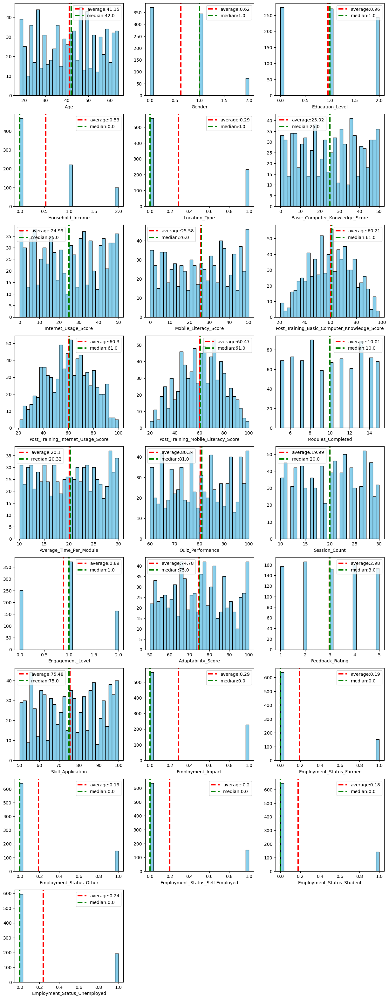

In [7]:
plt.figure(figsize=(15,40))
for ind,col in enumerate(df_encoded.columns):
    plt.subplot(9,3,ind+1)
    plt.hist(df_encoded[col], bins=30, color='skyblue', edgecolor='black')
    plt.xlabel(col)
    plt.axvline(np.round(df_encoded[col].mean(),2), color='r', linestyle='dashed', linewidth=3)
    plt.axvline(np.round(df_encoded[col].median(),2), color='g', linestyle='dashed', linewidth=3)
    plt.legend([f'average:{np.round(df_encoded[col].mean(),2)}',f'median:{np.round(df_encoded[col].median(),2)}'])
plt.show()

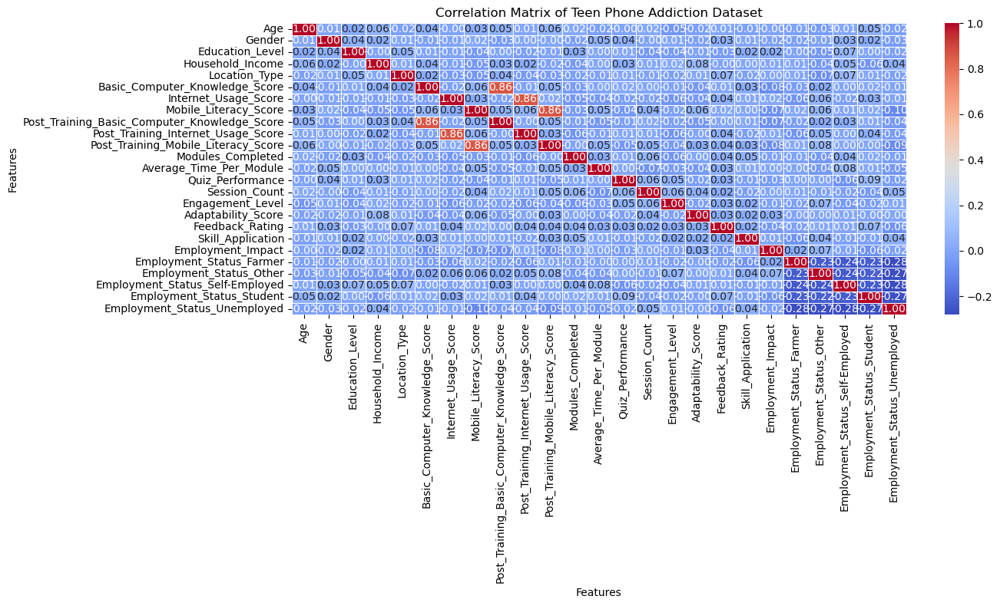

In [8]:
correlation_matrix = df_encoded.corr(numeric_only=True)

plt.figure(figsize=(14, 8))
seaborn.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix of Teen Phone Addiction Dataset")
plt.xlabel("Features")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

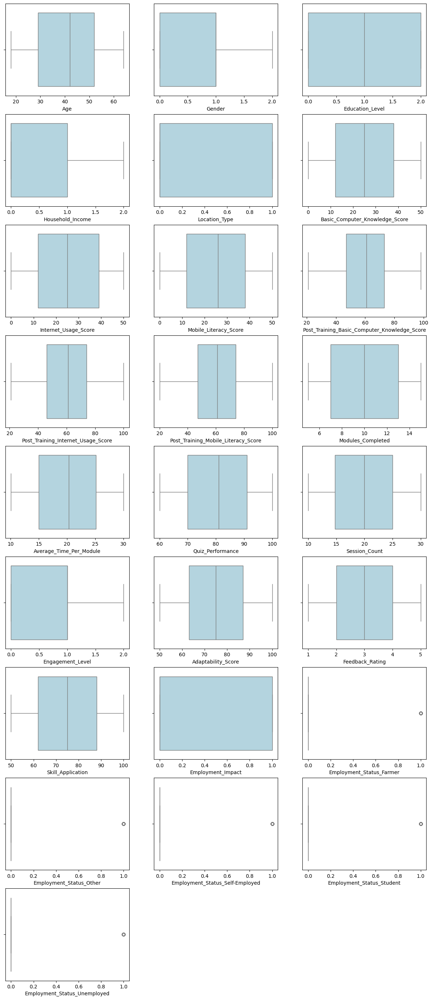

In [9]:
fig = plt.figure(figsize=(15,35))
for i, col in enumerate(df_encoded.columns):
  plt.subplot(9,3,i+1)
  seaborn.boxplot(x = df_encoded[col], color='lightblue')
  plt.xlabel(col)

## MinMax, Standard Scaler or Robust Scaler

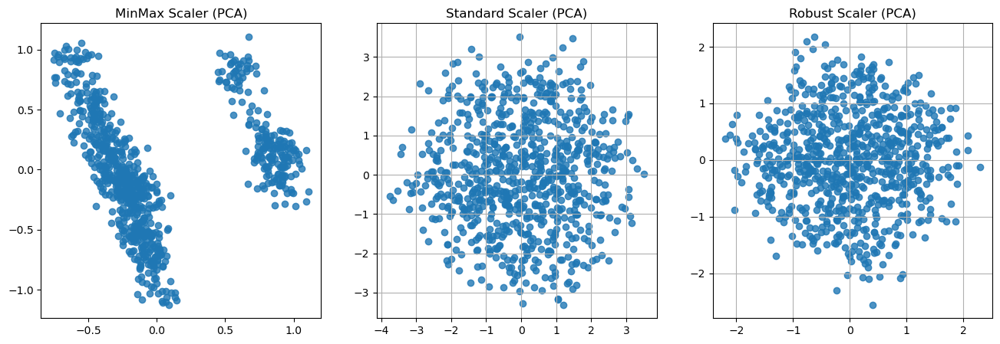

In [10]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.decomposition import PCA
minmax_scaler = MinMaxScaler()
std_scaler = StandardScaler()
rbs_scaler = RobustScaler()

df_minmax= minmax_scaler.fit_transform(df_encoded)
df_minmax = pd.DataFrame(df_minmax, columns=df_encoded.columns)

pca_minmax = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result_minmax = pca_minmax.fit_transform(df_minmax)

df_std= std_scaler.fit_transform(df_encoded)
df_std = pd.DataFrame(df_std, columns=df_encoded.columns)

pca_std = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result_std = pca_std.fit_transform(df_std)

df_rbs= rbs_scaler.fit_transform(df_encoded)
df_rbs = pd.DataFrame(df_rbs, columns=df_encoded.columns)

pca_rbs = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result_rbs = pca_rbs.fit_transform(df_rbs)

plt.figure(figsize=(16, 5))
plt.subplot(1, 3,1)
plt.scatter(pca_result_minmax[:, 0], pca_result_minmax[:, 1], alpha=0.8)
plt.title(f"MinMax Scaler (PCA)")
#plt.grid()

plt.subplot(1, 3,2)
plt.scatter(pca_result_std[:, 0], pca_result_std[:, 1], alpha=0.8)
plt.title(f"Standard Scaler (PCA)")
plt.grid()
#plt.show()

plt.subplot(1, 3,3)
plt.scatter(pca_result_rbs[:, 0], pca_result_rbs[:, 1], alpha=0.8)
plt.title(f"Robust Scaler (PCA)")
plt.grid()
plt.show()

df_scaled=df_minmax

In [11]:
def importance_pca(pca:PCA,title:str="PCA Feature Importance"):
    loadings = pca.components_.T  # shape: [n_features, n_components]
    importance = pd.DataFrame(
        loadings,
        index=df_encoded.columns,
        columns=[f'PC{i+1}' for i in range(loadings.shape[1])]
    )
    importance=importance.abs()
    importance=importance.max(axis=1,)
    importance=importance.sort_values(ascending=False)
    plt.figure(figsize=(10, 6))
    importance.sort_values(ascending=True).plot(kind="barh")
    plt.title(title)
    plt.xlabel("Max |Feature| across PCs")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()
    print(importance.head(4))

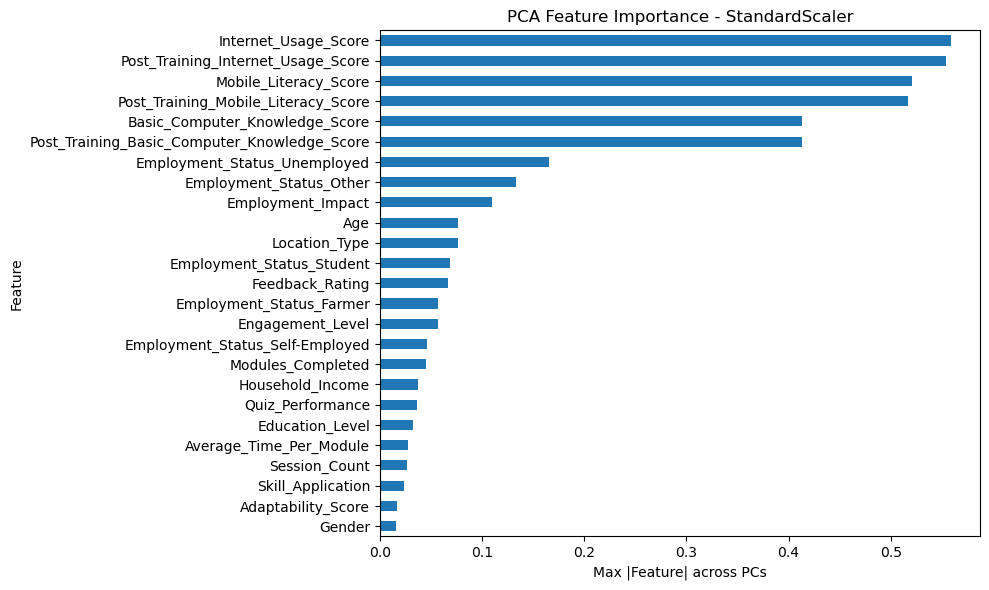

Internet_Usage_Score                   0.559333
Post_Training_Internet_Usage_Score     0.553624
Mobile_Literacy_Score                  0.521213
Post_Training_Mobile_Literacy_Score    0.517199
dtype: float64


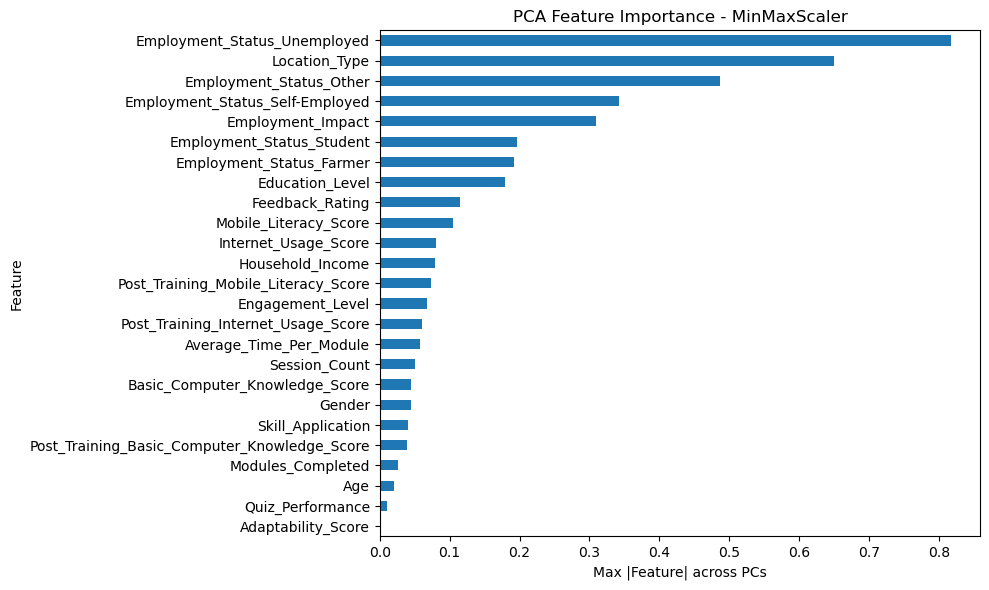

Employment_Status_Unemployed       0.817815
Location_Type                      0.649794
Employment_Status_Other            0.486448
Employment_Status_Self-Employed    0.342381
dtype: float64


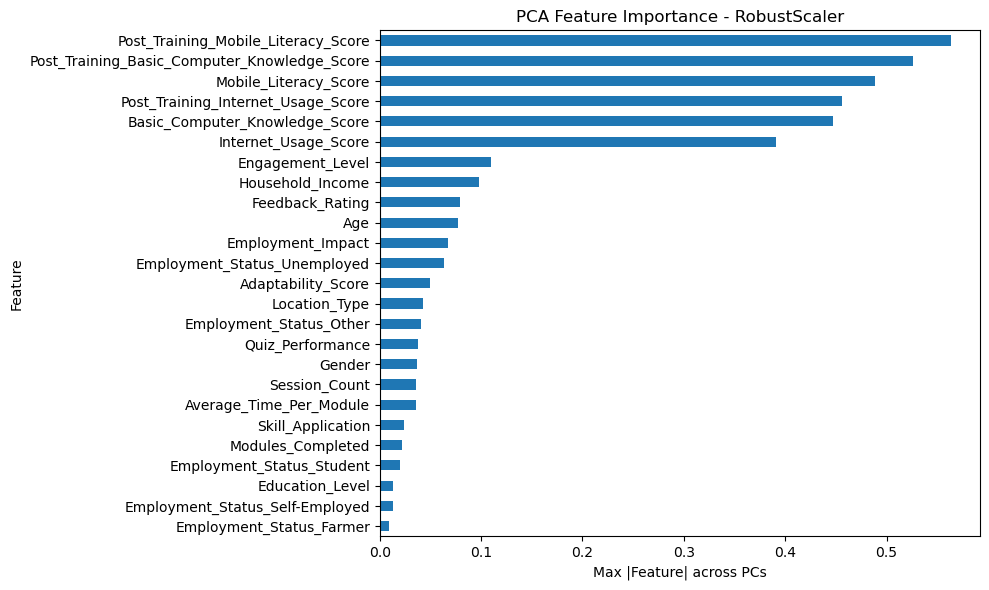

Post_Training_Mobile_Literacy_Score             0.563991
Post_Training_Basic_Computer_Knowledge_Score    0.526315
Mobile_Literacy_Score                           0.488504
Post_Training_Internet_Usage_Score              0.455814
dtype: float64


In [12]:
importance_pca(pca_std,title="PCA Feature Importance - StandardScaler")
importance_pca(pca_minmax,title="PCA Feature Importance - MinMaxScaler")
importance_pca(pca_rbs,title="PCA Feature Importance - RobustScaler")

## Kmeans

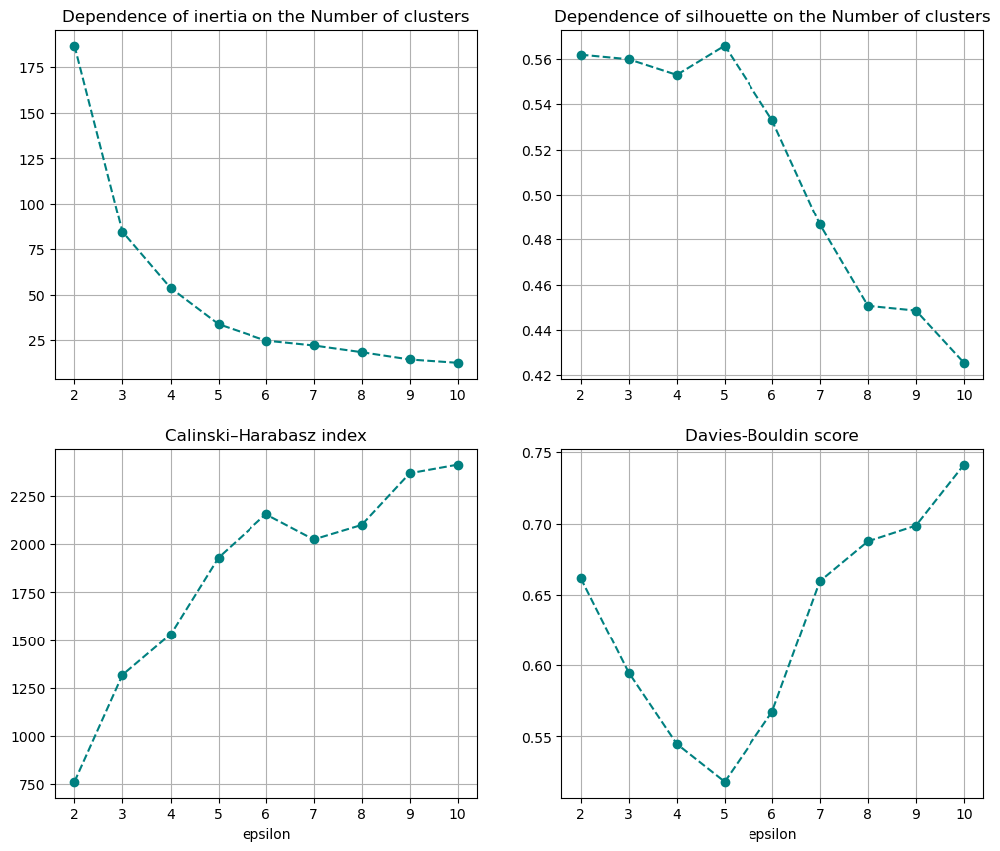

In [13]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score


results=pd.DataFrame(columns=['Model','Silhouette score','Calinski–Harabasz index','Davies-Bouldin score'])

cols = ['Cluster',"Cluster_Name"]
data = df_scaled.drop(['Cluster', 'Cluster_Name'], axis=1) if all(col in df_scaled.columns for col in cols) else df_scaled.copy()

pca = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result = pca.fit_transform(data)

inertia = []
siluette = []
k_values = range(2, 11)

calinski = []
davies = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=18)
    kmeans.fit(pca_result)
    inertia.append(kmeans.inertia_)
    if len(set(kmeans.labels_)) > 1:
        siluette.append(silhouette_score(pca_result, kmeans.labels_))
        calinski.append(calinski_harabasz_score(pca_result, kmeans.labels_))
        davies.append(davies_bouldin_score(pca_result, kmeans.labels_))

plt.figure(figsize=(12, 10))
plt.subplot(2, 2, 1)
plt.plot(k_values, inertia, 'o',linestyle='--', color='teal')
plt.title(f"Dependence of inertia on the Number of clusters")
plt.xticks(k_values)
plt.grid()

plt.subplot(2, 2, 2)
plt.plot(k_values, siluette, 'o',linestyle='--', color='teal')
plt.title(f"Dependence of silhouette on the Number of clusters")
plt.xticks(k_values)
plt.grid()

plt.subplot(2, 2, 3)
plt.plot(k_values, calinski, 'o',linestyle='--', color='teal')
plt.title(f"Calinski–Harabasz index") #Higher = better
plt.xticks(k_values)
plt.xlabel("epsilon")
plt.grid()

plt.subplot(2, 2, 4)
plt.plot(k_values, davies, 'o',linestyle='--', color='teal')
plt.title(f"Davies-Bouldin score") #Higher = better
plt.xticks(k_values)
plt.xlabel("epsilon")
plt.grid()

plt.show()


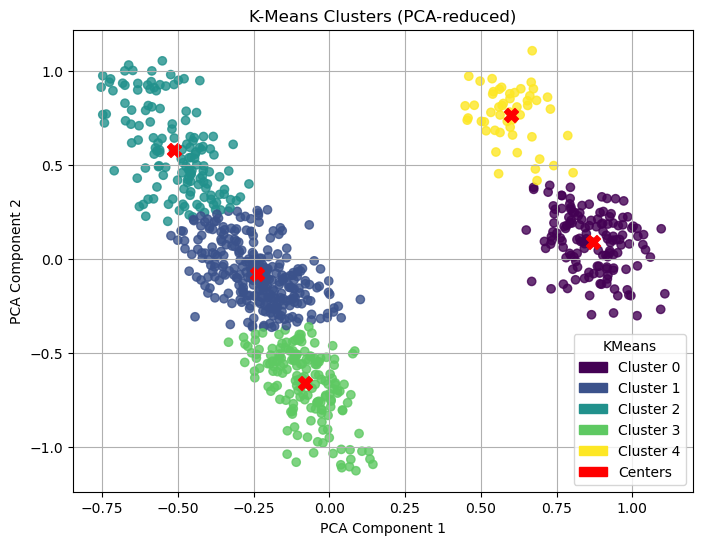

In [14]:
import matplotlib.patches as mpatches

kmeans = KMeans(n_clusters=5, random_state=18)
df_scaled['Cluster'] = kmeans.fit_predict(pca_result)

results.loc[len(results)]=[
    'KMeans',
    silhouette_score(pca_result, kmeans.labels_),
    calinski_harabasz_score(pca_result, kmeans.labels_),
    davies_bouldin_score(pca_result, kmeans.labels_)]

plt.figure(figsize=(8, 6))

scatter = plt.scatter(
    pca_result[:, 0], pca_result[:, 1],
    c=df_scaled['Cluster'], cmap='viridis', alpha=0.8
)

centers = kmeans.cluster_centers_
plt.scatter(
    centers[:, 0], centers[:, 1],
    c='red', s=100, marker='X'
)

unique_clusters = np.unique(df_scaled['Cluster'])
colors = [scatter.cmap(scatter.norm(c)) for c in unique_clusters]

cluster_handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {cluster}")
    for i, cluster in enumerate(unique_clusters)
]
center_handle = mpatches.Patch(color='red', label='Centers')

plt.legend(handles=cluster_handles + [center_handle], title="KMeans", loc="lower right")

plt.title('K-Means Clusters (PCA-reduced)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.grid(True)
plt.show()


In [15]:
centers_pca=kmeans.cluster_centers_
centers_scaled = pca.inverse_transform(centers_pca)
centers_original = minmax_scaler.inverse_transform(centers_scaled)
cluster_profiles = pd.DataFrame(
    centers_original,
    columns=df_encoded.columns  # original features
)
cluster_profiles.round(2)

,Age,Gender,Education_Level,Household_Income,Location_Type,Basic_Computer_Knowledge_Score,Internet_Usage_Score,Mobile_Literacy_Score,Post_Training_Basic_Computer_Knowledge_Score,Post_Training_Internet_Usage_Score,...,Engagement_Level,Adaptability_Score,Feedback_Rating,Skill_Application,Employment_Impact,Employment_Status_Farmer,Employment_Status_Other,Employment_Status_Self-Employed,Employment_Status_Student,Employment_Status_Unemployed
0,40.36,0.55,0.82,0.61,0.12,23.81,24.49,20.60,57.88,58.77,...,0.97,74.67,2.60,77.18,0.29,0.02,0.07,-0.08,0.01,0.98
1,41.35,0.64,0.98,0.50,0.31,25.23,25.35,27.20,60.70,60.98,...,0.88,74.81,3.08,75.05,0.31,0.25,0.25,0.26,0.23,0.03
2,41.88,0.70,1.27,0.59,0.81,27.16,22.73,25.41,63.41,58.17,...,0.76,74.80,3.32,74.04,0.09,0.23,-0.05,0.53,0.29,-0.01
3,40.96,0.59,0.74,0.42,-0.11,23.67,27.66,29.21,58.55,63.55,...,0.97,74.82,2.90,75.78,0.49,0.27,0.51,0.04,0.18,-0.01
4,40.90,0.61,1.12,0.70,0.63,25.77,21.81,18.72,60.62,55.88,...,0.85,74.66,2.85,76.16,0.07,0.00,-0.24,0.20,0.08,0.96


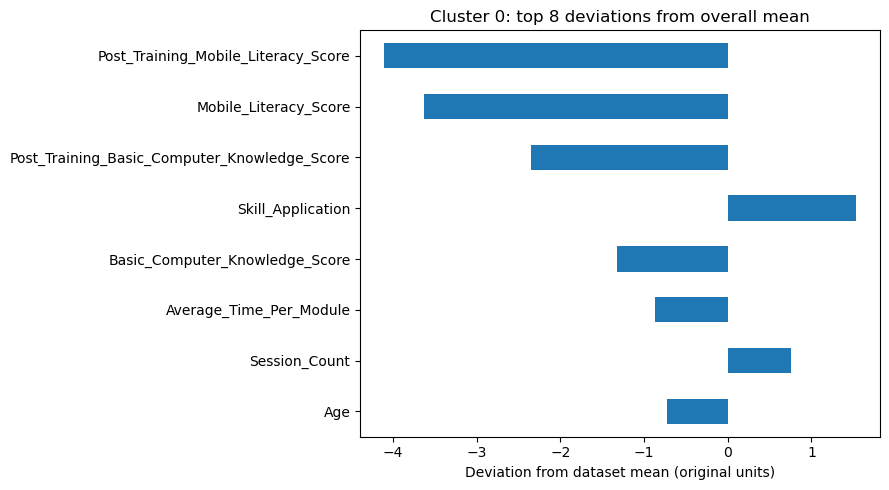

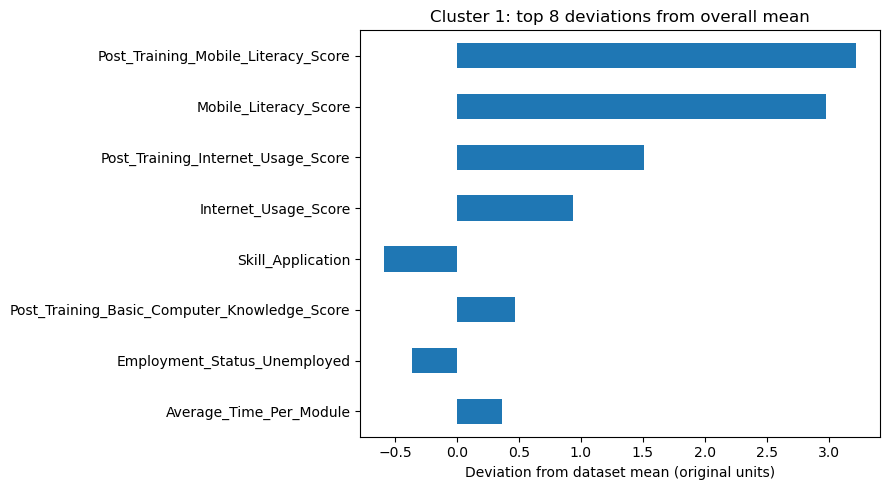

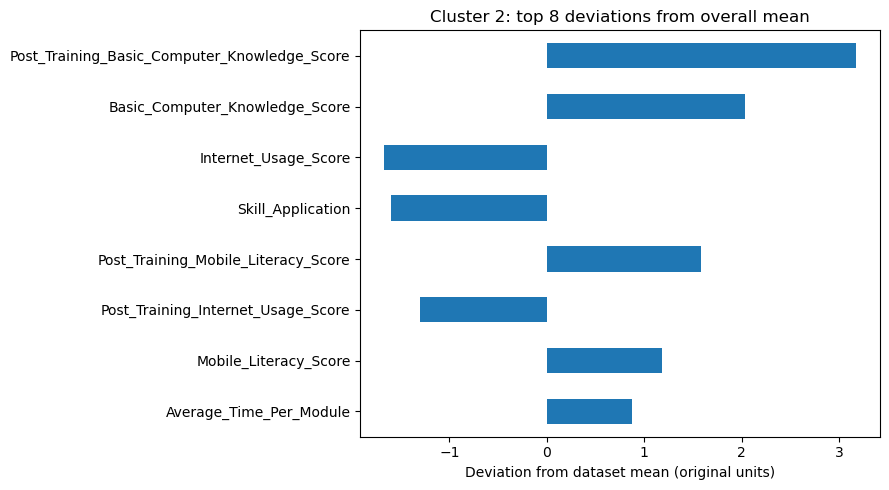

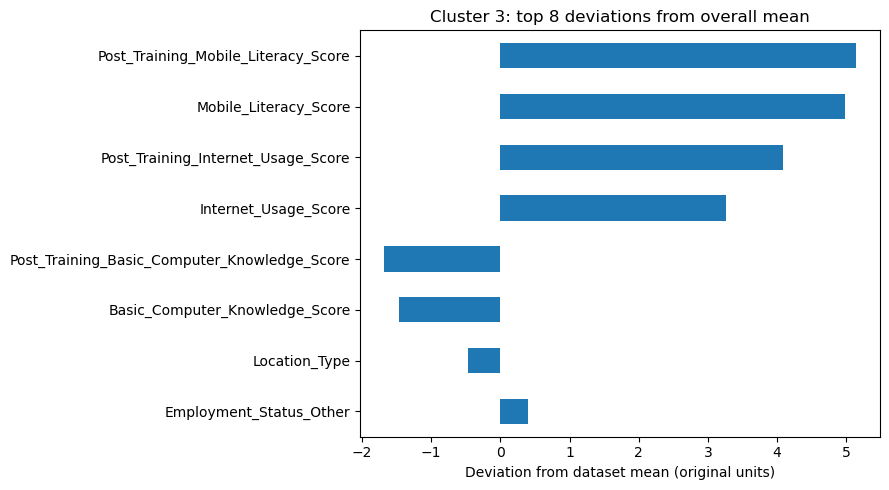

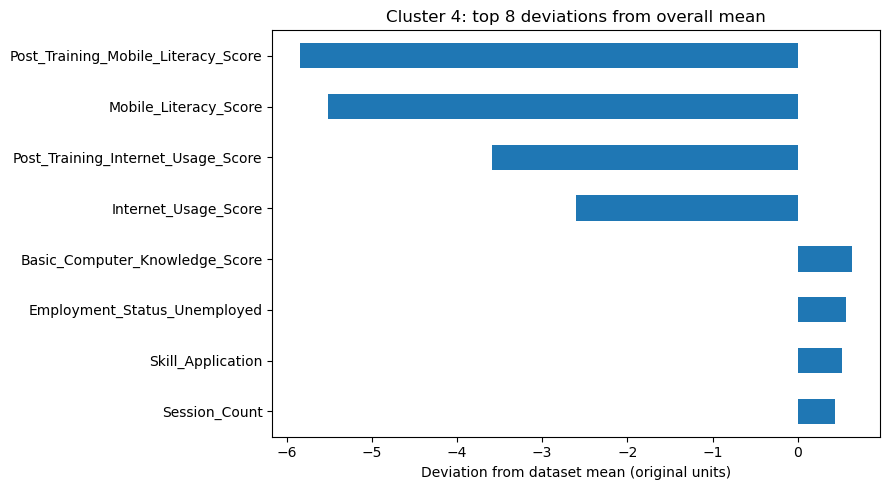

In [16]:
k = 8  # how many top features to show
overall_mean = cluster_profiles.mean(axis=0)
deviation = cluster_profiles - overall_mean   # same units as original features

for i in range(deviation.shape[0]):
    dev_sorted = deviation.iloc[i].sort_values(key=np.abs, ascending=False).head(k)
    plt.figure(figsize=(9, 5))
    dev_sorted.plot(kind='barh')
    plt.gca().invert_yaxis()
    plt.title(f'Cluster {i}: top {k} deviations from overall mean')
    plt.xlabel('Deviation from dataset mean (original units)')
    plt.tight_layout()
    plt.show()


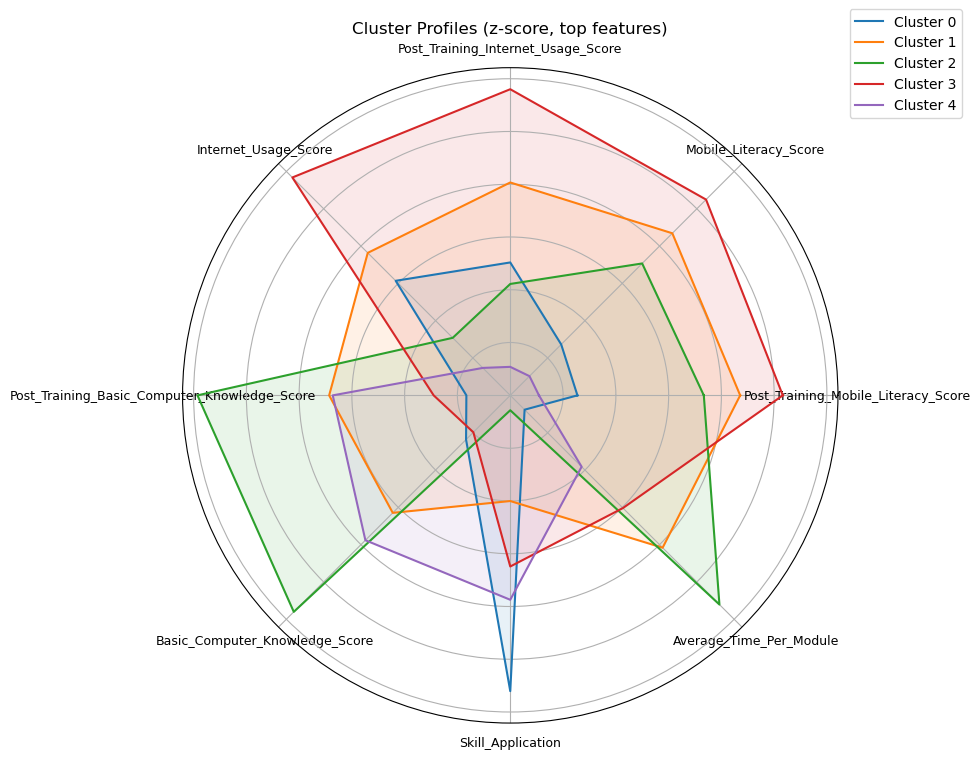

In [17]:
def radar_all_clusters(cp, features,fig):
    import numpy as np
    import matplotlib.pyplot as plt

    subset = cp[features]
    # z-score normalization per feature (so scales are comparable)
    z = (subset - subset.mean(axis=0)) / (subset.std(axis=0) + 1e-9)

    angles = np.linspace(0, 2*np.pi, len(features), endpoint=False)
    angles = np.concatenate([angles, angles[:1]])  # close circle

    fig = plt.figure(figsize=fig)
    ax = plt.subplot(111, polar=True)

    # Plot each cluster
    for cluster_id in z.index:
        vals = z.loc[cluster_id].values
        vals = np.concatenate([vals, vals[:1]])  # close circle
        ax.plot(angles, vals, label=f"Cluster {cluster_id}")
        ax.fill(angles, vals, alpha=0.1)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(features, fontsize=9)
    ax.set_yticklabels([])
    ax.set_title("Cluster Profiles (z-score, top features)")
    ax.legend(loc="upper right", bbox_to_anchor=(1.2, 1.1))
    plt.tight_layout()
    plt.show()


# Example usage:
key_features = cluster_profiles.var().sort_values(ascending=False).head(8).index.tolist()
radar_all_clusters(cluster_profiles, key_features,fig=(10,10))


## DBSCAN

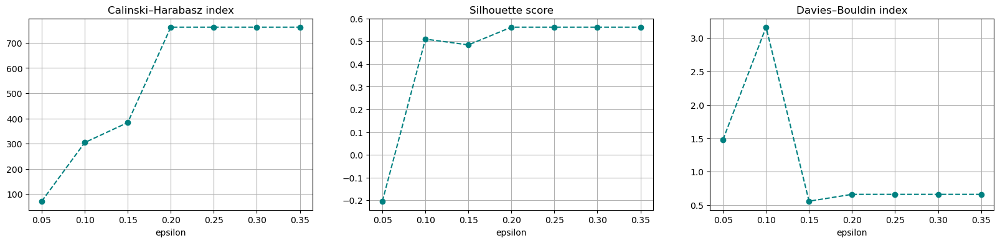

In [18]:
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score

cols = ['Cluster']
data = df_scaled.drop(['Cluster'], axis=1) if all(col in df_scaled.columns for col in cols) else df_scaled.copy()

pca = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result = pca.fit_transform(data)

calinski = []
siluette = []
davies = []

eps=np.arange(0.05,0.4,0.05).round(4)

for ep in eps:
    dbscan = DBSCAN(eps=ep, min_samples=5)
    dbscan_labels = dbscan.fit_predict(pca_result)
    calinski.append(calinski_harabasz_score(pca_result, dbscan_labels))
    siluette.append(silhouette_score(pca_result, dbscan_labels))
    davies.append(davies_bouldin_score(pca_result, dbscan_labels))


plt.figure(figsize=(20, 4))
plt.subplot(1, 3, 1)
plt.plot(eps, calinski, 'o',linestyle='--', color='teal')
plt.title(f"Calinski–Harabasz index") #Higher = better
plt.xticks(eps)
plt.xlabel("epsilon")
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(eps, siluette, 'o',linestyle='--', color='teal')
plt.title(f"Silhouette score") #Higher = better
plt.xticks(eps)
plt.xlabel("epsilon")
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(eps, davies, 'o',linestyle='--', color='teal')
plt.title(f"Davies–Bouldin index") #Lower = better
plt.xticks(eps)
plt.xlabel("epsilon")
plt.grid()

plt.show()

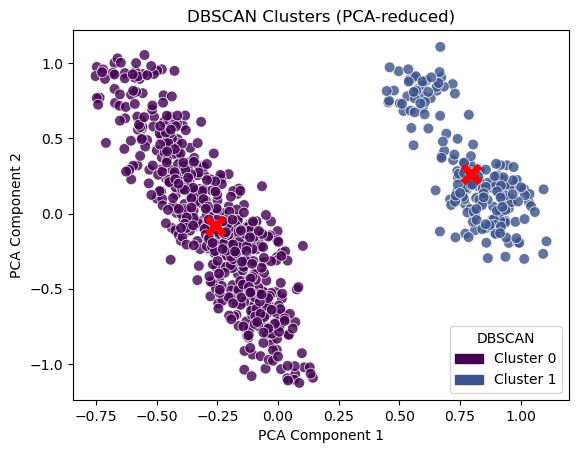

In [19]:
from sklearn.metrics import pairwise_distances_argmin_min

dbscan = DBSCAN(eps=0.2, min_samples=5)
df_scaled['Cluster']  = dbscan.fit_predict(pca_result)

results.loc[len(results)]=[
    'DBSCAN',
    silhouette_score(pca_result, df_scaled['Cluster']),
    calinski_harabasz_score(pca_result, df_scaled['Cluster']),
    davies_bouldin_score(pca_result, df_scaled['Cluster'])]

unique_clusters = np.unique(df_scaled['Cluster'])
colors = [scatter.cmap(scatter.norm(c)) for c in unique_clusters]

cluster_handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {cluster}")
    for i, cluster in enumerate(unique_clusters)
]
seaborn.scatterplot(
        x=pca_result[:,0], y=pca_result[:, 1],
        hue=df_scaled['Cluster'] ,
        palette=colors,
        legend='full',
        alpha=0.8,
        s=60,
    )


medoids = []
for c in unique_clusters:
    cluster_points = pca_result[df_scaled['Cluster'] == c]
    mean = cluster_points.mean(axis=0)
    idx, _ = pairwise_distances_argmin_min([mean], cluster_points)
    medoids.append(cluster_points[idx[0]])

medoids = np.array(medoids)

plt.scatter(
    medoids[:, 0], medoids[:, 1],
    c="red", s=150, marker="x",linewidths=5, label="Medoids"
)
plt.legend()

plt.legend(handles=cluster_handles, title="DBSCAN", loc="lower right")
plt.title("DBSCAN Clusters (PCA-reduced)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

In [20]:
centers_dbscan=medoids
centers_scaled = pca.inverse_transform(centers_dbscan)
centers_original = minmax_scaler.inverse_transform(centers_scaled)
cluster_profiles = pd.DataFrame(
    centers_original,
    columns=df_encoded.columns  # original features
)
cluster_profiles.round(2)

,Age,Gender,Education_Level,Household_Income,Location_Type,Basic_Computer_Knowledge_Score,Internet_Usage_Score,Mobile_Literacy_Score,Post_Training_Basic_Computer_Knowledge_Score,Post_Training_Internet_Usage_Score,...,Engagement_Level,Adaptability_Score,Feedback_Rating,Skill_Application,Employment_Impact,Employment_Status_Farmer,Employment_Status_Other,Employment_Status_Self-Employed,Employment_Status_Student,Employment_Status_Unemployed
0,41.37,0.64,0.98,0.50,0.31,25.26,25.36,27.31,60.75,61.01,...,0.87,74.81,3.09,75.02,0.31,0.25,0.25,0.26,0.23,0.01
1,40.50,0.56,0.90,0.63,0.25,24.32,23.80,20.13,58.59,58.03,...,0.94,74.67,2.66,76.91,0.23,0.01,-0.01,-0.00,0.03,0.97


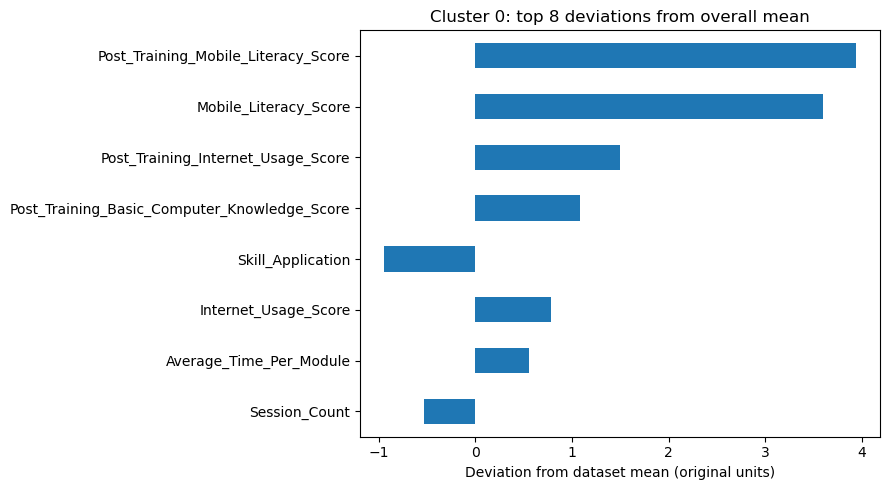

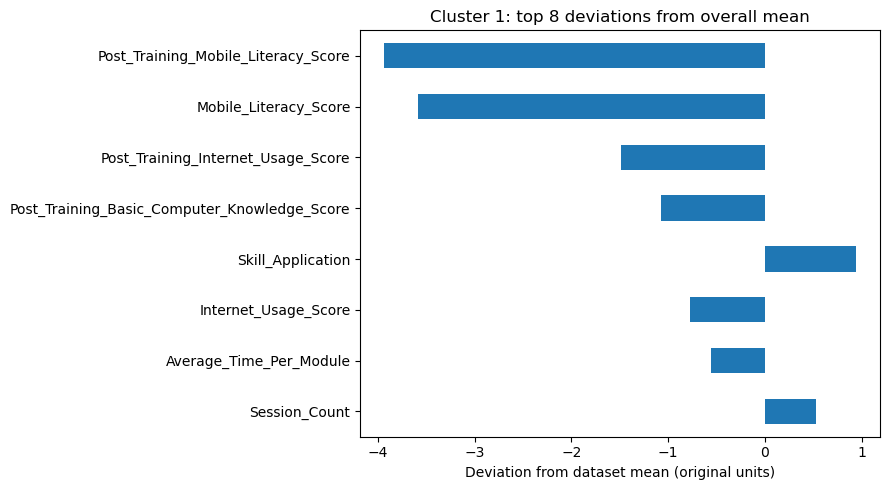

In [21]:
k = 8  # how many top features to show
overall_mean = cluster_profiles.mean(axis=0)
deviation = cluster_profiles - overall_mean   # same units as original features

for i in range(deviation.shape[0]):
    dev_sorted = deviation.iloc[i].sort_values(key=np.abs, ascending=False).head(k)
    plt.figure(figsize=(9, 5))
    dev_sorted.plot(kind='barh')
    plt.gca().invert_yaxis()
    plt.title(f'Cluster {i}: top {k} deviations from overall mean')
    plt.xlabel('Deviation from dataset mean (original units)')
    plt.tight_layout()
    plt.show()

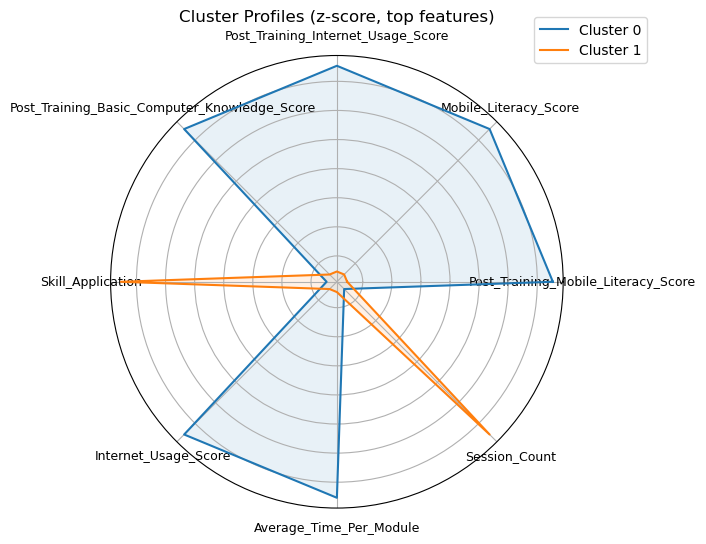

In [22]:
key_features = cluster_profiles.var().sort_values(ascending=False).head(8).index.tolist()
radar_all_clusters(cluster_profiles, key_features,fig=(7,7))

## Hierarchical Agglomerative clustering

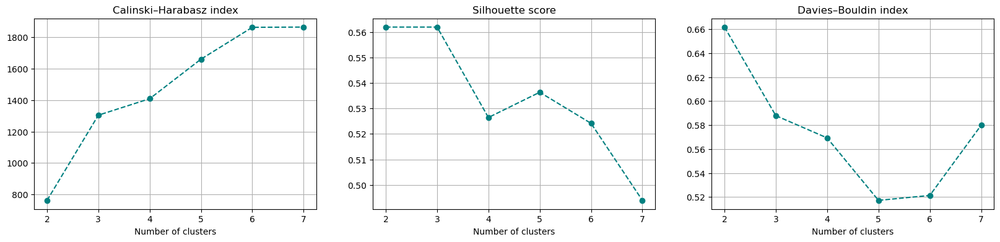

In [23]:
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score

cols = ['Cluster']
data = df_scaled.drop(['Cluster'], axis=1) if all(col in df_scaled.columns for col in cols) else df_scaled.copy()

pca = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result = pca.fit_transform(data)

calinski = []
siluette = []
davies = []

num_cluster=np.arange(2,8)

for num in num_cluster:
    aggclust = AgglomerativeClustering(n_clusters=num)
    aggclust_labels = aggclust.fit_predict(pca_result)
    calinski.append(calinski_harabasz_score(pca_result, aggclust_labels))
    siluette.append(silhouette_score(pca_result, aggclust_labels))
    davies.append(davies_bouldin_score(pca_result, aggclust_labels))

plt.figure(figsize=(20, 4))
plt.subplot(1, 3, 1)
plt.plot(num_cluster, calinski, 'o',linestyle='--', color='teal')
plt.title(f"Calinski–Harabasz index") #Higher = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(num_cluster, siluette, 'o',linestyle='--', color='teal')
plt.title(f"Silhouette score") #Higher = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(num_cluster, davies, 'o',linestyle='--', color='teal')
plt.title(f"Davies–Bouldin index") #Lower = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.show()

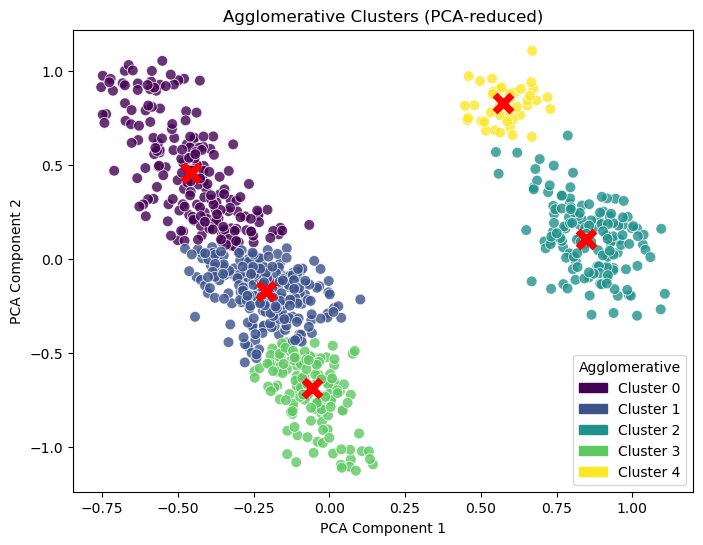

In [24]:
from sklearn.metrics import pairwise_distances_argmin_min

aggclust = AgglomerativeClustering(n_clusters=5)
df_scaled['Cluster']  = aggclust.fit_predict(pca_result)
results.loc[len(results)]=[
    'Agglomerative Clustering',
    silhouette_score(pca_result, df_scaled['Cluster']),
    calinski_harabasz_score(pca_result, df_scaled['Cluster']),
    davies_bouldin_score(pca_result, df_scaled['Cluster'])]

unique_clusters = np.unique(df_scaled['Cluster'])
colors = [scatter.cmap(scatter.norm(c)) for c in unique_clusters]

cluster_handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {cluster}")
    for i, cluster in enumerate(unique_clusters)
]
plt.figure(figsize=(8,6))

seaborn.scatterplot(
        x=pca_result[:,0], y=pca_result[:, 1],
        hue=df_scaled['Cluster'] ,
        palette=colors,
        legend='full',
        alpha=0.8,
        s=60,
    )

medoids = []
for c in unique_clusters:
    cluster_points = pca_result[df_scaled['Cluster'] == c]
    # index of closest point to cluster mean
    mean = cluster_points.mean(axis=0)
    idx, _ = pairwise_distances_argmin_min([mean], cluster_points)
    medoids.append(cluster_points[idx[0]])

medoids = np.array(medoids)

plt.scatter(
    medoids[:, 0], medoids[:, 1],
    c="red", s=150, marker="x",linewidths=5, label="Medoids"
)
plt.legend(handles=cluster_handles, title="Agglomerative", loc="lower right")
plt.title("Agglomerative Clusters (PCA-reduced)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

In [25]:
centers_dbscan=medoids
centers_scaled = pca.inverse_transform(centers_dbscan)
centers_original = minmax_scaler.inverse_transform(centers_scaled)
cluster_profiles = pd.DataFrame(
    centers_original,
    columns=df_encoded.columns  # original features
)
cluster_profiles.round(2)

,Age,Gender,Education_Level,Household_Income,Location_Type,Basic_Computer_Knowledge_Score,Internet_Usage_Score,Mobile_Literacy_Score,Post_Training_Basic_Computer_Knowledge_Score,Post_Training_Internet_Usage_Score,...,Engagement_Level,Adaptability_Score,Feedback_Rating,Skill_Application,Employment_Impact,Employment_Status_Farmer,Employment_Status_Other,Employment_Status_Self-Employed,Employment_Status_Student,Employment_Status_Unemployed
0,41.77,0.69,1.21,0.57,0.71,26.78,23.23,25.74,62.88,58.70,...,0.78,74.80,3.28,74.24,0.13,0.23,0.00,0.48,0.28,0.00
1,41.28,0.63,0.94,0.49,0.24,24.97,25.72,27.50,60.34,61.39,...,0.89,74.81,3.05,75.18,0.34,0.25,0.29,0.22,0.22,0.02
2,40.39,0.55,0.83,0.61,0.13,23.88,24.42,20.63,57.99,58.71,...,0.96,74.67,2.61,77.13,0.28,0.02,0.06,-0.06,0.02,0.97
3,40.93,0.59,0.73,0.42,-0.14,23.56,27.78,29.22,58.39,63.66,...,0.98,74.82,2.88,75.85,0.50,0.27,0.53,0.02,0.18,-0.00
4,40.94,0.61,1.15,0.70,0.68,25.94,21.57,18.55,60.88,55.62,...,0.84,74.66,2.87,76.06,0.05,0.00,-0.27,0.23,0.08,0.95


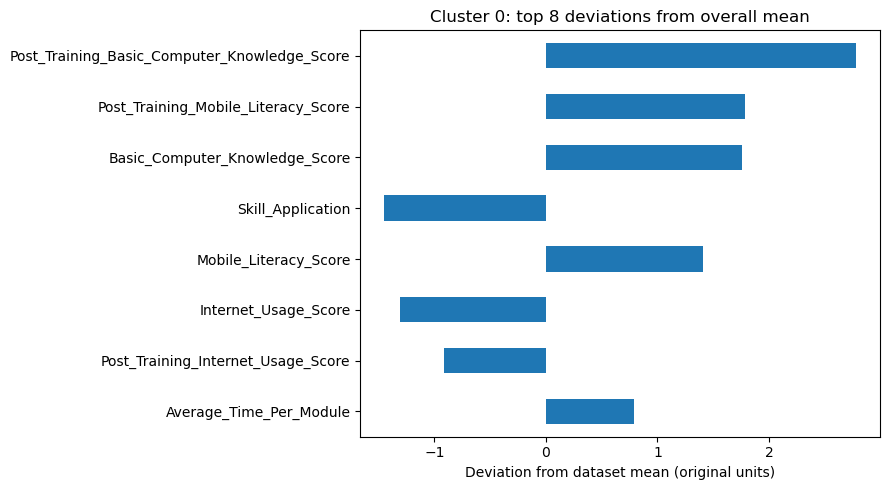

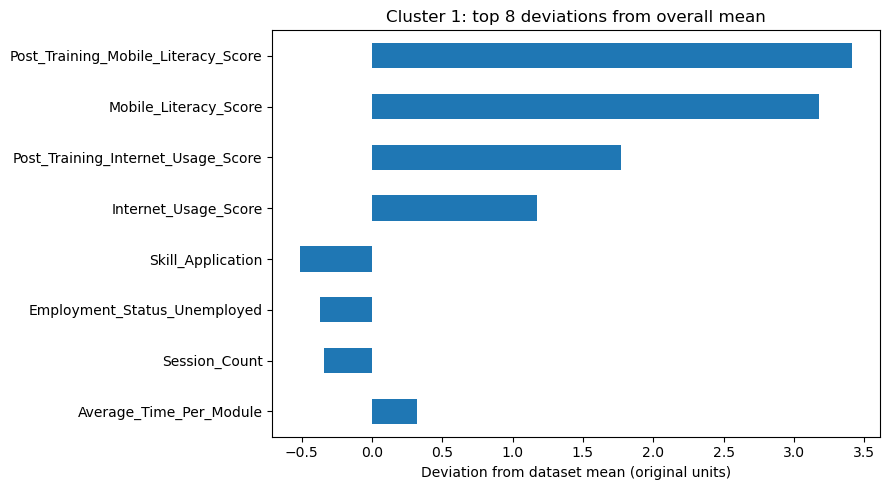

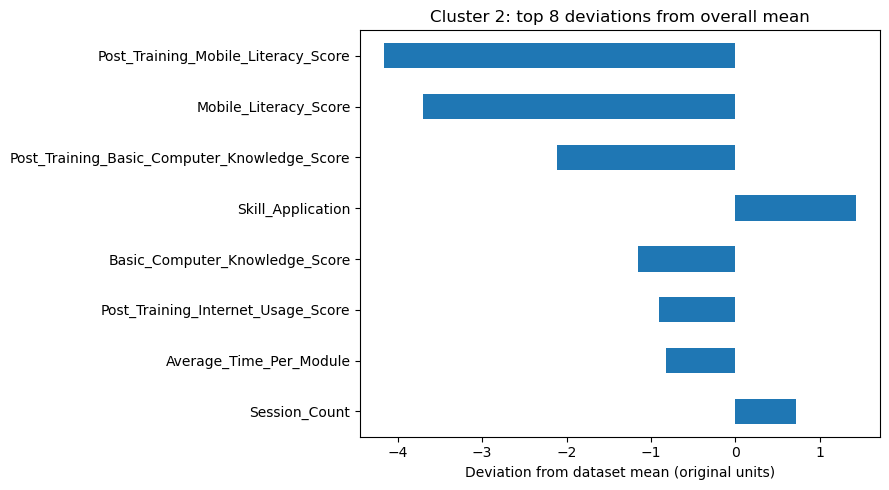

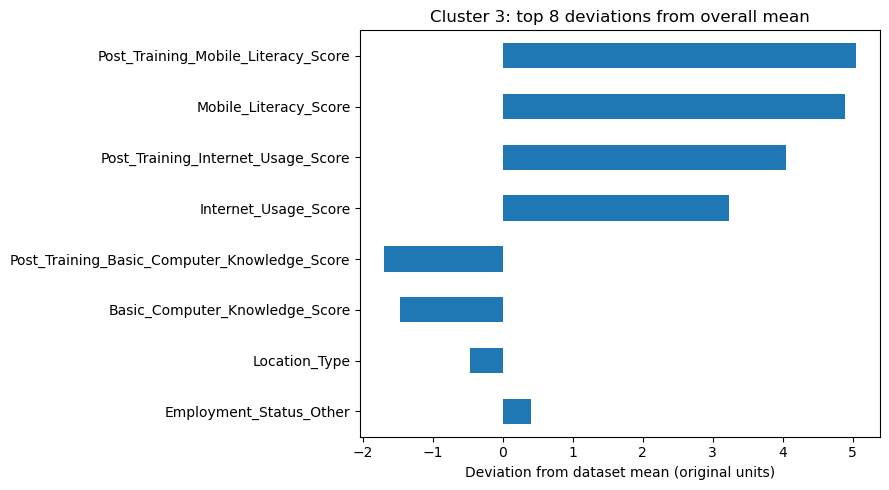

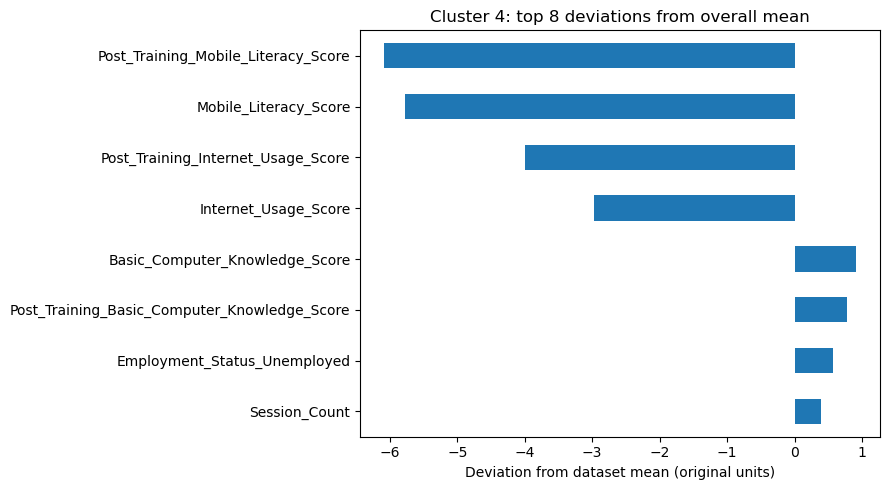

In [26]:
k = 8  # how many top features to show
overall_mean = cluster_profiles.mean(axis=0)
deviation = cluster_profiles - overall_mean   # same units as original features

for i in range(deviation.shape[0]):
    dev_sorted = deviation.iloc[i].sort_values(key=np.abs, ascending=False).head(k)
    plt.figure(figsize=(9, 5))
    dev_sorted.plot(kind='barh')
    plt.gca().invert_yaxis()
    plt.title(f'Cluster {i}: top {k} deviations from overall mean')
    plt.xlabel('Deviation from dataset mean (original units)')
    plt.tight_layout()
    plt.show()

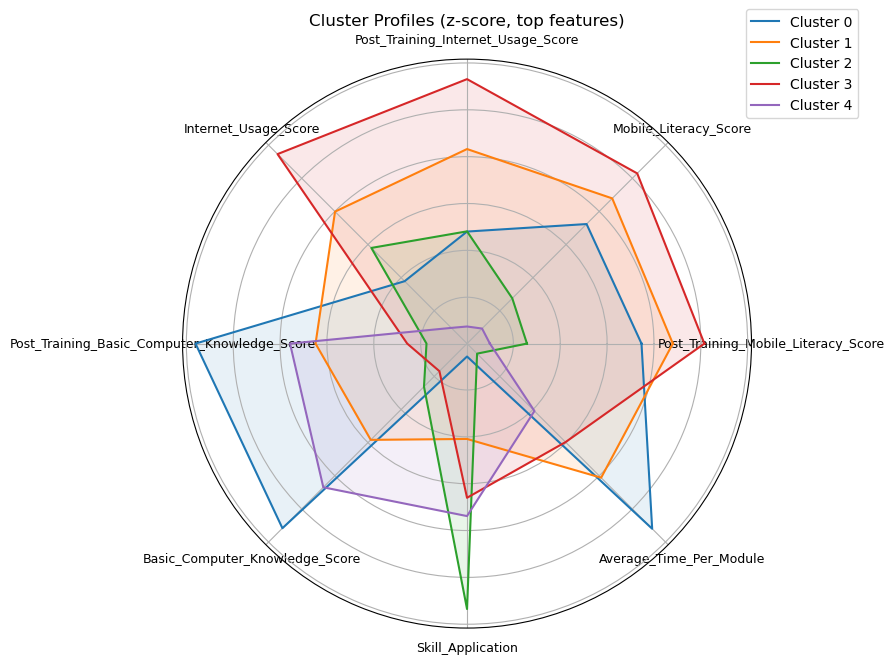

In [27]:
key_features = cluster_profiles.var().sort_values(ascending=False).head(8).index.tolist()
radar_all_clusters(cluster_profiles, key_features,fig=(9,9))

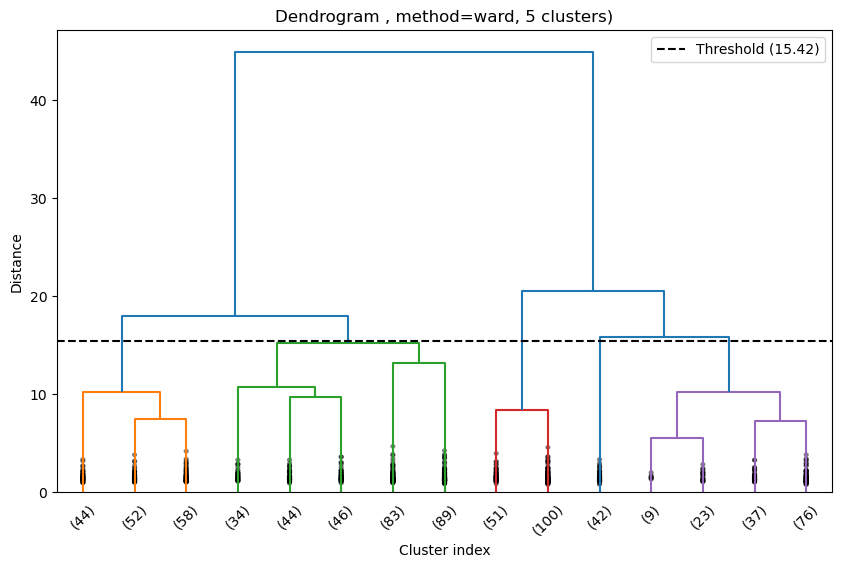

In [28]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

Z = linkage(df_scaled, method="ward")

# Determine the threshold that gives 4 clusters
max_d = 0.0
for t in np.linspace(0, np.max(Z[:, 2]), 100):
    if len(np.unique(fcluster(Z, t, criterion='distance'))) == 5:
        max_d = t
        break

# Plot dendrogram with color threshold
plt.figure(figsize=(10, 6))
dendrogram(
    Z,
    truncate_mode="lastp",
    p=15,
    leaf_rotation=45.,
    leaf_font_size=10.,
    show_contracted=True,
    color_threshold=max_d
)
plt.title(f"Dendrogram , method=ward, 5 clusters)")
plt.xlabel("Cluster index")
plt.ylabel("Distance")
plt.axhline(y=max_d, c='k', ls='--', label=f'Threshold ({round(max_d,2)})')
plt.legend()
plt.show()

## Mean Shift Clustering

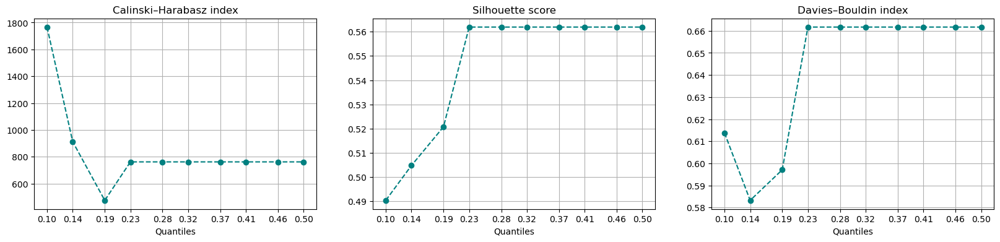

In [29]:
from sklearn.decomposition import PCA
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score

cols = ['Cluster']
data = df_scaled.drop(['Cluster'], axis=1) if all(col in df_scaled.columns for col in cols) else df_scaled.copy()

pca = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result = pca.fit_transform(data)

calinski = []
siluette = []
davies = []


quantiles=np.linspace(0.1, 0.5, 10).round(2)

for quantile in quantiles:
    bandwidth = estimate_bandwidth(pca_result, quantile=quantile, n_samples=500)
    ms = MeanShift(bandwidth=bandwidth,bin_seeding=True)
    ms_labels = ms.fit_predict(pca_result)
    calinski.append(calinski_harabasz_score(pca_result, ms_labels))
    siluette.append(silhouette_score(pca_result, ms_labels))
    davies.append(davies_bouldin_score(pca_result, ms_labels))


plt.figure(figsize=(20, 4))
plt.subplot(1, 3, 1)
plt.plot(quantiles, calinski, 'o',linestyle='--', color='teal')
plt.title(f"Calinski–Harabasz index") #Higher = better
plt.xticks(quantiles)
plt.xlabel("Quantiles")
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(quantiles, siluette, 'o',linestyle='--', color='teal')
plt.title(f"Silhouette score") #Higher = better
plt.xticks(quantiles)
plt.xlabel("Quantiles")
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(quantiles, davies, 'o',linestyle='--', color='teal')
plt.title(f"Davies–Bouldin index") #Lower = better
plt.xticks(quantiles)
plt.xlabel("Quantiles")
plt.grid()

plt.show()
print()

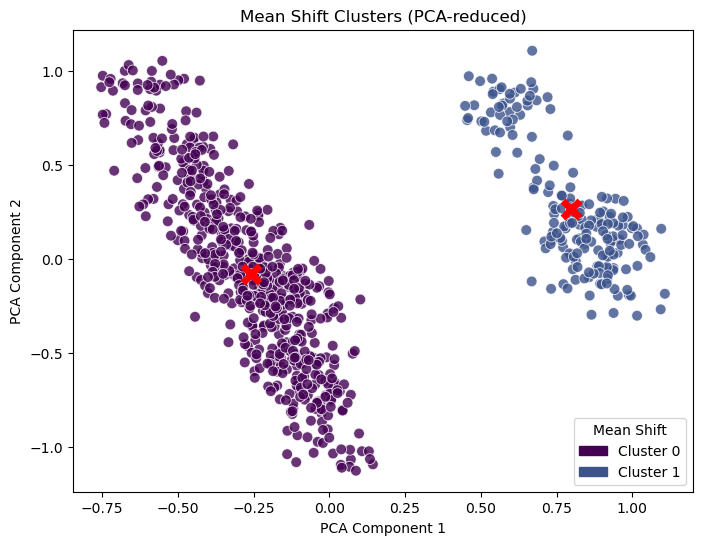

In [30]:
from sklearn.metrics import pairwise_distances_argmin_min

bandwidth = estimate_bandwidth(pca_result, quantile=0.25, n_samples=500)
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
df_scaled['Cluster']  = ms.fit_predict(pca_result)

results.loc[len(results)]=[
    'Mean Shift',
    silhouette_score(pca_result, df_scaled['Cluster']),
    calinski_harabasz_score(pca_result, df_scaled['Cluster']),
    davies_bouldin_score(pca_result, df_scaled['Cluster'])]

unique_clusters = np.unique(df_scaled['Cluster'])
colors = [scatter.cmap(scatter.norm(c)) for c in unique_clusters]

cluster_handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {cluster}")
    for i, cluster in enumerate(unique_clusters)
]
plt.figure(figsize=(8,6))

seaborn.scatterplot(
        x=pca_result[:,0], y=pca_result[:, 1],
        hue=df_scaled['Cluster'] ,
        palette=colors,
        legend='full',
        alpha=0.8,
        s=60,
    )

medoids = []
for c in unique_clusters:
    cluster_points = pca_result[df_scaled['Cluster'] == c]
    # index of closest point to cluster mean
    mean = cluster_points.mean(axis=0)
    idx, _ = pairwise_distances_argmin_min([mean], cluster_points)
    medoids.append(cluster_points[idx[0]])

medoids = np.array(medoids)

plt.scatter(
    medoids[:, 0], medoids[:, 1],
    c="red", s=150, marker="x",linewidths=5, label="Medoids"
)
plt.legend(handles=cluster_handles, title="Mean Shift", loc="lower right")
plt.title("Mean Shift Clusters (PCA-reduced)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

In [31]:
centers_dbscan=medoids
centers_scaled = pca.inverse_transform(centers_dbscan)
centers_original = minmax_scaler.inverse_transform(centers_scaled)
cluster_profiles = pd.DataFrame(
    centers_original,
    columns=df_encoded.columns  # original features
)
cluster_profiles.round(2)

,Age,Gender,Education_Level,Household_Income,Location_Type,Basic_Computer_Knowledge_Score,Internet_Usage_Score,Mobile_Literacy_Score,Post_Training_Basic_Computer_Knowledge_Score,Post_Training_Internet_Usage_Score,...,Engagement_Level,Adaptability_Score,Feedback_Rating,Skill_Application,Employment_Impact,Employment_Status_Farmer,Employment_Status_Other,Employment_Status_Self-Employed,Employment_Status_Student,Employment_Status_Unemployed
0,41.37,0.64,0.98,0.50,0.31,25.26,25.36,27.31,60.75,61.01,...,0.87,74.81,3.09,75.02,0.31,0.25,0.25,0.26,0.23,0.01
1,40.50,0.56,0.90,0.63,0.25,24.32,23.80,20.13,58.59,58.03,...,0.94,74.67,2.66,76.91,0.23,0.01,-0.01,-0.00,0.03,0.97


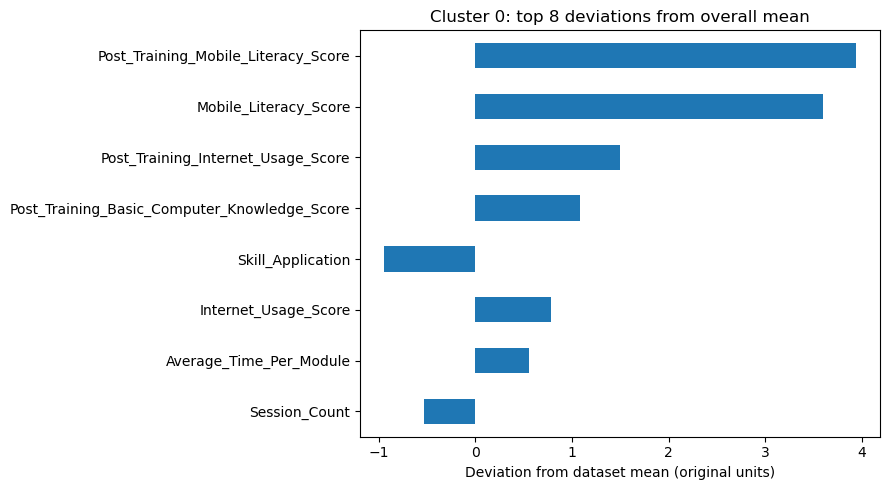

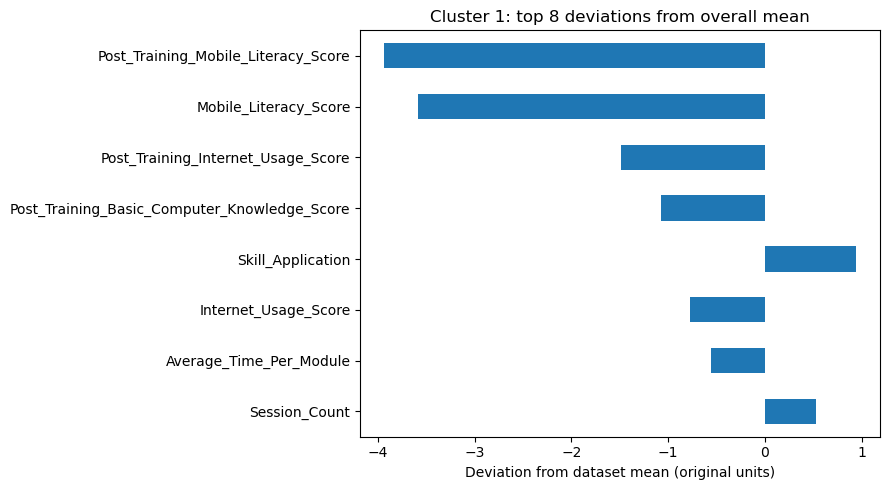

In [32]:
k = 8  # how many top features to show
overall_mean = cluster_profiles.mean(axis=0)
deviation = cluster_profiles - overall_mean   # same units as original features

for i in range(deviation.shape[0]):
    dev_sorted = deviation.iloc[i].sort_values(key=np.abs, ascending=False).head(k)
    plt.figure(figsize=(9, 5))
    dev_sorted.plot(kind='barh')
    plt.gca().invert_yaxis()
    plt.title(f'Cluster {i}: top {k} deviations from overall mean')
    plt.xlabel('Deviation from dataset mean (original units)')
    plt.tight_layout()
    plt.show()

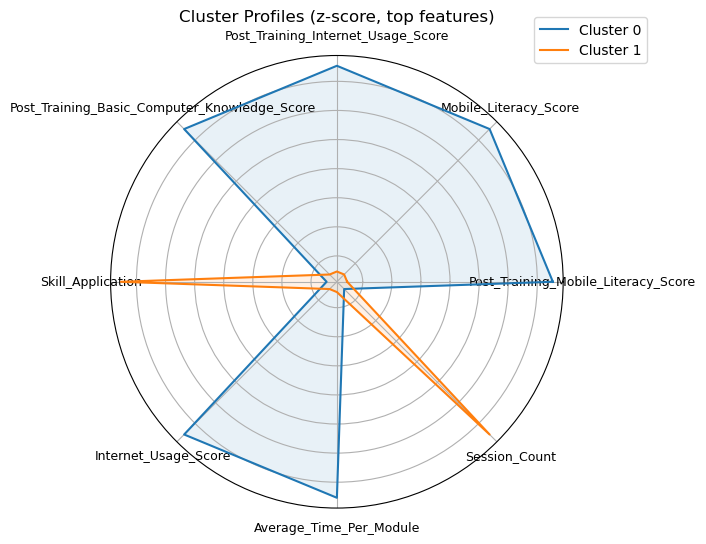

In [33]:
key_features = cluster_profiles.var().sort_values(ascending=False).head(8).index.tolist()
radar_all_clusters(cluster_profiles, key_features,fig=(7,7))

## BIRCH

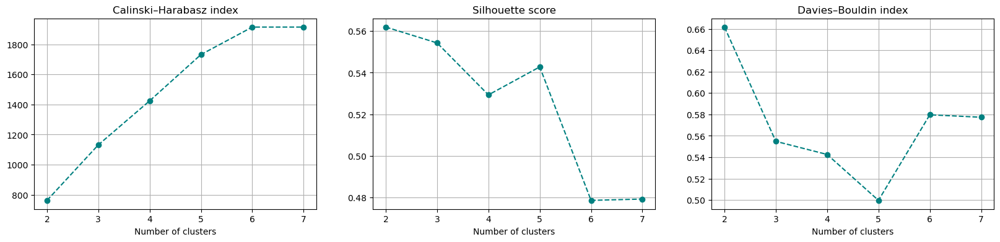

In [34]:
from sklearn.decomposition import PCA
from sklearn.cluster import Birch
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score

cols = ['Cluster']
data = df_scaled.drop(['Cluster'], axis=1) if all(col in df_scaled.columns for col in cols) else df_scaled.copy()

pca = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result = pca.fit_transform(data)

calinski = []
siluette = []
davies = []

num_cluster=np.arange(2,8)

for num in num_cluster:
    bc = Birch(threshold=0.2,n_clusters=num)
    bc_labels = bc.fit_predict(pca_result)
    calinski.append(calinski_harabasz_score(pca_result, bc_labels))
    siluette.append(silhouette_score(pca_result, bc_labels))
    davies.append(davies_bouldin_score(pca_result, bc_labels))

plt.figure(figsize=(20, 4))
plt.subplot(1, 3, 1)
plt.plot(num_cluster, calinski, 'o',linestyle='--', color='teal')
plt.title(f"Calinski–Harabasz index") #Higher = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(num_cluster, siluette, 'o',linestyle='--', color='teal')
plt.title(f"Silhouette score") #Higher = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(num_cluster, davies, 'o',linestyle='--', color='teal')
plt.title(f"Davies–Bouldin index") #Lower = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.show()

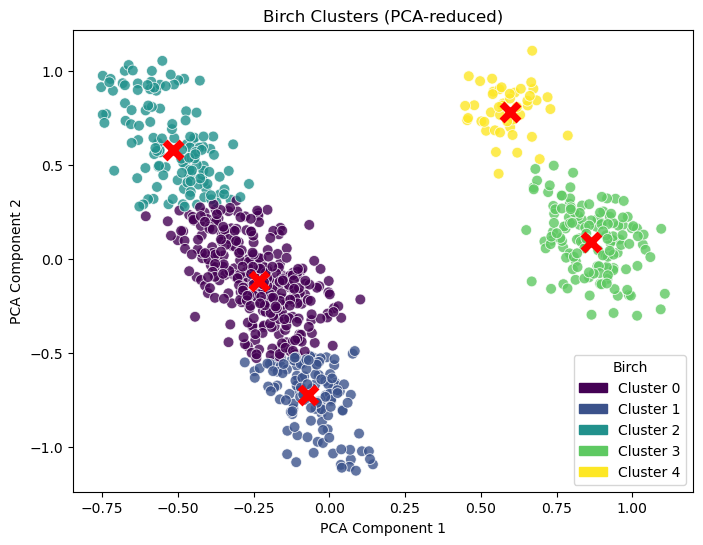

In [35]:
from sklearn.metrics import pairwise_distances_argmin_min

bc = Birch(threshold=0.2,n_clusters=5)
df_scaled['Cluster']  = bc.fit_predict(pca_result)
results.loc[len(results)]=[
    'Birch',
    silhouette_score(pca_result, df_scaled['Cluster']),
    calinski_harabasz_score(pca_result, df_scaled['Cluster']),
    davies_bouldin_score(pca_result, df_scaled['Cluster'])]

unique_clusters = np.unique(df_scaled['Cluster'])
colors = [scatter.cmap(scatter.norm(c)) for c in unique_clusters]

cluster_handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {cluster}")
    for i, cluster in enumerate(unique_clusters)
]
plt.figure(figsize=(8,6))

seaborn.scatterplot(
        x=pca_result[:,0], y=pca_result[:, 1],
        hue=df_scaled['Cluster'] ,
        palette=colors,
        legend='full',
        alpha=0.8,
        s=60,
    )

medoids = []
for c in unique_clusters:
    cluster_points = pca_result[df_scaled['Cluster'] == c]
    # index of closest point to cluster mean
    mean = cluster_points.mean(axis=0)
    idx, _ = pairwise_distances_argmin_min([mean], cluster_points)
    medoids.append(cluster_points[idx[0]])

medoids = np.array(medoids)

plt.scatter(
    medoids[:, 0], medoids[:, 1],
    c="red", s=150, marker="x",linewidths=5, label="Medoids"
)
plt.legend(handles=cluster_handles, title="Birch", loc="lower right")
plt.title("Birch Clusters (PCA-reduced)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

In [36]:
centers_dbscan=medoids
centers_scaled = pca.inverse_transform(centers_dbscan)
centers_original = minmax_scaler.inverse_transform(centers_scaled)
cluster_profiles = pd.DataFrame(
    centers_original,
    columns=df_encoded.columns  # original features
)
cluster_profiles.round(2)

,Age,Gender,Education_Level,Household_Income,Location_Type,Basic_Computer_Knowledge_Score,Internet_Usage_Score,Mobile_Literacy_Score,Post_Training_Basic_Computer_Knowledge_Score,Post_Training_Internet_Usage_Score,...,Engagement_Level,Adaptability_Score,Feedback_Rating,Skill_Application,Employment_Impact,Employment_Status_Farmer,Employment_Status_Other,Employment_Status_Self-Employed,Employment_Status_Student,Employment_Status_Unemployed
0,41.33,0.63,0.97,0.50,0.28,25.13,25.51,27.37,60.56,61.16,...,0.88,74.81,3.07,75.09,0.32,0.25,0.26,0.24,0.22,0.02
1,40.92,0.59,0.72,0.41,-0.16,23.50,27.93,29.48,58.33,63.86,...,0.98,74.83,2.88,75.85,0.51,0.28,0.55,0.02,0.18,-0.02
2,41.88,0.70,1.27,0.58,0.81,27.16,22.74,25.44,63.41,58.18,...,0.76,74.80,3.32,74.03,0.09,0.23,-0.05,0.53,0.29,-0.01
3,40.37,0.55,0.82,0.61,0.12,23.82,24.49,20.62,57.89,58.77,...,0.97,74.67,2.60,77.17,0.28,0.02,0.07,-0.07,0.01,0.98
4,40.91,0.61,1.13,0.70,0.64,25.81,21.75,18.66,60.68,55.81,...,0.85,74.66,2.85,76.14,0.06,0.00,-0.25,0.21,0.08,0.96


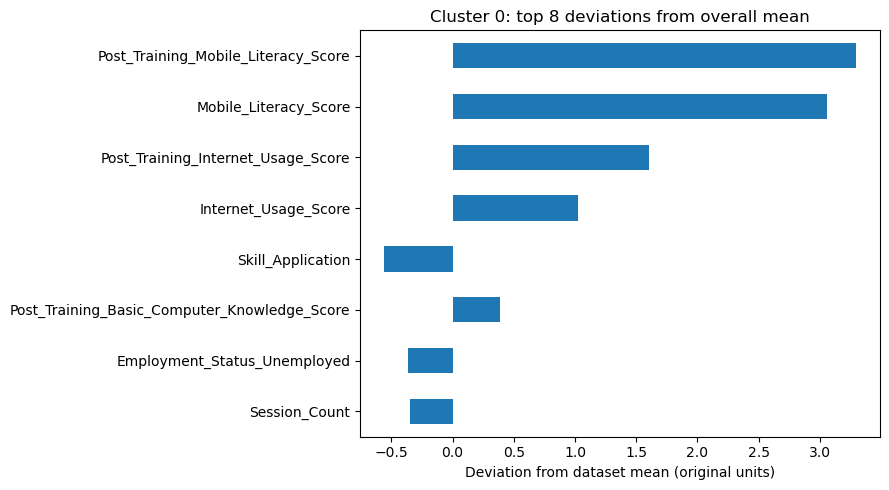

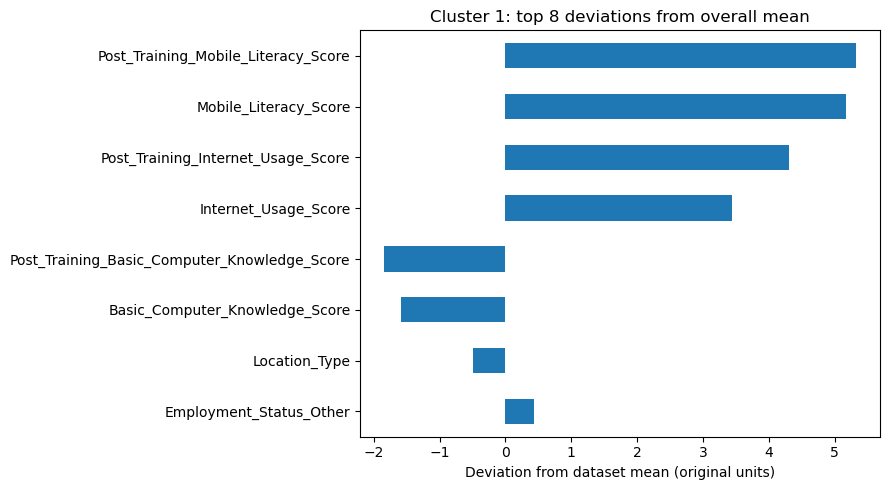

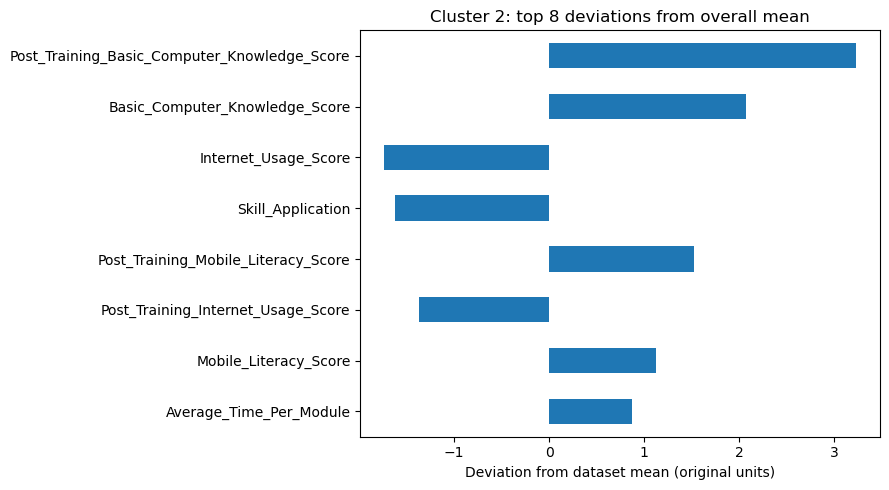

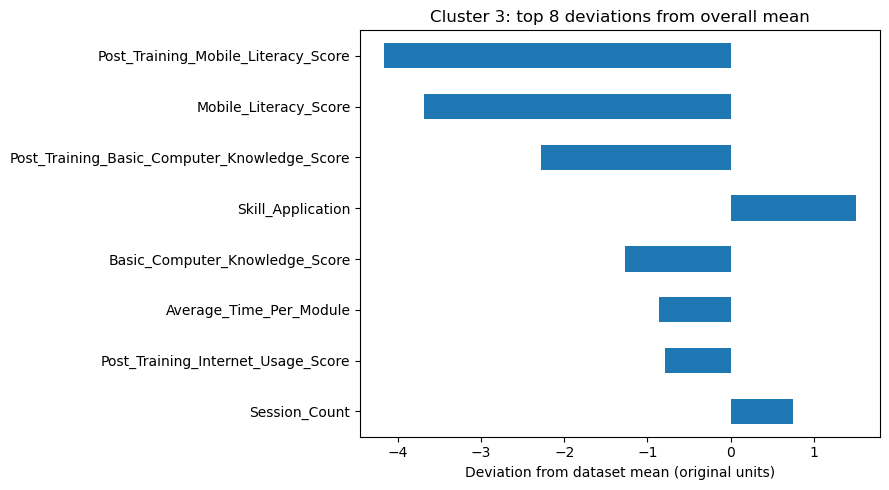

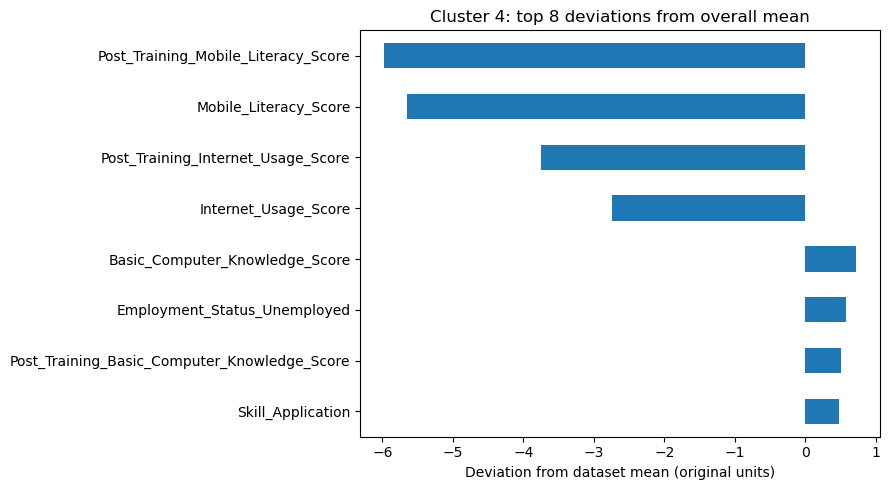

In [37]:
k = 8  # how many top features to show
overall_mean = cluster_profiles.mean(axis=0)
deviation = cluster_profiles - overall_mean   # same units as original features

for i in range(deviation.shape[0]):
    dev_sorted = deviation.iloc[i].sort_values(key=np.abs, ascending=False).head(k)
    plt.figure(figsize=(9, 5))
    dev_sorted.plot(kind='barh')
    plt.gca().invert_yaxis()
    plt.title(f'Cluster {i}: top {k} deviations from overall mean')
    plt.xlabel('Deviation from dataset mean (original units)')
    plt.tight_layout()
    plt.show()

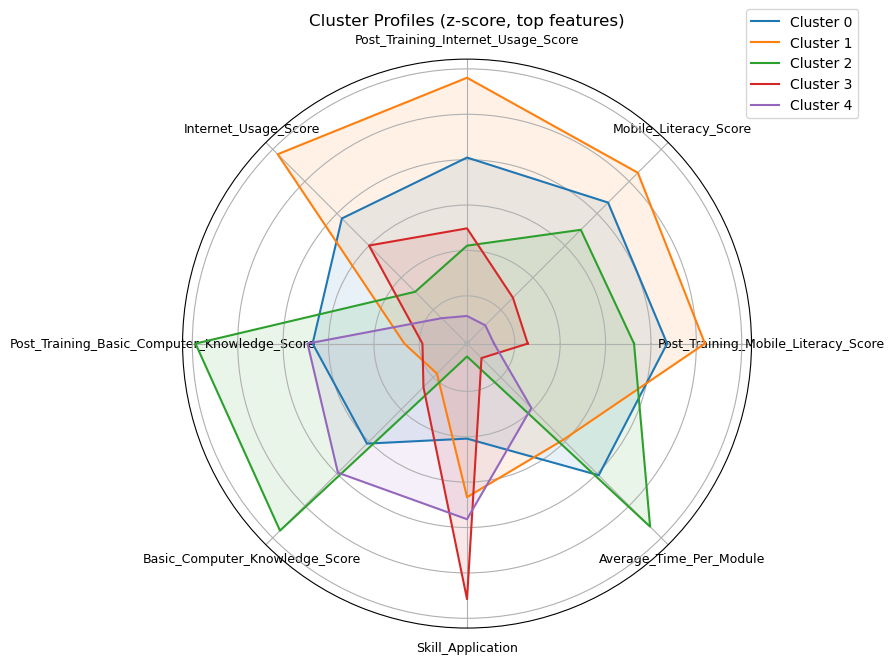

In [38]:
key_features = cluster_profiles.var().sort_values(ascending=False).head(8).index.tolist()
radar_all_clusters(cluster_profiles, key_features,fig=(9,9))

## Optics

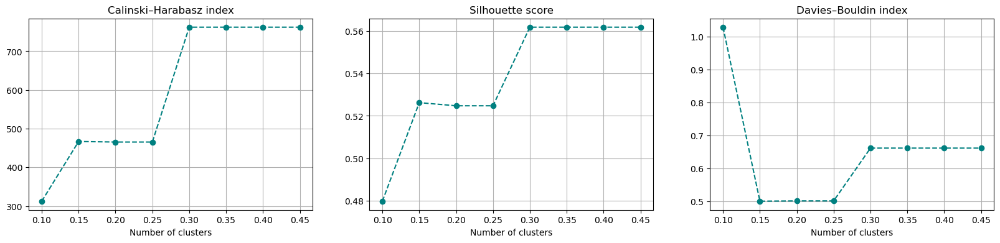

In [39]:
from sklearn.decomposition import PCA
from sklearn.cluster import OPTICS
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score

cols = ['Cluster']
data = df_scaled.drop(['Cluster'], axis=1) if all(col in df_scaled.columns for col in cols) else df_scaled.copy()

pca = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result = pca.fit_transform(data)

calinski = []
siluette = []
davies = []

xis=np.arange(0.1,0.5,0.05)

for xi in xis:
    optics = OPTICS(min_samples=20,cluster_method='xi',xi=xi)
    optics_labels = optics.fit_predict(pca_result)
    calinski.append(calinski_harabasz_score(pca_result, optics_labels))
    siluette.append(silhouette_score(pca_result, optics_labels))
    davies.append(davies_bouldin_score(pca_result, optics_labels))

plt.figure(figsize=(20, 4))
plt.subplot(1, 3, 1)
plt.plot(xis, calinski, 'o',linestyle='--', color='teal')
plt.title(f"Calinski–Harabasz index") #Higher = better
plt.xticks(xis)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(xis, siluette, 'o',linestyle='--', color='teal')
plt.title(f"Silhouette score") #Higher = better
plt.xticks(xis)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(xis, davies, 'o',linestyle='--', color='teal')
plt.title(f"Davies–Bouldin index") #Lower = better
plt.xticks(xis)
plt.xlabel("Number of clusters")
plt.grid()

plt.show()

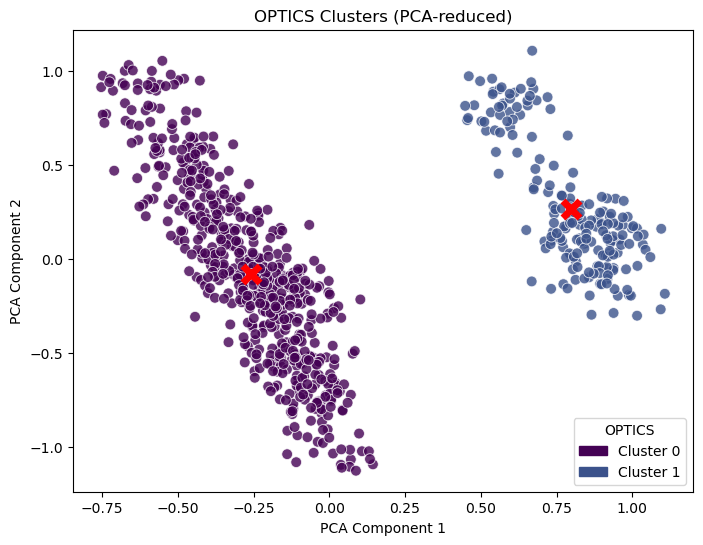

In [40]:
from sklearn.metrics import pairwise_distances_argmin_min
from sklearn.cluster import OPTICS

optics = OPTICS(min_samples=20,cluster_method='xi',xi=0.3,leaf_size=40)
df_scaled['Cluster']  = optics.fit_predict(pca_result)

results.loc[len(results)]=[
    'OPTICS',
    silhouette_score(pca_result, df_scaled['Cluster']),
    calinski_harabasz_score(pca_result, df_scaled['Cluster']),
    davies_bouldin_score(pca_result, df_scaled['Cluster'])]

unique_clusters = np.unique(df_scaled['Cluster'])
colors = [scatter.cmap(scatter.norm(c)) for c in unique_clusters]

cluster_handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {cluster}")
    for i, cluster in enumerate(unique_clusters)
]
plt.figure(figsize=(8,6))

seaborn.scatterplot(
        x=pca_result[:,0], y=pca_result[:, 1],
        hue=df_scaled['Cluster'] ,
        palette=colors,
        legend='full',
        alpha=0.8,
        s=60,
    )

medoids = []
for c in unique_clusters:
    cluster_points = pca_result[df_scaled['Cluster'] == c]
    # index of closest point to cluster mean
    mean = cluster_points.mean(axis=0)
    idx, _ = pairwise_distances_argmin_min([mean], cluster_points)
    medoids.append(cluster_points[idx[0]])

medoids = np.array(medoids)

plt.scatter(
    medoids[:, 0], medoids[:, 1],
    c="red", s=150, marker="x",linewidths=5, label="Medoids"
)
plt.legend(handles=cluster_handles, title="OPTICS", loc="lower right")
plt.title("OPTICS Clusters (PCA-reduced)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

In [41]:
centers_dbscan=medoids
centers_scaled = pca.inverse_transform(centers_dbscan)
centers_original = minmax_scaler.inverse_transform(centers_scaled)
cluster_profiles = pd.DataFrame(
    centers_original,
    columns=df_encoded.columns  # original features
)
cluster_profiles.round(2)

,Age,Gender,Education_Level,Household_Income,Location_Type,Basic_Computer_Knowledge_Score,Internet_Usage_Score,Mobile_Literacy_Score,Post_Training_Basic_Computer_Knowledge_Score,Post_Training_Internet_Usage_Score,...,Engagement_Level,Adaptability_Score,Feedback_Rating,Skill_Application,Employment_Impact,Employment_Status_Farmer,Employment_Status_Other,Employment_Status_Self-Employed,Employment_Status_Student,Employment_Status_Unemployed
0,41.37,0.64,0.98,0.50,0.31,25.26,25.36,27.31,60.75,61.01,...,0.87,74.81,3.09,75.02,0.31,0.25,0.25,0.26,0.23,0.01
1,40.50,0.56,0.90,0.63,0.25,24.32,23.80,20.13,58.59,58.03,...,0.94,74.67,2.66,76.91,0.23,0.01,-0.01,-0.00,0.03,0.97


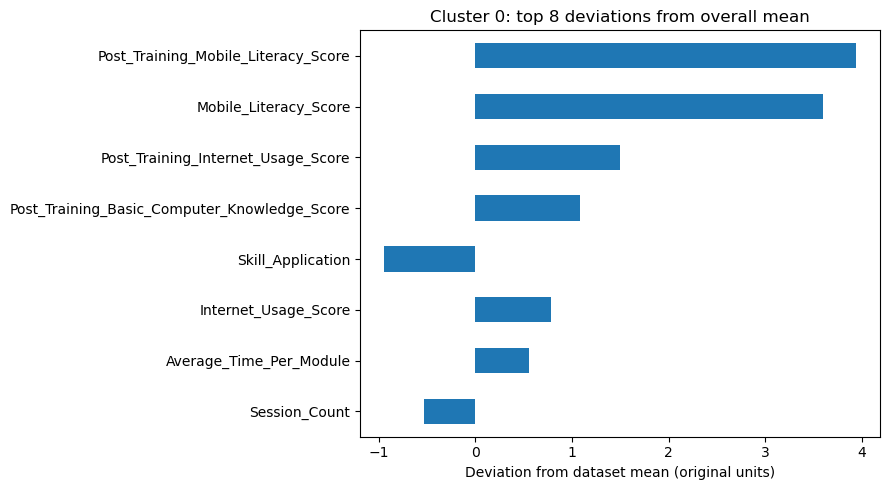

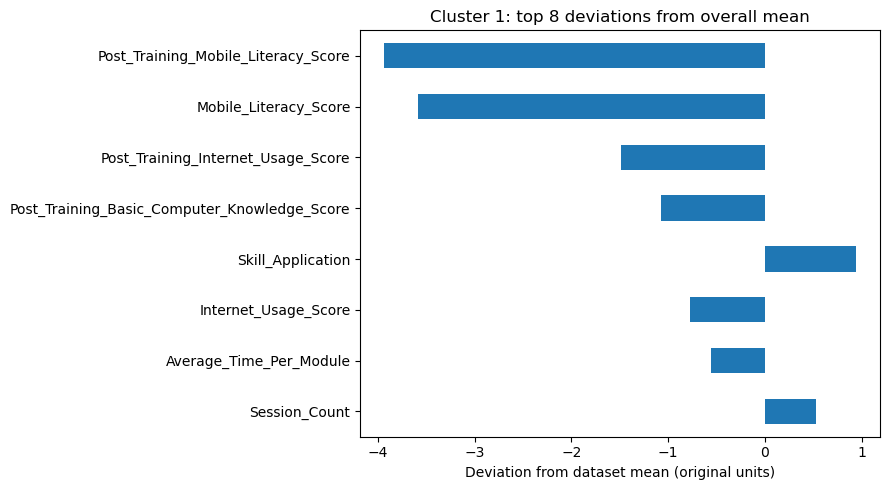

In [42]:
k = 8  # how many top features to show
overall_mean = cluster_profiles.mean(axis=0)
deviation = cluster_profiles - overall_mean   # same units as original features

for i in range(deviation.shape[0]):
    dev_sorted = deviation.iloc[i].sort_values(key=np.abs, ascending=False).head(k)
    plt.figure(figsize=(9, 5))
    dev_sorted.plot(kind='barh')
    plt.gca().invert_yaxis()
    plt.title(f'Cluster {i}: top {k} deviations from overall mean')
    plt.xlabel('Deviation from dataset mean (original units)')
    plt.tight_layout()
    plt.show()

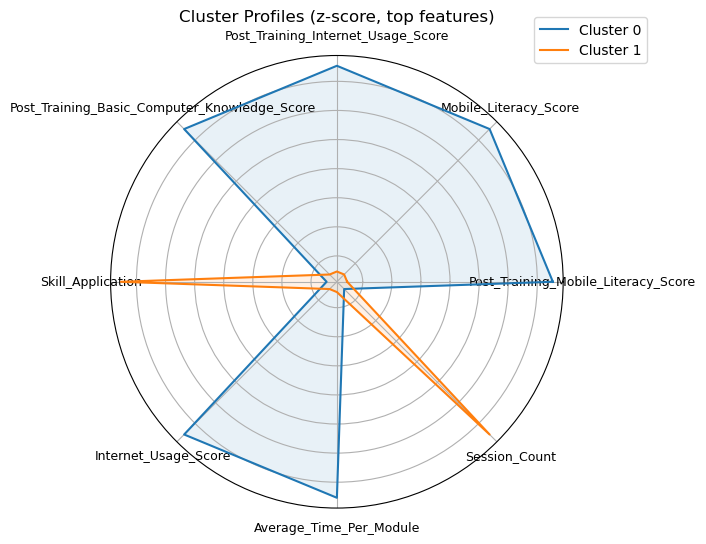

In [43]:
key_features = cluster_profiles.var().sort_values(ascending=False).head(8).index.tolist()
radar_all_clusters(cluster_profiles, key_features,fig=(7,7))

## Gaussian Mixture

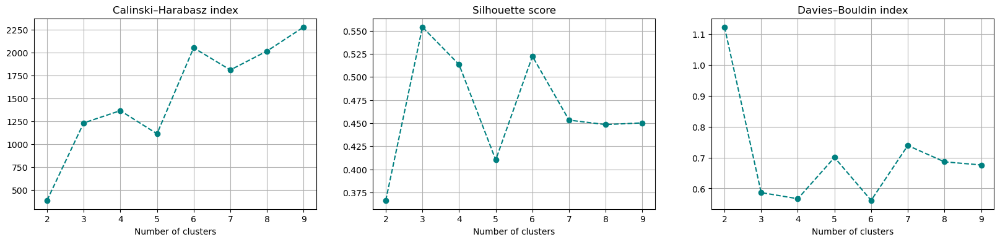

In [44]:
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score

cols = ['Cluster']
data = df_scaled.drop(['Cluster'], axis=1) if all(col in df_scaled.columns for col in cols) else df_scaled.copy()

pca = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result = pca.fit_transform(data)

calinski = []
siluette = []
davies = []

num_cluster=np.arange(2,10)

for n in num_cluster:
    gaus = GaussianMixture(n_components=n, covariance_type='tied', random_state=42)
    gaus_labels = gaus.fit_predict(pca_result)
    calinski.append(calinski_harabasz_score(pca_result, gaus_labels))
    siluette.append(silhouette_score(pca_result, gaus_labels))
    davies.append(davies_bouldin_score(pca_result, gaus_labels))

plt.figure(figsize=(20, 4))
plt.subplot(1, 3, 1)
plt.plot(num_cluster, calinski, 'o',linestyle='--', color='teal')
plt.title(f"Calinski–Harabasz index") #Higher = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(num_cluster, siluette, 'o',linestyle='--', color='teal')
plt.title(f"Silhouette score") #Higher = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(num_cluster, davies, 'o',linestyle='--', color='teal')
plt.title(f"Davies–Bouldin index") #Lower = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.show()

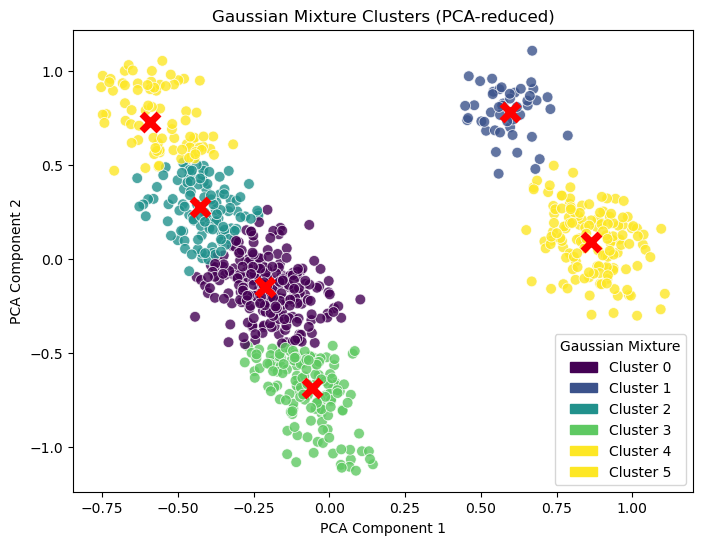

In [45]:
from sklearn.metrics import pairwise_distances_argmin_min

gaus = GaussianMixture(n_components=6, covariance_type='tied', random_state=42)
df_scaled['Cluster']  = gaus.fit_predict(pca_result)

results.loc[len(results)]=[
    'Gaussian Mixture',
    silhouette_score(pca_result, df_scaled['Cluster']),
    calinski_harabasz_score(pca_result, df_scaled['Cluster']),
    davies_bouldin_score(pca_result, df_scaled['Cluster'])]

unique_clusters = np.unique(df_scaled['Cluster'])
colors = [scatter.cmap(scatter.norm(c)) for c in unique_clusters]

cluster_handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {cluster}")
    for i, cluster in enumerate(unique_clusters)
]
plt.figure(figsize=(8,6))

seaborn.scatterplot(
        x=pca_result[:,0], y=pca_result[:, 1],
        hue=df_scaled['Cluster'] ,
        palette=colors,
        legend='full',
        alpha=0.8,
        s=60,
    )

medoids = []
for c in unique_clusters:
    cluster_points = pca_result[df_scaled['Cluster'] == c]
    # index of closest point to cluster mean
    mean = cluster_points.mean(axis=0)
    idx, _ = pairwise_distances_argmin_min([mean], cluster_points)
    medoids.append(cluster_points[idx[0]])

medoids = np.array(medoids)

plt.scatter(
    medoids[:, 0], medoids[:, 1],
    c="red", s=150, marker="x",linewidths=5, label="Medoids"
)
plt.legend(handles=cluster_handles, title="Gaussian Mixture", loc="lower right")
plt.title("Gaussian Mixture Clusters (PCA-reduced)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

In [46]:
centers_dbscan=medoids
centers_scaled = pca.inverse_transform(centers_dbscan)
centers_original = minmax_scaler.inverse_transform(centers_scaled)
cluster_profiles = pd.DataFrame(
    centers_original,
    columns=df_encoded.columns  # original features
)
cluster_profiles.round(2)

,Age,Gender,Education_Level,Household_Income,Location_Type,Basic_Computer_Knowledge_Score,Internet_Usage_Score,Mobile_Literacy_Score,Post_Training_Basic_Computer_Knowledge_Score,Post_Training_Internet_Usage_Score,...,Engagement_Level,Adaptability_Score,Feedback_Rating,Skill_Application,Employment_Impact,Employment_Status_Farmer,Employment_Status_Other,Employment_Status_Self-Employed,Employment_Status_Student,Employment_Status_Unemployed
0,41.29,0.63,0.95,0.49,0.26,25.02,25.63,27.40,60.41,61.28,...,0.89,74.81,3.05,75.16,0.33,0.25,0.28,0.23,0.22,0.03
1,40.91,0.61,1.13,0.70,0.64,25.81,21.75,18.66,60.68,55.81,...,0.85,74.66,2.85,76.14,0.06,0.00,-0.25,0.21,0.08,0.96
2,41.67,0.67,1.14,0.54,0.59,26.33,23.96,26.46,62.27,59.53,...,0.81,74.81,3.23,74.43,0.19,0.25,0.09,0.42,0.27,-0.02
3,40.93,0.59,0.73,0.42,-0.14,23.56,27.78,29.22,58.39,63.66,...,0.98,74.82,2.88,75.85,0.50,0.27,0.53,0.02,0.18,-0.00
4,42.01,0.71,1.34,0.60,0.93,27.62,22.15,25.10,64.07,57.56,...,0.73,74.80,3.39,73.77,0.05,0.23,-0.12,0.60,0.31,-0.03
5,40.37,0.55,0.82,0.61,0.12,23.82,24.49,20.62,57.89,58.77,...,0.97,74.67,2.60,77.17,0.28,0.02,0.07,-0.07,0.01,0.98


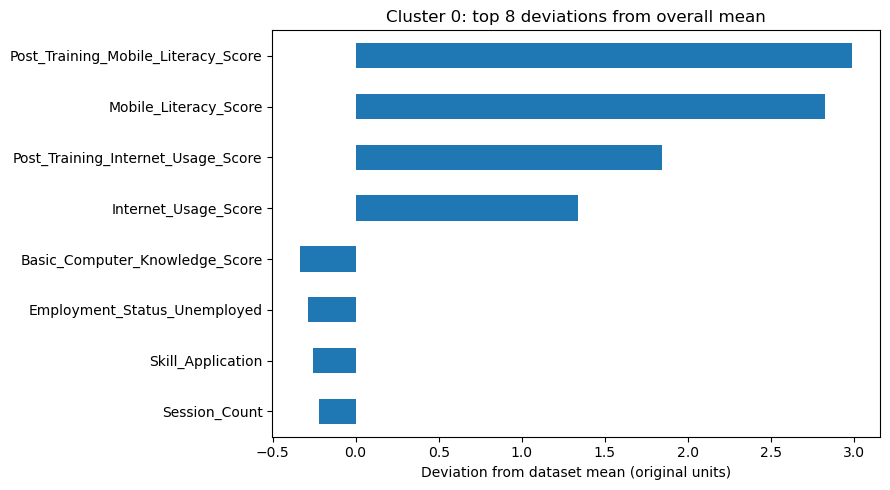

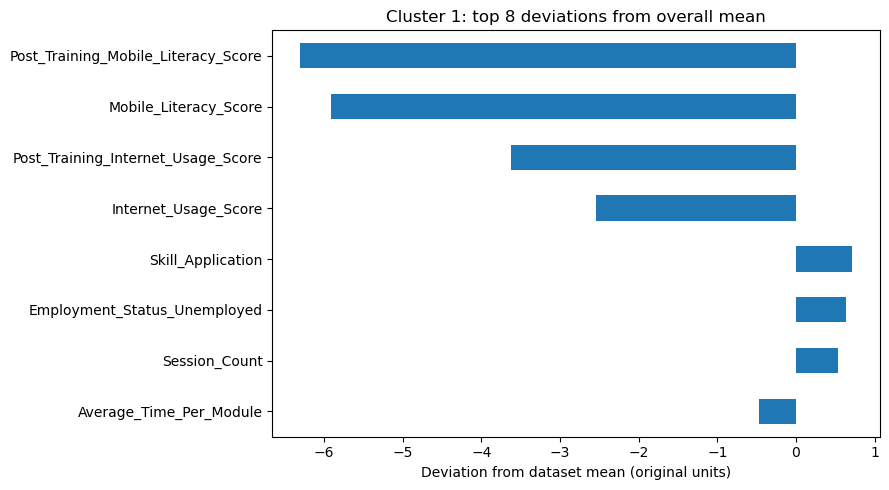

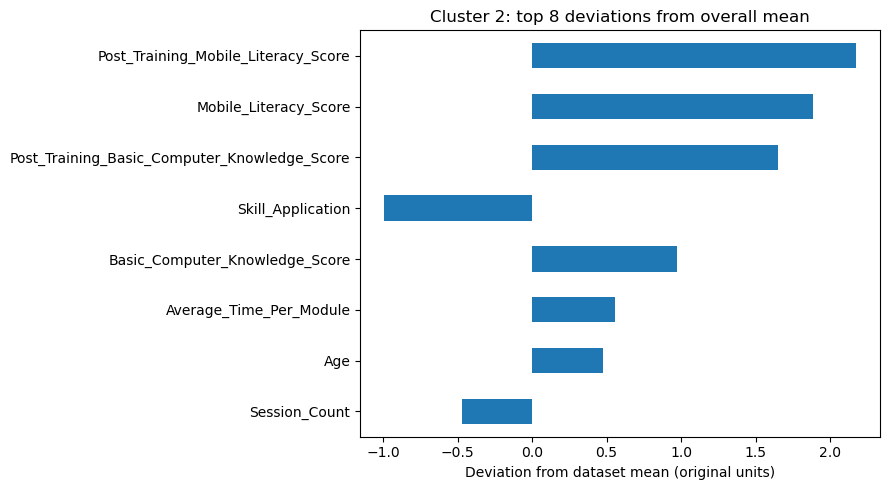

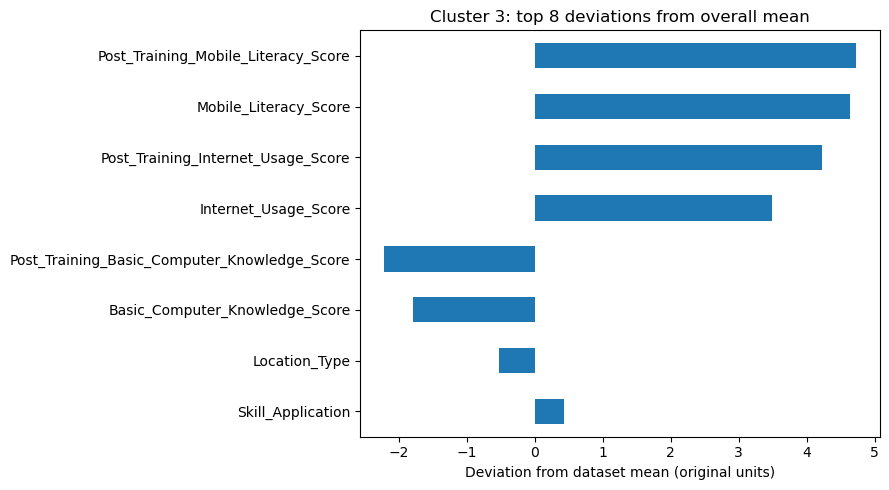

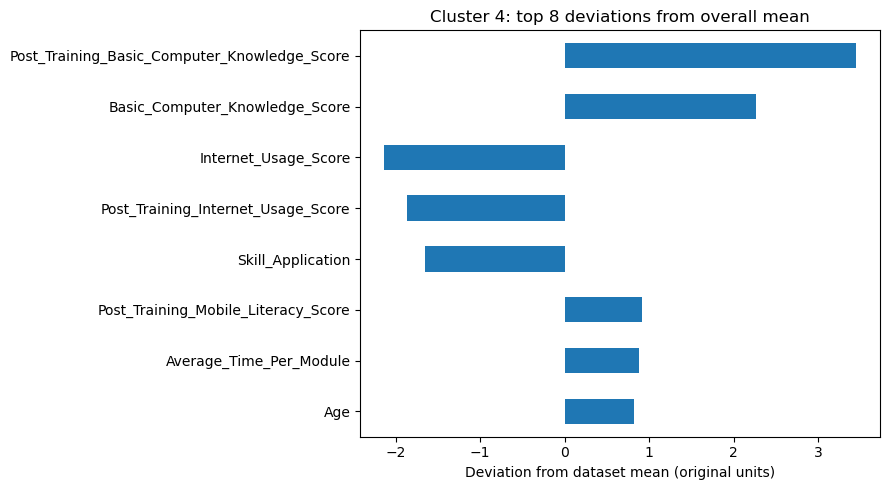

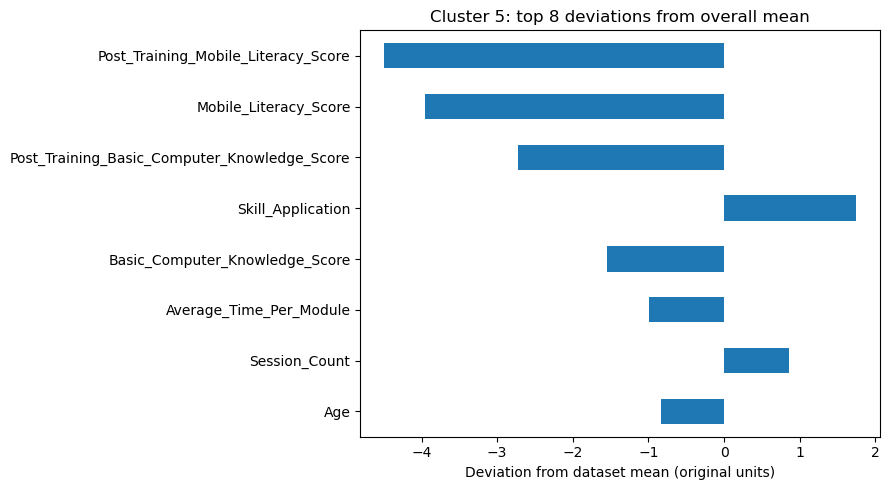

In [47]:
k = 8  # how many top features to show
overall_mean = cluster_profiles.mean(axis=0)
deviation = cluster_profiles - overall_mean   # same units as original features

for i in range(deviation.shape[0]):
    dev_sorted = deviation.iloc[i].sort_values(key=np.abs, ascending=False).head(k)
    plt.figure(figsize=(9, 5))
    dev_sorted.plot(kind='barh')
    plt.gca().invert_yaxis()
    plt.title(f'Cluster {i}: top {k} deviations from overall mean')
    plt.xlabel('Deviation from dataset mean (original units)')
    plt.tight_layout()
    plt.show()

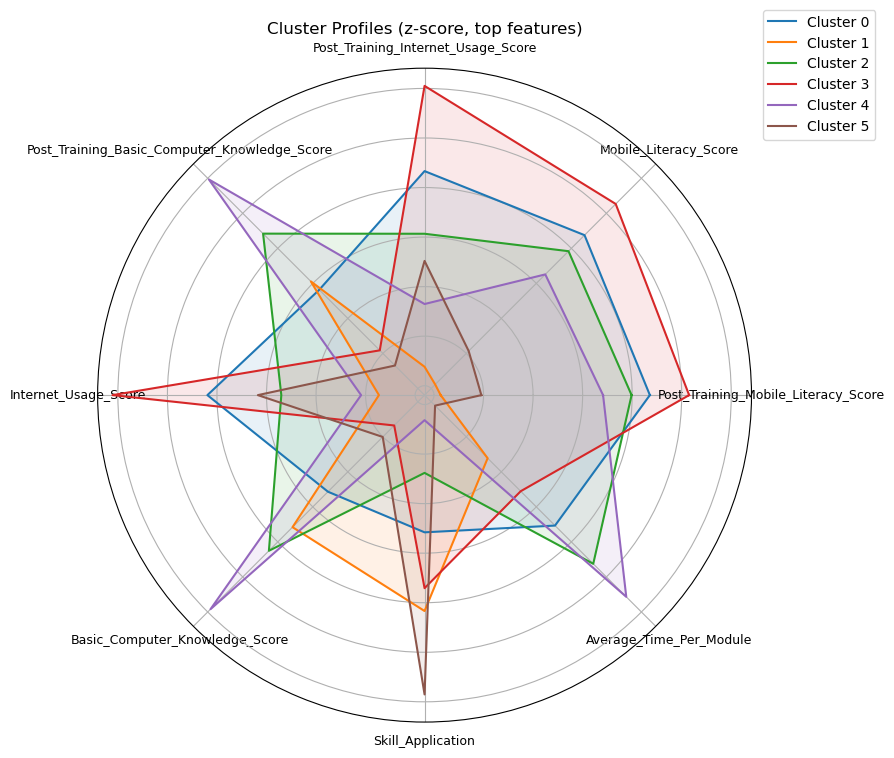

In [48]:
key_features = cluster_profiles.var().sort_values(ascending=False).head(8).index.tolist()
radar_all_clusters(cluster_profiles, key_features,fig=(9,9))

## Spectral

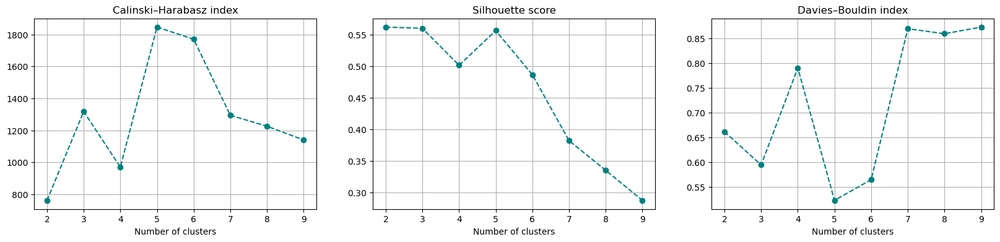

In [49]:
from sklearn.decomposition import PCA
from sklearn.cluster import SpectralClustering
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score

cols = ['Cluster']
data = df_scaled.drop(['Cluster'], axis=1) if all(col in df_scaled.columns for col in cols) else df_scaled.copy()

pca = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result = pca.fit_transform(data)

calinski = []
siluette = []
davies = []

num_cluster=np.arange(2,10)

for n in num_cluster:
    spec = SpectralClustering(n_components=n, affinity='rbf',assign_labels='discretize',gamma=1.0,random_state=42)
    spec_labels = spec.fit_predict(pca_result)
    calinski.append(calinski_harabasz_score(pca_result, spec_labels))
    siluette.append(silhouette_score(pca_result, spec_labels))
    davies.append(davies_bouldin_score(pca_result, spec_labels))

plt.figure(figsize=(20, 4))
plt.subplot(1, 3, 1)
plt.plot(num_cluster, calinski, 'o',linestyle='--', color='teal')
plt.title(f"Calinski–Harabasz index") #Higher = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(num_cluster, siluette, 'o',linestyle='--', color='teal')
plt.title(f"Silhouette score") #Higher = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(num_cluster, davies, 'o',linestyle='--', color='teal')
plt.title(f"Davies–Bouldin index") #Lower = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.show()

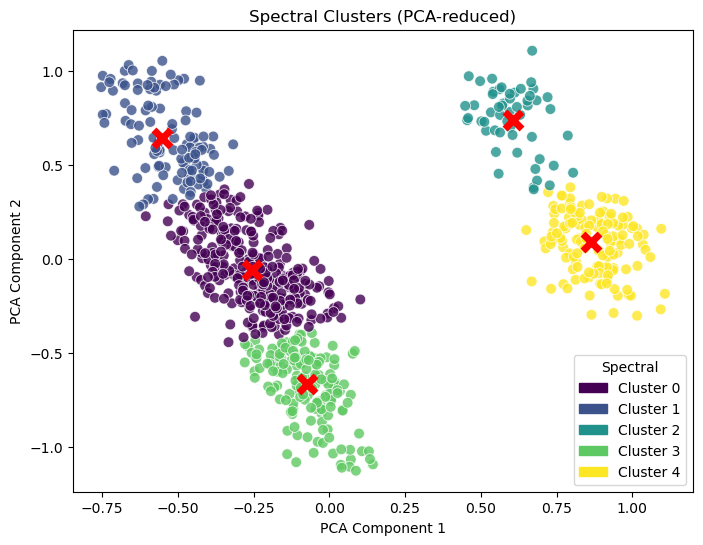

In [50]:
from sklearn.metrics import pairwise_distances_argmin_min

spec = SpectralClustering(n_components=5, affinity='rbf',assign_labels='discretize',gamma=1.0,random_state=42)
df_scaled['Cluster']  = spec.fit_predict(pca_result)
results.loc[len(results)]=[
    'Spectral',
    silhouette_score(pca_result, df_scaled['Cluster']),
    calinski_harabasz_score(pca_result, df_scaled['Cluster']),
    davies_bouldin_score(pca_result, df_scaled['Cluster'])]

unique_clusters = np.unique(df_scaled['Cluster'])
colors = [scatter.cmap(scatter.norm(c)) for c in unique_clusters]

cluster_handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {cluster}")
    for i, cluster in enumerate(unique_clusters)
]
plt.figure(figsize=(8,6))

seaborn.scatterplot(
        x=pca_result[:,0], y=pca_result[:, 1],
        hue=df_scaled['Cluster'] ,
        palette=colors,
        legend='full',
        alpha=0.8,
        s=60,
    )

medoids = []
for c in unique_clusters:
    cluster_points = pca_result[df_scaled['Cluster'] == c]
    # index of closest point to cluster mean
    mean = cluster_points.mean(axis=0)
    idx, _ = pairwise_distances_argmin_min([mean], cluster_points)
    medoids.append(cluster_points[idx[0]])

medoids = np.array(medoids)

plt.scatter(
    medoids[:, 0], medoids[:, 1],
    c="red", s=150, marker="x",linewidths=5, label="Medoids"
)
plt.legend(handles=cluster_handles, title="Spectral", loc="lower right")
plt.title("Spectral Clusters (PCA-reduced)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

In [51]:
centers_dbscan=medoids
centers_scaled = pca.inverse_transform(centers_dbscan)
centers_original = minmax_scaler.inverse_transform(centers_scaled)
cluster_profiles = pd.DataFrame(
    centers_original,
    columns=df_encoded.columns  # original features
)
cluster_profiles.round(2)

,Age,Gender,Education_Level,Household_Income,Location_Type,Basic_Computer_Knowledge_Score,Internet_Usage_Score,Mobile_Literacy_Score,Post_Training_Basic_Computer_Knowledge_Score,Post_Training_Internet_Usage_Score,...,Engagement_Level,Adaptability_Score,Feedback_Rating,Skill_Application,Employment_Impact,Employment_Status_Farmer,Employment_Status_Other,Employment_Status_Self-Employed,Employment_Status_Student,Employment_Status_Unemployed
0,41.37,0.64,0.99,0.50,0.32,25.30,25.27,27.19,60.79,60.91,...,0.87,74.81,3.09,75.01,0.30,0.25,0.24,0.27,0.23,0.02
1,41.94,0.70,1.30,0.59,0.86,27.36,22.50,25.33,63.70,57.94,...,0.75,74.80,3.35,73.91,0.07,0.23,-0.08,0.56,0.30,-0.02
2,40.88,0.61,1.11,0.69,0.61,25.70,21.91,18.80,60.54,55.99,...,0.85,74.67,2.84,76.19,0.08,0.00,-0.23,0.20,0.07,0.96
3,40.95,0.59,0.74,0.42,-0.12,23.64,27.69,29.20,58.50,63.58,...,0.97,74.82,2.89,75.81,0.49,0.27,0.52,0.03,0.18,-0.01
4,40.37,0.55,0.82,0.61,0.12,23.82,24.49,20.62,57.89,58.77,...,0.97,74.67,2.60,77.17,0.28,0.02,0.07,-0.07,0.01,0.98


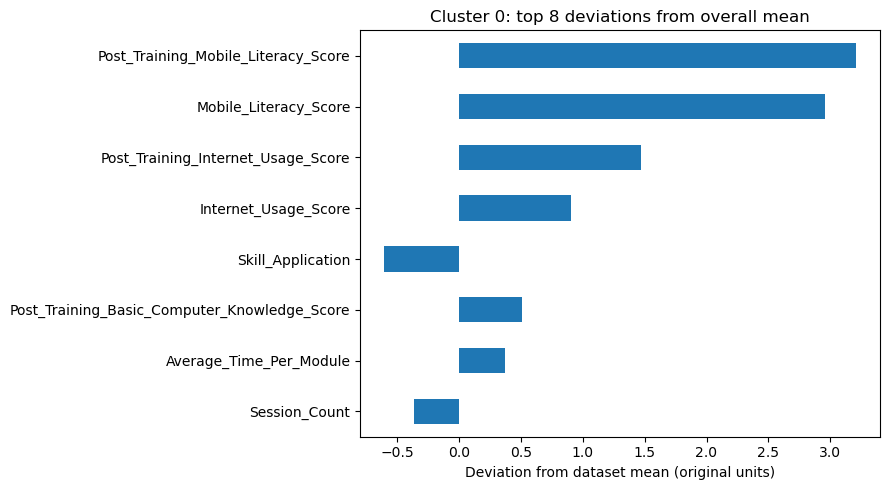

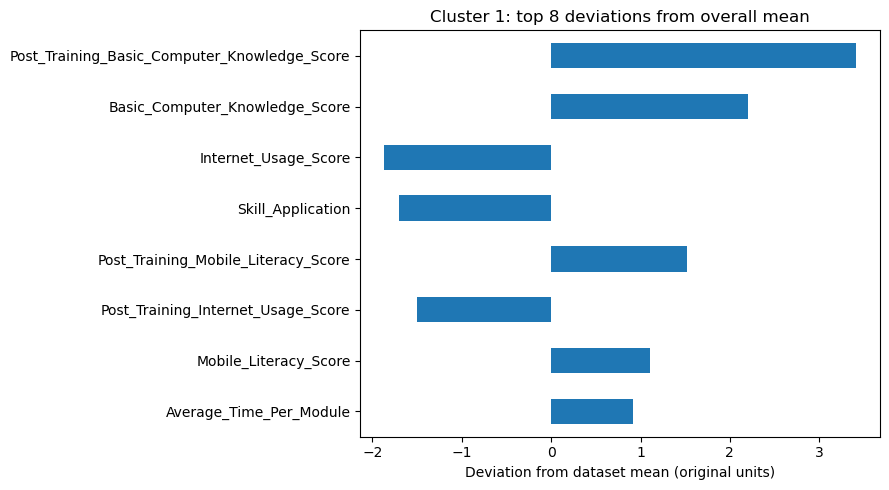

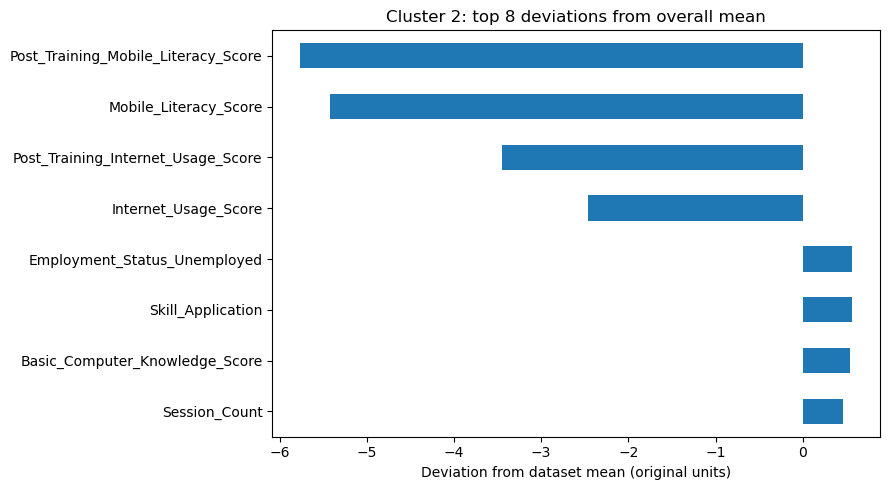

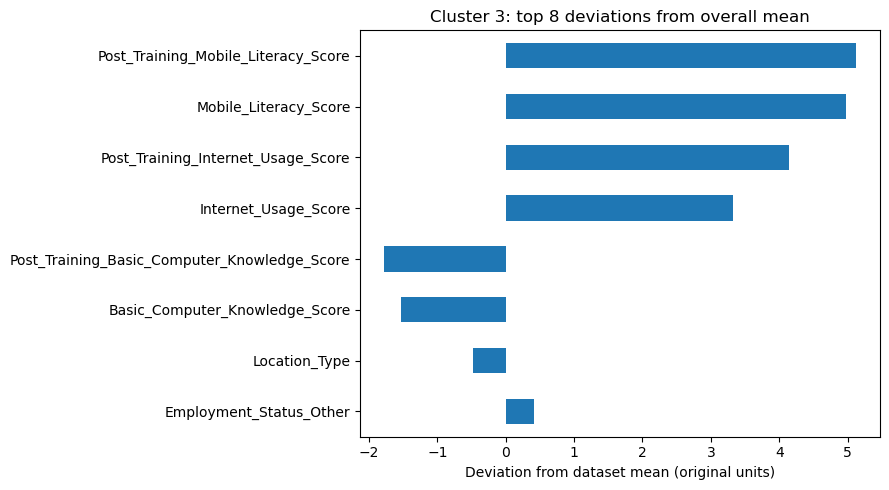

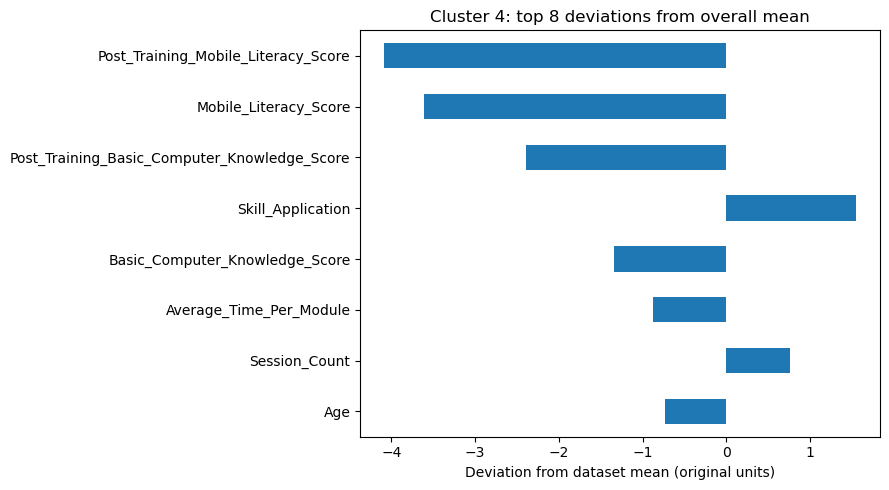

In [52]:
k = 8  # how many top features to show
overall_mean = cluster_profiles.mean(axis=0)
deviation = cluster_profiles - overall_mean   # same units as original features

for i in range(deviation.shape[0]):
    dev_sorted = deviation.iloc[i].sort_values(key=np.abs, ascending=False).head(k)
    plt.figure(figsize=(9, 5))
    dev_sorted.plot(kind='barh')
    plt.gca().invert_yaxis()
    plt.title(f'Cluster {i}: top {k} deviations from overall mean')
    plt.xlabel('Deviation from dataset mean (original units)')
    plt.tight_layout()
    plt.show()

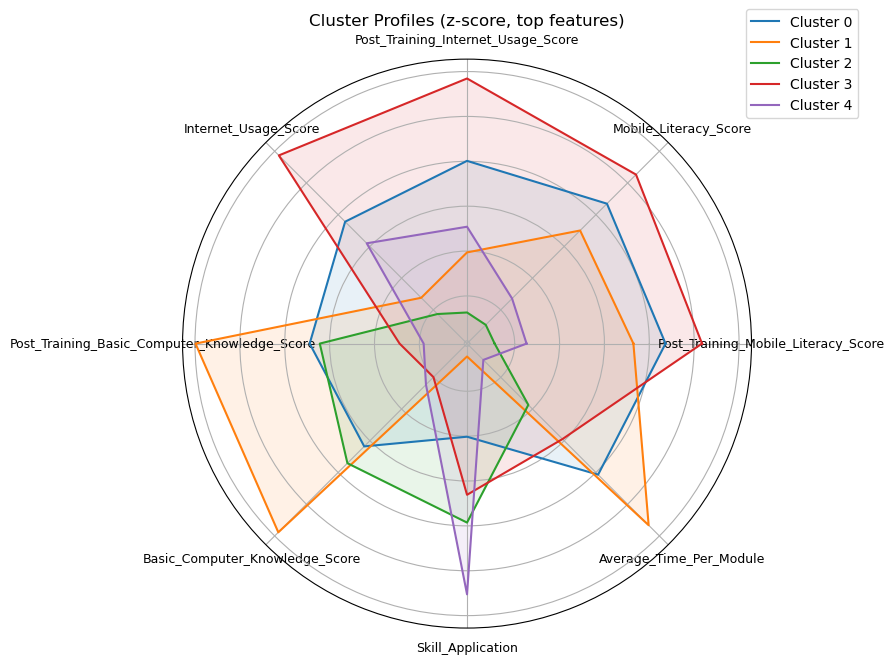

In [53]:
key_features = cluster_profiles.var().sort_values(ascending=False).head(8).index.tolist()
radar_all_clusters(cluster_profiles, key_features,fig=(9,9))

## Bisecting K-Means

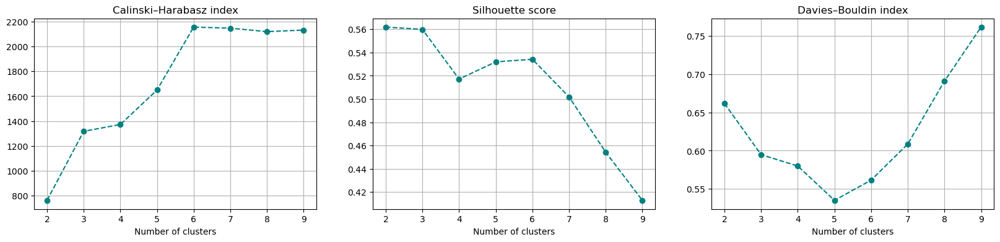

In [54]:
from sklearn.decomposition import PCA
from sklearn.cluster import BisectingKMeans
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score

cols = ['Cluster']
data = df_scaled.drop(['Cluster'], axis=1) if all(col in df_scaled.columns for col in cols) else df_scaled.copy()

pca = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result = pca.fit_transform(data)

calinski = []
siluette = []
davies = []

num_cluster=np.arange(2,10)

for n in num_cluster:
    bkmeans = BisectingKMeans(n_clusters=n,n_init=20,max_iter=300,bisecting_strategy="biggest_inertia",random_state=42)
    bkmeans_labels = bkmeans.fit_predict(pca_result)
    calinski.append(calinski_harabasz_score(pca_result, bkmeans_labels))
    siluette.append(silhouette_score(pca_result, bkmeans_labels))
    davies.append(davies_bouldin_score(pca_result, bkmeans_labels))

plt.figure(figsize=(20, 4))
plt.subplot(1, 3, 1)
plt.plot(num_cluster, calinski, 'o',linestyle='--', color='teal')
plt.title(f"Calinski–Harabasz index") #Higher = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(num_cluster, siluette, 'o',linestyle='--', color='teal')
plt.title(f"Silhouette score") #Higher = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(num_cluster, davies, 'o',linestyle='--', color='teal')
plt.title(f"Davies–Bouldin index") #Lower = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.show()

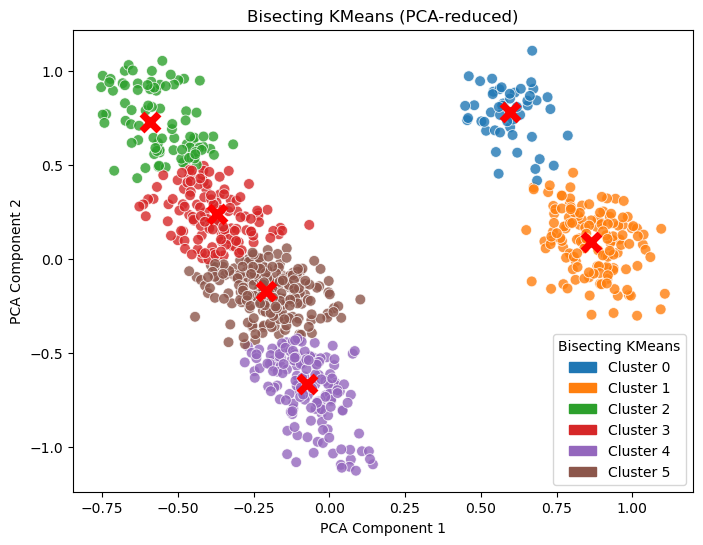

In [55]:
from sklearn.metrics import pairwise_distances_argmin_min
import matplotlib


bkmeans = BisectingKMeans(n_clusters=6,n_init=10,max_iter=300,bisecting_strategy="biggest_inertia",random_state=42)
df_scaled['Cluster']  = bkmeans.fit_predict(pca_result)
results.loc[len(results)]=[
    'Bisecting KMeans',
    silhouette_score(pca_result, df_scaled['Cluster']),
    calinski_harabasz_score(pca_result, df_scaled['Cluster']),
    davies_bouldin_score(pca_result, df_scaled['Cluster'])]

unique_clusters = np.unique(df_scaled['Cluster'])
cmap=matplotlib.colormaps.get_cmap('tab10') # 10 distinct colors

colors = [cmap(i) for i in range(len(unique_clusters))]

cluster_handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {cluster}")
    for i, cluster in enumerate(unique_clusters)
]
plt.figure(figsize=(8,6))

seaborn.scatterplot(
        x=pca_result[:,0], y=pca_result[:, 1],
        hue=df_scaled['Cluster'] ,
        palette=colors,
        legend='full',
        alpha=0.8,
        s=60,
    )

medoids = []
for c in unique_clusters:
    cluster_points = pca_result[df_scaled['Cluster'] == c]
    # index of closest point to cluster mean
    mean = cluster_points.mean(axis=0)
    idx, _ = pairwise_distances_argmin_min([mean], cluster_points)
    medoids.append(cluster_points[idx[0]])

medoids = np.array(medoids)

plt.scatter(
    medoids[:, 0], medoids[:, 1],
    c="red", s=150, marker="x",linewidths=5, label="Medoids"
)
plt.legend(handles=cluster_handles, title="Bisecting KMeans", loc="lower right")
plt.title("Bisecting KMeans (PCA-reduced)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

In [56]:
centers_dbscan=medoids
centers_scaled = pca.inverse_transform(centers_dbscan)
centers_original = minmax_scaler.inverse_transform(centers_scaled)
cluster_profiles = pd.DataFrame(
    centers_original,
    columns=df_encoded.columns  # original features
)
cluster_profiles.round(2)

,Age,Gender,Education_Level,Household_Income,Location_Type,Basic_Computer_Knowledge_Score,Internet_Usage_Score,Mobile_Literacy_Score,Post_Training_Basic_Computer_Knowledge_Score,Post_Training_Internet_Usage_Score,...,Engagement_Level,Adaptability_Score,Feedback_Rating,Skill_Application,Employment_Impact,Employment_Status_Farmer,Employment_Status_Other,Employment_Status_Self-Employed,Employment_Status_Student,Employment_Status_Unemployed
0,40.91,0.61,1.13,0.70,0.64,25.81,21.75,18.66,60.68,55.81,...,0.85,74.66,2.85,76.14,0.06,0.00,-0.25,0.21,0.08,0.96
1,40.37,0.55,0.82,0.61,0.12,23.82,24.49,20.62,57.89,58.77,...,0.97,74.67,2.60,77.17,0.28,0.02,0.07,-0.07,0.01,0.98
2,42.01,0.71,1.34,0.60,0.93,27.62,22.15,25.10,64.07,57.56,...,0.73,74.80,3.39,73.77,0.05,0.23,-0.12,0.60,0.31,-0.03
3,41.60,0.67,1.12,0.54,0.55,26.16,24.10,26.35,62.00,59.63,...,0.82,74.81,3.20,74.56,0.20,0.24,0.10,0.39,0.26,0.01
4,40.95,0.59,0.74,0.42,-0.12,23.64,27.69,29.20,58.50,63.58,...,0.97,74.82,2.89,75.81,0.49,0.27,0.52,0.03,0.18,-0.01
5,41.28,0.63,0.94,0.49,0.24,24.97,25.72,27.50,60.34,61.39,...,0.89,74.81,3.05,75.18,0.34,0.25,0.29,0.22,0.22,0.02


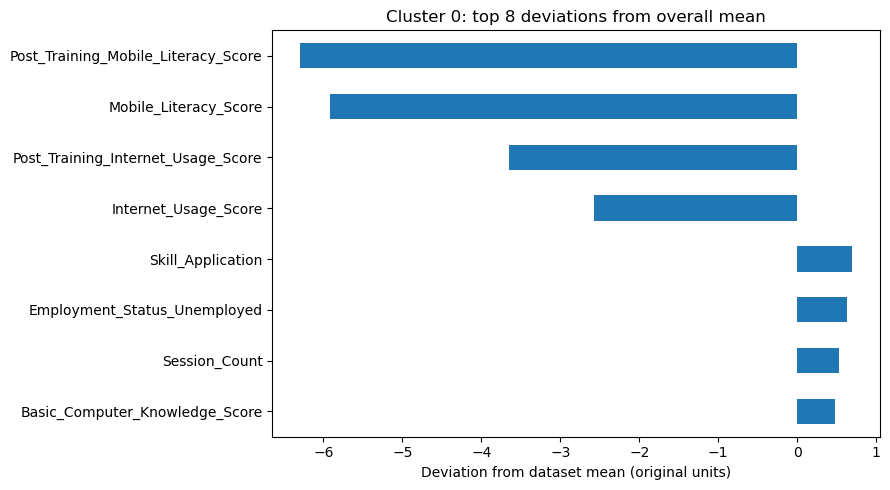

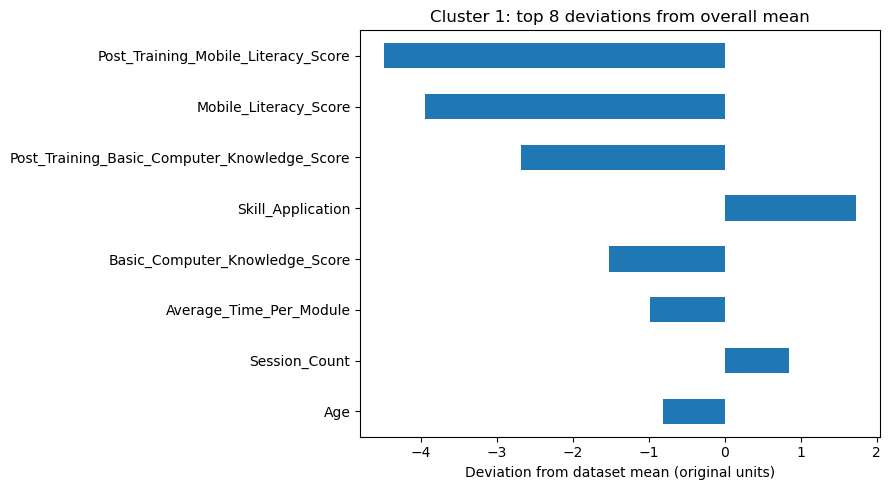

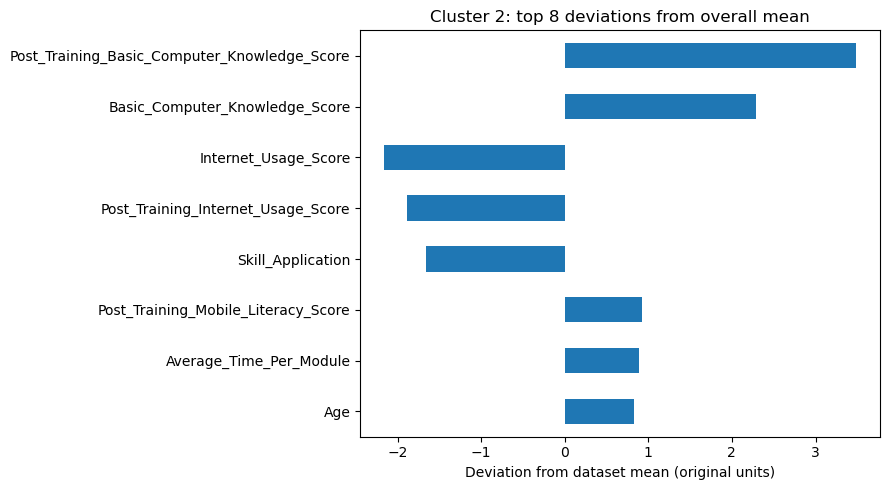

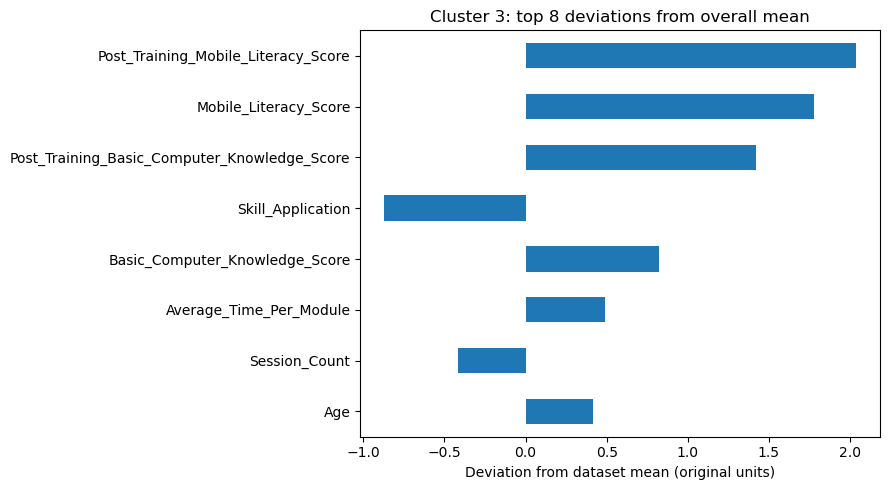

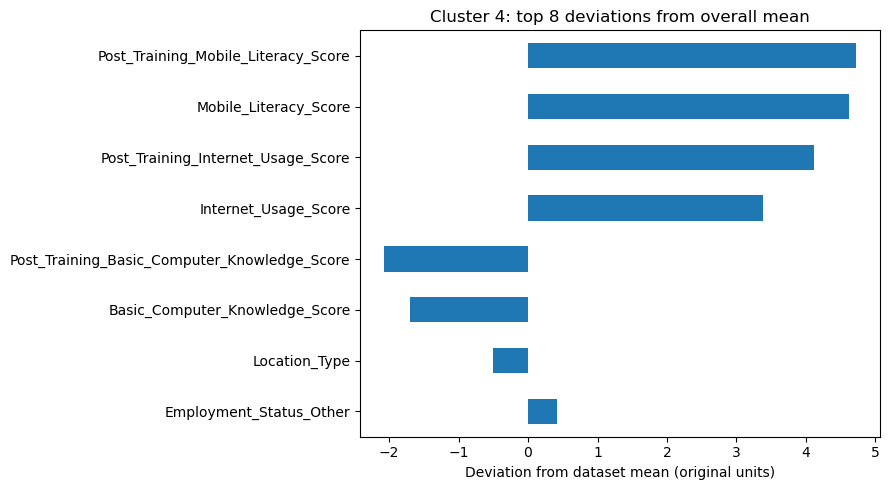

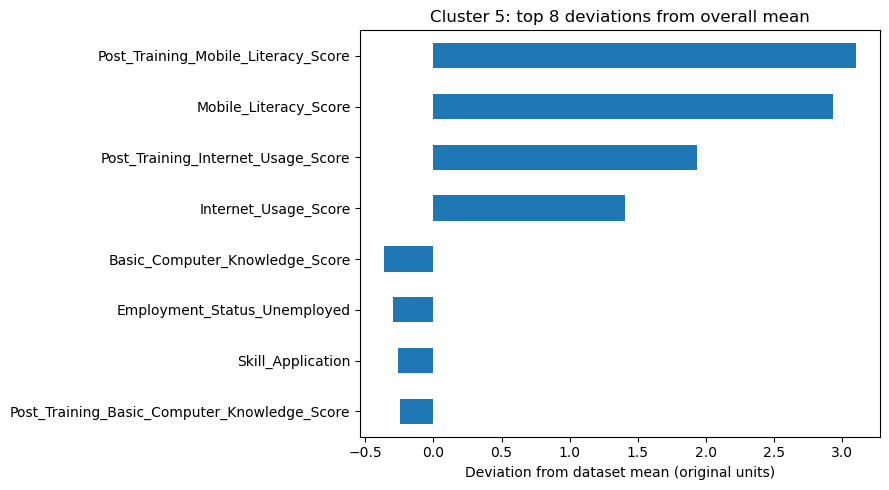

In [57]:
k = 8  # how many top features to show
overall_mean = cluster_profiles.mean(axis=0)
deviation = cluster_profiles - overall_mean   # same units as original features

for i in range(deviation.shape[0]):
    dev_sorted = deviation.iloc[i].sort_values(key=np.abs, ascending=False).head(k)
    plt.figure(figsize=(9, 5))
    dev_sorted.plot(kind='barh')
    plt.gca().invert_yaxis()
    plt.title(f'Cluster {i}: top {k} deviations from overall mean')
    plt.xlabel('Deviation from dataset mean (original units)')
    plt.tight_layout()
    plt.show()

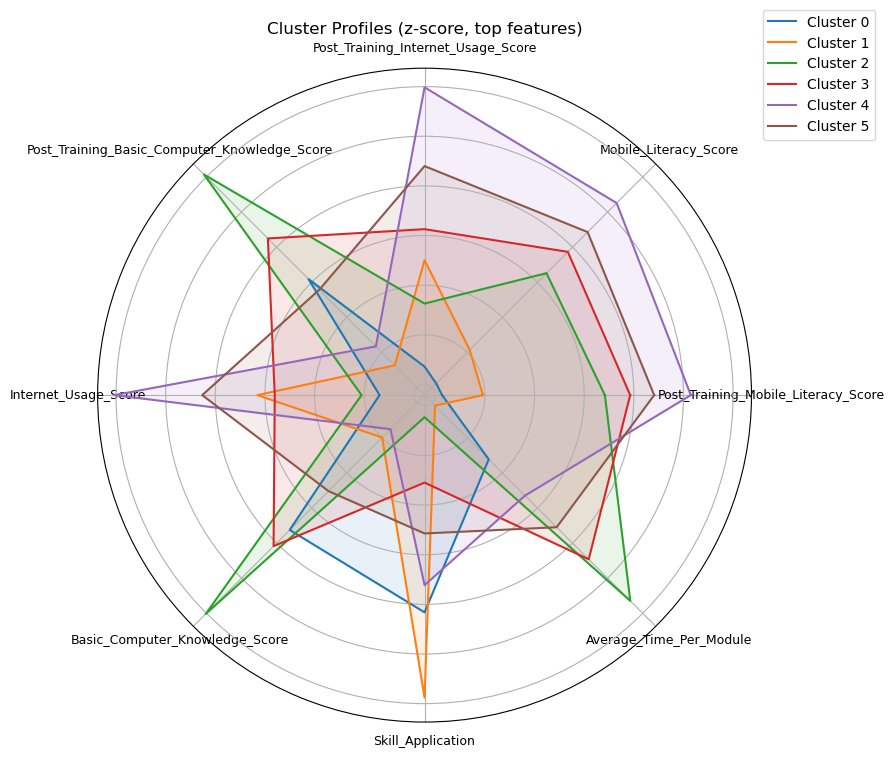

In [58]:
key_features = cluster_profiles.var().sort_values(ascending=False).head(8).index.tolist()
radar_all_clusters(cluster_profiles, key_features,fig=(9,9))

## Fuzzy K-Means

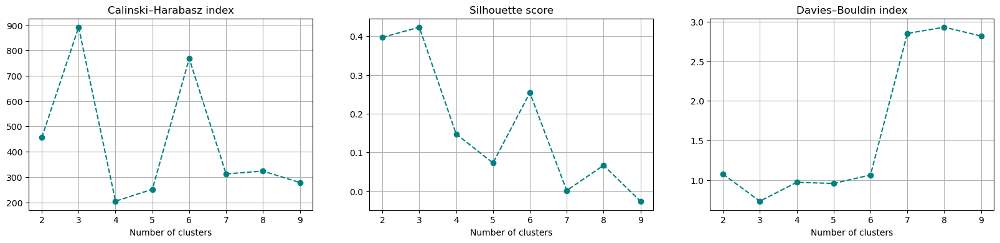

In [59]:
from sklearn.decomposition import PCA
import skfuzzy as fuzz
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score

cols = ['Cluster']
data = df_scaled.drop(['Cluster'], axis=1) if all(col in df_scaled.columns for col in cols) else df_scaled.copy()

pca = PCA(n_components=2) #Smanjenje dimenzionalnosti na 2 komponente
pca_result = pca.fit_transform(data)

calinski = []
siluette = []
davies = []

num_cluster=np.arange(2,10)

for n in num_cluster:
    m = 2.0
    cntr, u, u0, d, Jm, p, fpc = fuzz.cluster.cmeans(
        data.T, c=n, m=m, error=1e-5, maxiter=300, init=None, seed=42
    )
    labels_hard = u.argmax(axis=0)

    #bkmeans_labels = bkmeans.fit_predict(pca_result)
    calinski.append(calinski_harabasz_score(pca_result, labels_hard))
    siluette.append(silhouette_score(pca_result, labels_hard))
    davies.append(davies_bouldin_score(pca_result, labels_hard))

plt.figure(figsize=(20, 4))
plt.subplot(1, 3, 1)
plt.plot(num_cluster, calinski, 'o',linestyle='--', color='teal')
plt.title(f"Calinski–Harabasz index") #Higher = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(num_cluster, siluette, 'o',linestyle='--', color='teal')
plt.title(f"Silhouette score") #Higher = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(num_cluster, davies, 'o',linestyle='--', color='teal')
plt.title(f"Davies–Bouldin index") #Lower = better
plt.xticks(num_cluster)
plt.xlabel("Number of clusters")
plt.grid()

plt.show()

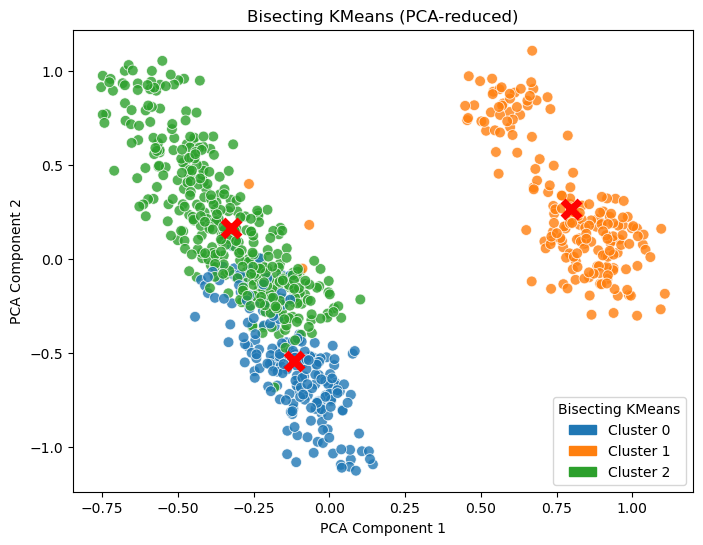

In [60]:
from sklearn.metrics import pairwise_distances_argmin_min
import matplotlib


m = 2.0
cntr, u, u0, d, Jm, p, fpc = fuzz.cluster.cmeans(data.T, c=3, m=m, error=1e-5, maxiter=300, init=None, seed=42)
labels_hard = u.argmax(axis=0)
df_scaled['Cluster']  = labels_hard
results.loc[len(results)]=[
    'Fuzzy K-Means',
    silhouette_score(pca_result, df_scaled['Cluster']),
    calinski_harabasz_score(pca_result, df_scaled['Cluster']),
    davies_bouldin_score(pca_result, df_scaled['Cluster'])]

unique_clusters = np.unique(df_scaled['Cluster'])
cmap=matplotlib.colormaps.get_cmap('tab10') # 10 distinct colors

colors = [cmap(i) for i in range(len(unique_clusters))]

cluster_handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {cluster}")
    for i, cluster in enumerate(unique_clusters)
]
plt.figure(figsize=(8,6))

seaborn.scatterplot(
        x=pca_result[:,0], y=pca_result[:, 1],
        hue=df_scaled['Cluster'] ,
        palette=colors,
        legend='full',
        alpha=0.8,
        s=60,
    )

medoids = []
for c in unique_clusters:
    cluster_points = pca_result[df_scaled['Cluster'] == c]
    # index of closest point to cluster mean
    mean = cluster_points.mean(axis=0)
    idx, _ = pairwise_distances_argmin_min([mean], cluster_points)
    medoids.append(cluster_points[idx[0]])

medoids = np.array(medoids)

plt.scatter(
    medoids[:, 0], medoids[:, 1],
    c="red", s=150, marker="x",linewidths=5, label="Medoids"
)
plt.legend(handles=cluster_handles, title="Bisecting KMeans", loc="lower right")
plt.title("Bisecting KMeans (PCA-reduced)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

In [61]:
centers_dbscan=medoids
centers_scaled = pca.inverse_transform(centers_dbscan)
centers_original = minmax_scaler.inverse_transform(centers_scaled)
cluster_profiles = pd.DataFrame(
    centers_original,
    columns=df_encoded.columns  # original features
)
cluster_profiles.round(2)

,Age,Gender,Education_Level,Household_Income,Location_Type,Basic_Computer_Knowledge_Score,Internet_Usage_Score,Mobile_Literacy_Score,Post_Training_Basic_Computer_Knowledge_Score,Post_Training_Internet_Usage_Score,...,Engagement_Level,Adaptability_Score,Feedback_Rating,Skill_Application,Employment_Impact,Employment_Status_Farmer,Employment_Status_Other,Employment_Status_Self-Employed,Employment_Status_Student,Employment_Status_Unemployed
0,41.04,0.60,0.79,0.44,-0.03,23.99,27.19,28.81,58.99,63.03,...,0.95,74.82,2.94,75.63,0.45,0.27,0.46,0.08,0.19,-0.01
1,40.50,0.56,0.90,0.63,0.25,24.32,23.80,20.13,58.59,58.03,...,0.94,74.67,2.66,76.91,0.23,0.01,-0.01,-0.00,0.03,0.97
2,41.53,0.66,1.08,0.53,0.49,25.91,24.39,26.47,61.64,59.93,...,0.83,74.80,3.16,74.71,0.23,0.24,0.14,0.35,0.25,0.03


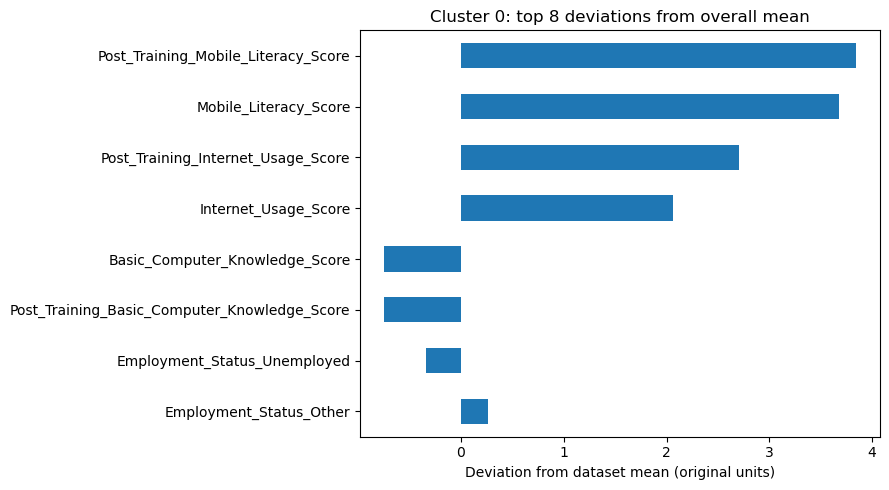

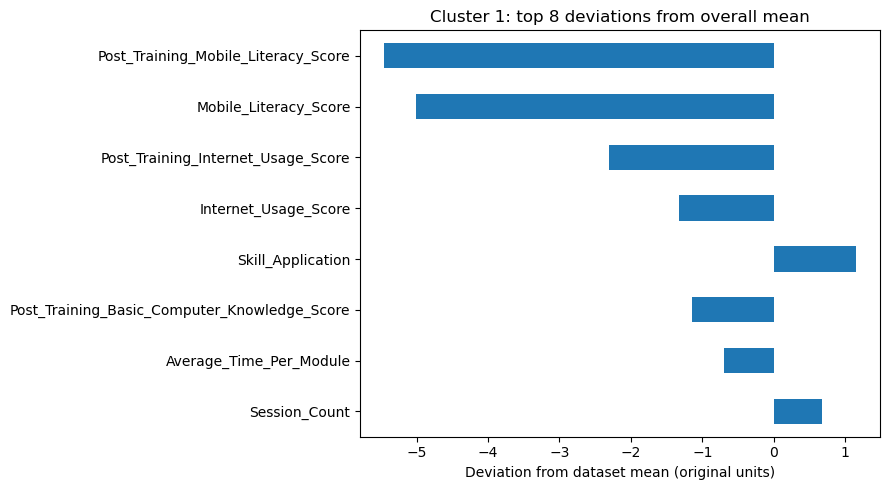

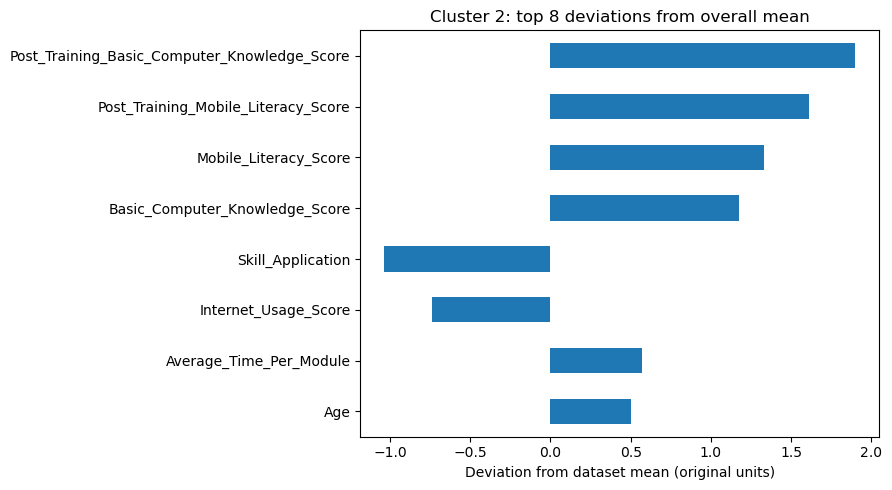

In [62]:
k = 8  # how many top features to show
overall_mean = cluster_profiles.mean(axis=0)
deviation = cluster_profiles - overall_mean   # same units as original features

for i in range(deviation.shape[0]):
    dev_sorted = deviation.iloc[i].sort_values(key=np.abs, ascending=False).head(k)
    plt.figure(figsize=(9, 5))
    dev_sorted.plot(kind='barh')
    plt.gca().invert_yaxis()
    plt.title(f'Cluster {i}: top {k} deviations from overall mean')
    plt.xlabel('Deviation from dataset mean (original units)')
    plt.tight_layout()
    plt.show()

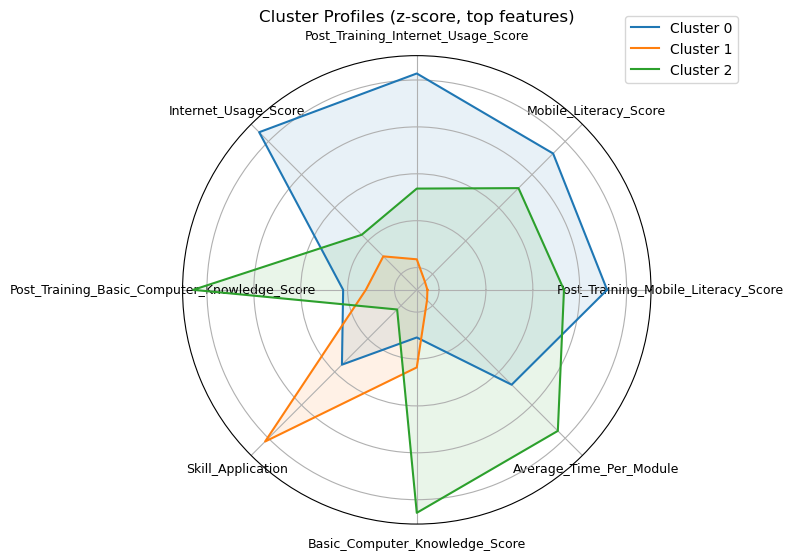

In [63]:
key_features = cluster_profiles.var().sort_values(ascending=False).head(8).index.tolist()
radar_all_clusters(cluster_profiles, key_features,fig=(8,8))

## Analiza modela

In [64]:
results.head(10)

,Model,Silhouette score,Calinski–Harabasz index,Davies-Bouldin score
0,KMeans,0.565898,1930.182389,0.518185
1,DBSCAN,0.561914,762.118191,0.661707
2,Agglomerative Clustering,0.536347,1660.764013,0.517239
3,Mean Shift,0.561914,762.118191,0.661707
4,Birch,0.542776,1732.518332,0.499675
5,OPTICS,0.561914,762.118191,0.661707
6,Gaussian Mixture,0.522430,2053.433503,0.561322
7,Spectral,0.556287,1845.664810,0.523327
8,Bisecting KMeans,0.533583,2156.293875,0.564434
9,Fuzzy K-Means,0.423470,891.911934,0.734049


In [65]:
n = len(results)

def rank_to_points(series, ascending):
    # rank: 1 = best; points: n, n-1, ..., 1
    ranks = series.rank(method="min", ascending=ascending).astype(int)
    return (n - ranks + 1)

scored = results.copy()
scored["Silhouette_pts"] = rank_to_points(scored['Silhouette score'], ascending=False)
scored["Calinski_pts"]   = rank_to_points(scored['Calinski–Harabasz index'], ascending=False)
scored["Davies_pts"]     = rank_to_points(scored['Davies-Bouldin score'],  ascending=True)

scored["Total_pts"] = scored[["Silhouette_pts", "Calinski_pts", "Davies_pts"]].sum(axis=1)

leaderboard = scored.sort_values("Total_pts", ascending=False)

out = leaderboard[["Model", 'Silhouette score', "Silhouette_pts",'Calinski–Harabasz index', "Calinski_pts",
                   'Davies-Bouldin score',  "Davies_pts","Total_pts"]]

display(out.head(n))
out[['Model','Total_pts']].head(n)


,Model,Silhouette score,Silhouette_pts,Calinski–Harabasz index,Calinski_pts,Davies-Bouldin score,Davies_pts,Total_pts
0,KMeans,0.565898,10,1930.182389,8,0.518185,8,26
4,Birch,0.542776,5,1732.518332,6,0.499675,10,21
7,Spectral,0.556287,6,1845.664810,7,0.523327,7,20
2,Agglomerative Clustering,0.536347,4,1660.764013,5,0.517239,9,18
8,Bisecting KMeans,0.533583,3,2156.293875,10,0.564434,5,18
6,Gaussian Mixture,0.522430,2,2053.433503,9,0.561322,6,17
1,DBSCAN,0.561914,9,762.118191,3,0.661707,4,16
3,Mean Shift,0.561914,9,762.118191,3,0.661707,4,16
5,OPTICS,0.561914,9,762.118191,3,0.661707,4,16
9,Fuzzy K-Means,0.423470,1,891.911934,4,0.734049,1,6


,Model,Total_pts
0,KMeans,26
4,Birch,21
7,Spectral,20
2,Agglomerative Clustering,18
8,Bisecting KMeans,18
6,Gaussian Mixture,17
1,DBSCAN,16
3,Mean Shift,16
5,OPTICS,16
9,Fuzzy K-Means,6


### KMeans

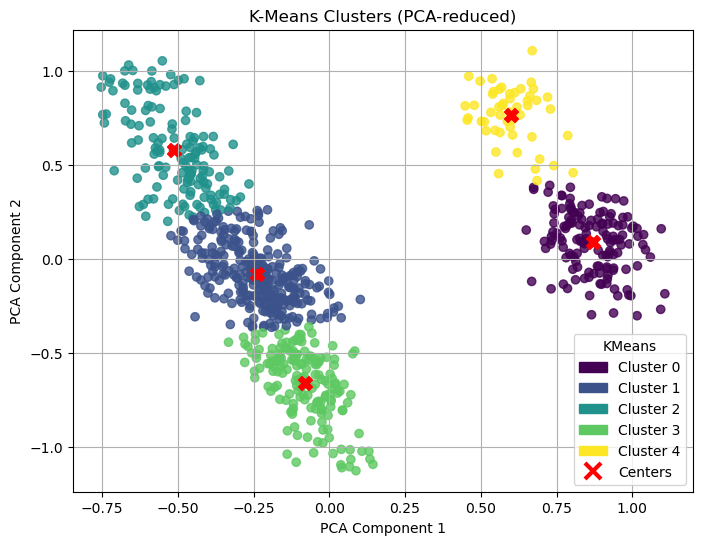

In [66]:
kmeans = KMeans(n_clusters=5, random_state=18)
df_scaled['Cluster'] = kmeans.fit_predict(pca_result)

plt.figure(figsize=(8, 6))

scatter = plt.scatter(
    pca_result[:, 0], pca_result[:, 1],
    c=df_scaled['Cluster'], cmap='viridis', alpha=0.8
)

centers = kmeans.cluster_centers_
plt.scatter(
    centers[:, 0], centers[:, 1],
    c='red', s=100, marker='X'
)

unique_clusters = np.unique(df_scaled['Cluster'])
colors = [scatter.cmap(scatter.norm(c)) for c in unique_clusters]

cluster_handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {cluster}")
    for i, cluster in enumerate(unique_clusters)
]

center_handle = plt.Line2D(
    [0], [0], marker='x', color='red', markersize=12, linewidth=0,
    markeredgewidth=3, label="Centers"
)

plt.legend(handles=cluster_handles+[center_handle], title="KMeans", loc="lower right")

plt.title('K-Means Clusters (PCA-reduced)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.grid(True)
plt.show()

kmeans_labels=df_scaled['Cluster']


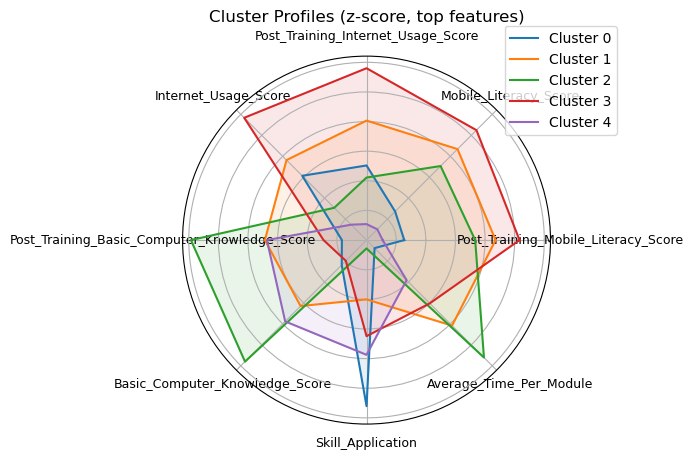

In [67]:
centers_pca=kmeans.cluster_centers_
centers_scaled = pca.inverse_transform(centers_pca)
centers_original = minmax_scaler.inverse_transform(centers_scaled)
cluster_profiles = pd.DataFrame(
    centers_original,
    columns=df_encoded.columns  # original features
)
cluster_profiles.round(2)
key_features = cluster_profiles.var().sort_values(ascending=False).head(8).index.tolist()
radar_all_clusters(cluster_profiles, key_features,fig=(7,7))


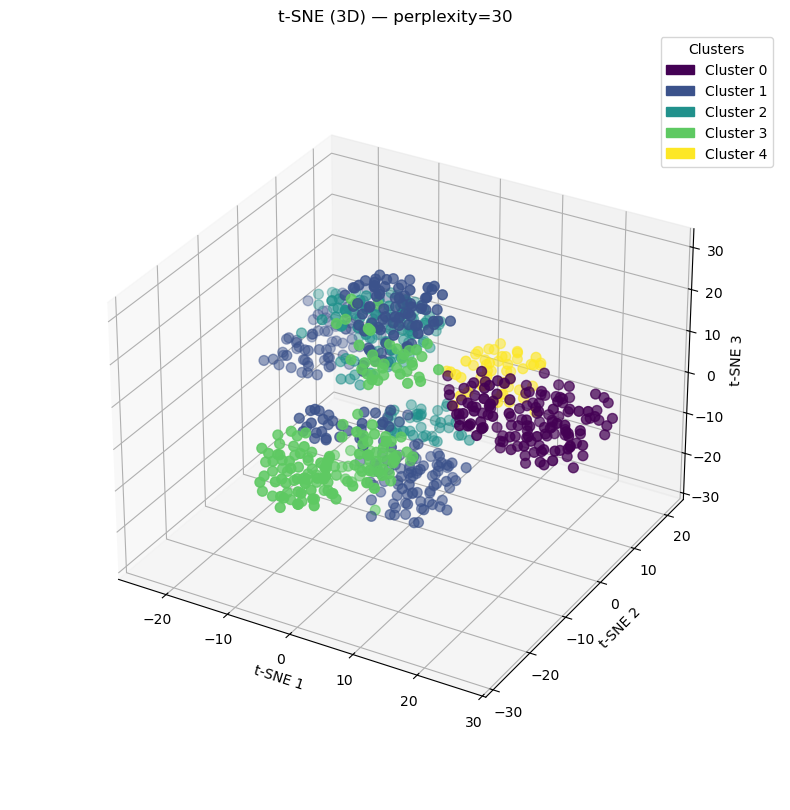

In [68]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# 1) Use all numeric features for t-SNE (drop any pre-existing cluster cols)
X = df_scaled.select_dtypes(include=[np.number]).copy()
for col in ["Cluster", "cluster", "label", "labels"]:
    if col in X.columns:
        X = X.drop(columns=[col])

y = kmeans_labels.to_numpy()

# 2) Safe perplexity (must be < n_samples/3)
n = len(X)
max_perp = max(5, min(50, (n - 1) // 3))
perp = min(30, max_perp)

tsne = TSNE(
    n_components=3,
    perplexity=perp,
    learning_rate="auto",
    init="pca",
    random_state=42
)
X_tsne3 = tsne.fit_transform(X)

# 3) 3D plot
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(projection="3d")

sc = ax.scatter(
    X_tsne3[:, 0], X_tsne3[:, 1], X_tsne3[:, 2],
    c=y, cmap="viridis", s=50
)

ax.set(
    title=f"t-SNE (3D) — perplexity={perp}",
    xlabel="t-SNE 1", ylabel="t-SNE 2", zlabel="t-SNE 3"
)

# 4) Cluster legend (mapped to actual colors)
clusters = np.unique(y)
colors = [sc.cmap(sc.norm(c)) for c in clusters]
handles = [mpatches.Patch(color=col, label=f"Cluster {cl}")
           for col, cl in zip(colors, clusters)]
ax.legend(handles=handles, title="Clusters", loc="best")
ax.set_box_aspect(None, zoom=0.85)
plt.show()


In [69]:
data_kmeans=df.copy()
data_kmeans['Cluster']=df_scaled['Cluster']

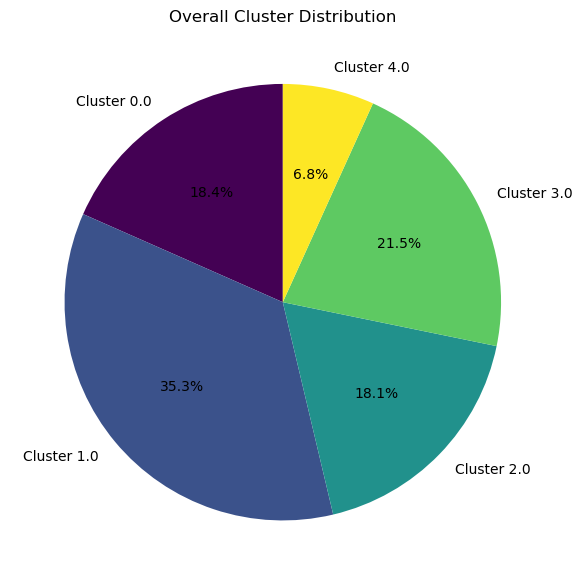

In [70]:
cluster_counts = data_kmeans["Cluster"].value_counts().sort_index()

# Pie chart
plt.figure(figsize=(6, 6))
plt.pie(
    cluster_counts,
    labels=[f"Cluster {c}" for c in cluster_counts.index],
    autopct="%1.1f%%",
    startangle=90,
    colors=plt.cm.viridis(np.linspace(0, 1, len(cluster_counts)))
)
plt.title("Overall Cluster Distribution")
plt.tight_layout()
plt.show()


In [71]:
def plot_cluster_distribution_by_feature(df,feature):
    categories = df[feature].unique()
    fig, axes = plt.subplots(1, len(categories), figsize=(5 * len(categories), 5))
    if len(categories) == 1:
        axes = [axes]  # ensure iterable if only one category

    for ax, cat in zip(axes, categories):
        counts = df[df[feature] == cat]["Cluster"].value_counts().sort_index()
        ax.pie(
            counts,
            labels=[f"Cluster {c}" for c in counts.index],
            autopct="%1.1f%%",
            startangle=90,
            colors=plt.cm.viridis(np.linspace(0, 1, len(counts)))
        )
        ax.set_title(f"{feature}: {cat}")
    plt.suptitle(f"Cluster distribution by {feature}", fontsize=14)
    plt.tight_layout()
    plt.show()

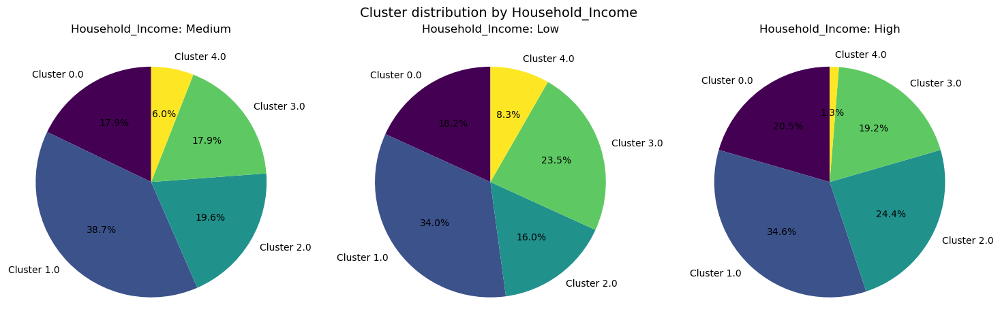

In [72]:
plot_cluster_distribution_by_feature(df=data_kmeans,feature='Household_Income')

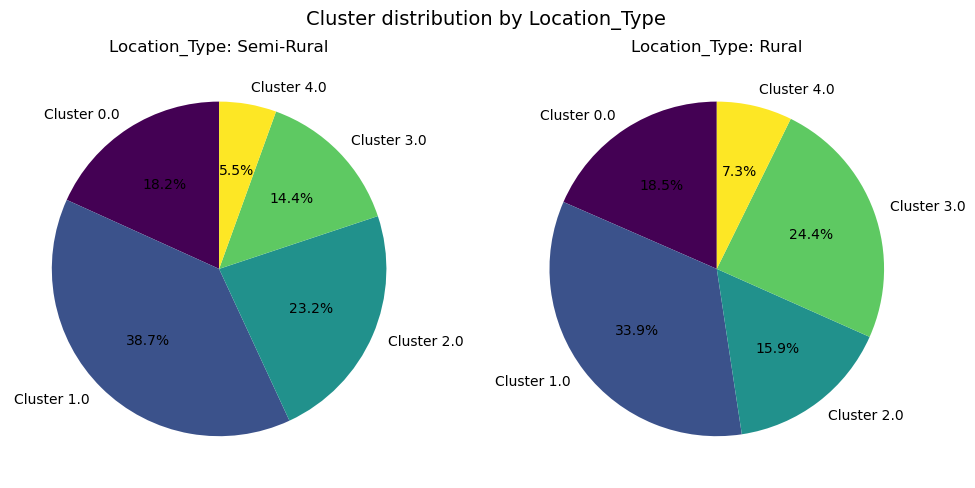

In [73]:
plot_cluster_distribution_by_feature(df=data_kmeans,feature='Location_Type')

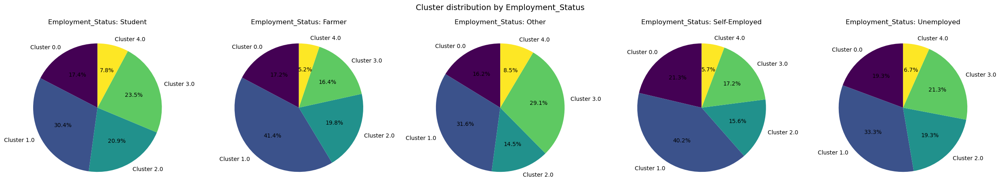

In [74]:
plot_cluster_distribution_by_feature(df=data_kmeans,feature='Employment_Status')

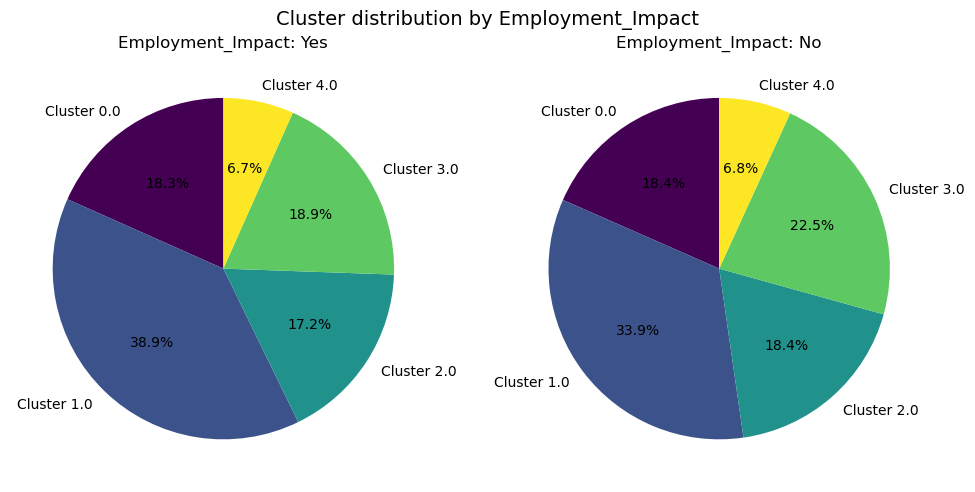

In [75]:
plot_cluster_distribution_by_feature(df=data_kmeans,feature='Employment_Impact')

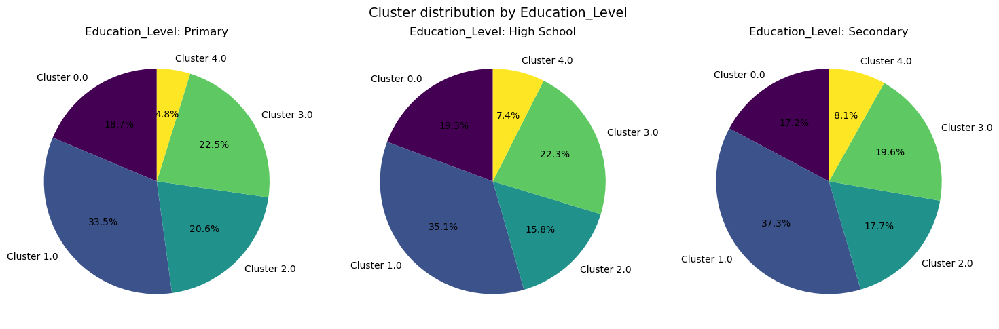

In [76]:
plot_cluster_distribution_by_feature(df=data_kmeans,feature='Education_Level')

| Cluster | Household Income   | Location        | Employment Status       | Employment Impact | Education Level             |
|---------|--------------------|-----------------|-------------------------|-------------------|-----------------------------|
| 4       | Low                | Slightly rural  | Student, Unemployed     | Not employed      | Secondary, High School      |
| 3       | Low                | Rural           | Student, Unemployed     | Not employed      | Primary, High School        |
| 2       | High/Medium        | Semi-rural      | Student, Farmer         | Not employed      | Primary, Secondary School   |
| 1       | Medium/High        | Semi-rural      | Farmer, Self-employed   | Employed          | Secondary, High School      |
| 0       | High/Low           | Slightly rural  | Self-employed, Unemployed | Not employed    | Primary, High Sch

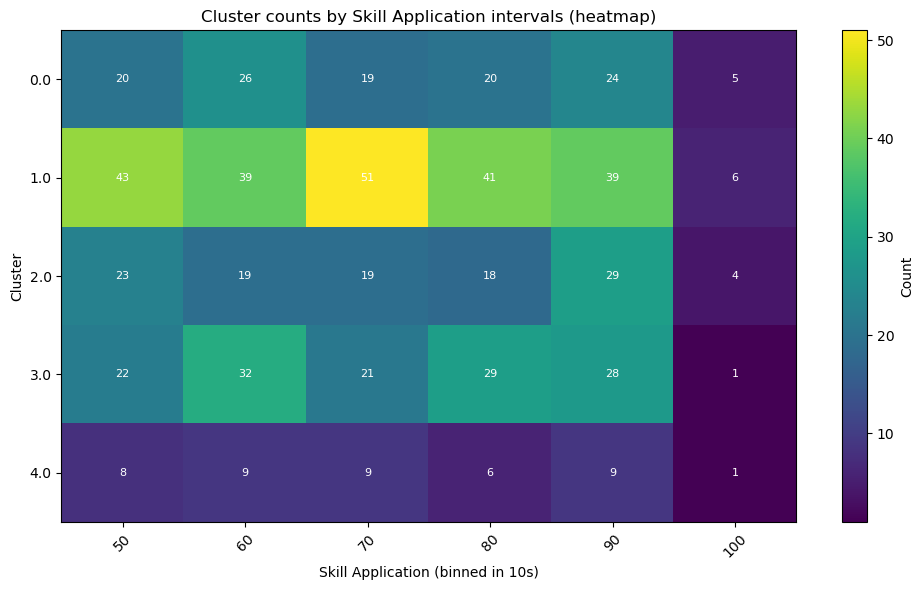

In [77]:
import numpy as np
import matplotlib.pyplot as plt

# Bin Skill_Application into intervals of 10
binned = (
    data_kmeans
    .assign(Skill_Bin=(data_kmeans["Skill_Application"] // 10) * 10)
    .groupby(["Skill_Bin", "Cluster"])
    .size()
    .unstack(fill_value=0)
)

# Plot heatmap
fig, ax = plt.subplots(figsize=(10, 6))
im = ax.imshow(binned.T, aspect="auto", cmap="viridis")

# Axis labels
ax.set_xticks(range(len(binned.index)))
ax.set_xticklabels(binned.index, rotation=45)
ax.set_yticks(range(len(binned.columns)))
ax.set_yticklabels(binned.columns)

ax.set_xlabel("Skill Application (binned in 10s)")
ax.set_ylabel("Cluster")
ax.set_title("Cluster counts by Skill Application intervals (heatmap)")

# Annotate values
for j, c in enumerate(binned.columns):
    for i, x in enumerate(binned.index):
        ax.text(i, j, binned.loc[x, c], ha="center", va="center", color="w", fontsize=8)

# Colorbar
fig.colorbar(im, ax=ax, label="Count")
plt.tight_layout()
plt.show()

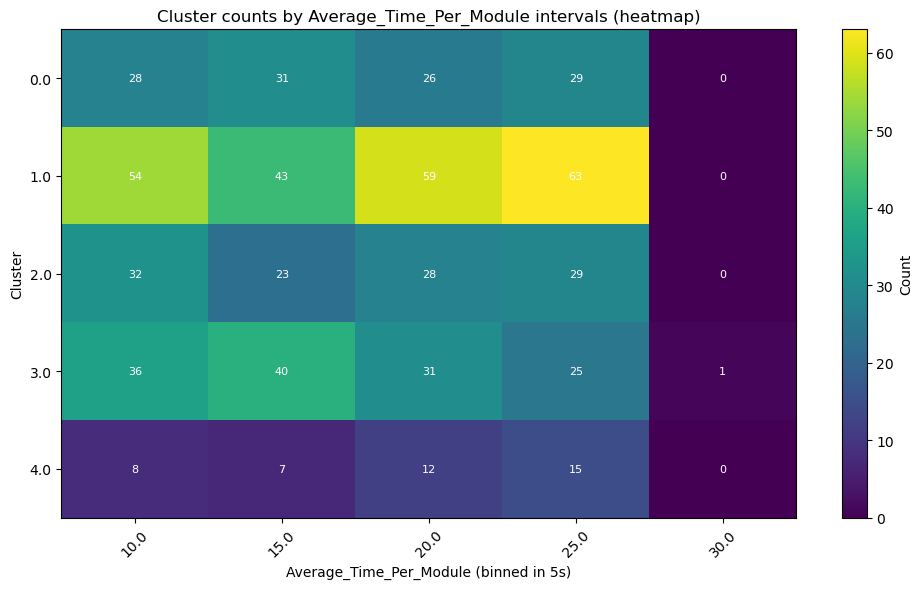

In [78]:
binned = (
    data_kmeans
    .assign(Skill_Bin=(data_kmeans["Average_Time_Per_Module"] // 5) * 5)
    .groupby(["Skill_Bin", "Cluster"])
    .size()
    .unstack(fill_value=0)
)

fig, ax = plt.subplots(figsize=(10, 6))
im = ax.imshow(binned.T, aspect="auto", cmap="viridis")

ax.set_xticks(range(len(binned.index)))
ax.set_xticklabels(binned.index, rotation=45)
ax.set_yticks(range(len(binned.columns)))
ax.set_yticklabels(binned.columns)

ax.set_xlabel("Average_Time_Per_Module (binned in 5s)")
ax.set_ylabel("Cluster")
ax.set_title("Cluster counts by Average_Time_Per_Module intervals (heatmap)")

for j, c in enumerate(binned.columns):
    for i, x in enumerate(binned.index):
        ax.text(i, j, binned.loc[x, c], ha="center", va="center", color="w", fontsize=8)

fig.colorbar(im, ax=ax, label="Count")
plt.tight_layout()
plt.show()


| Cluster | Skill Application Profile            | Average Time Per Module Profile        |
|---------|--------------------------------------|----------------------------------------|
| **1**   | Dominant cluster, highest counts across bins (40–50); peak around 70 | Dominant cluster, peaks at 20–25s (59–63); longer study times |
| **2**   | Moderate (18–29 per bin), evenly spread | Prefers shorter times (10–15s: 32, 23); quick learners |
| **3**   | Moderate (21–32 per bin), stronger at 60 & 80–90 | Peaks at 10–15s (36–40); medium-time learners |
| **0**   | Smaller (19–26 per bin), consistent but flat | Stable (26–31 per bin), no clear preference |
| **4**   | Very small (<10 per bin), nearly absent at 100 | Very small (7–15), scattered, almost absent at 30s |

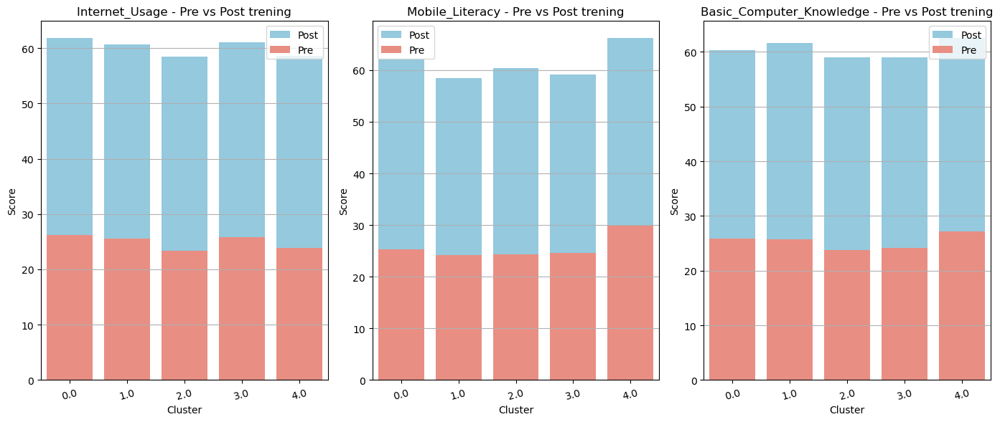

In [79]:
atributtes = ['Internet_Usage', 'Mobile_Literacy', 'Basic_Computer_Knowledge']
plt.figure(figsize=(14, 6))
for i, attr in enumerate(atributtes):
    plt.subplot(1, 3, i+1)
    seaborn.barplot(
        x=data_kmeans['Cluster'], 
        y=f'Post_Training_{attr}_Score', 
        data=data_kmeans, 
        color='skyblue', 
        label='Post',
        errorbar=None
    )
    seaborn.barplot(
        x=data_kmeans['Cluster'], 
        y=f'{attr}_Score', 
        data=data_kmeans, 
        color='salmon',
        label='Pre',
        errorbar=None
    )
    plt.title(f'{attr} - Pre vs Post trening')
    plt.ylabel('Score')
    plt.xticks(rotation=15)  
    plt.legend(loc='best')
    plt.grid(axis='y')
plt.tight_layout()
plt.show()

| Cluster | Internet Usage (Pre → Post) | Mobile Literacy (Pre → Post) | Basic Computer Knowledge (Pre → Post) |
|---------|-----------------------------|-------------------------------|---------------------------------------|
| 0       | ~26 → ~63                   | ~25 → ~61                     | ~26 → ~60                             |
| 1       | ~25 → ~61                   | ~24 → ~59                     | ~26 → ~62                             |
| 2       | ~24 → ~59                   | ~24 → ~61                     | ~24 → ~59                             |
| 3       | ~26 → ~62                   | ~25 → ~60                     | ~25 → ~59                             |
| 4       | ~24 → ~61                   | **30 → 64** (highest gain)     | **27 → 61** (stronger baseline)       |
| **Overall** | **~25 → ~61**            | **~26 → ~61**                 | **~26 → ~60**                         |

### DBSCAN

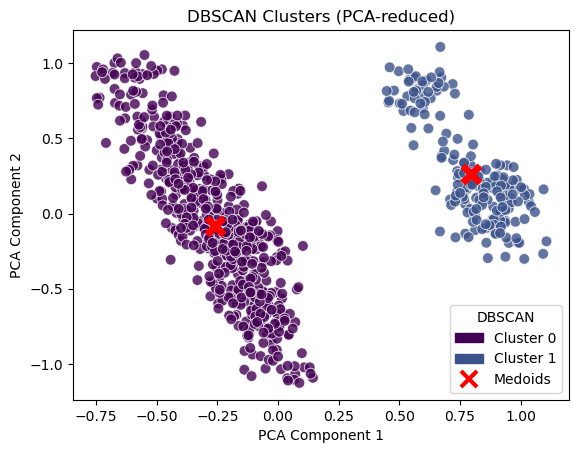

In [80]:
from sklearn.metrics import pairwise_distances_argmin_min

dbscan = DBSCAN(eps=0.2, min_samples=5)
df_scaled['Cluster']  = dbscan.fit_predict(pca_result)

unique_clusters = np.unique(df_scaled['Cluster'])
colors = [scatter.cmap(scatter.norm(c)) for c in unique_clusters]

cluster_handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {cluster}")
    for i, cluster in enumerate(unique_clusters)
]
seaborn.scatterplot(
        x=pca_result[:,0], y=pca_result[:, 1],
        hue=df_scaled['Cluster'] ,
        palette=colors,
        legend='full',
        alpha=0.8,
        s=60,
    )

medoids = []
for c in unique_clusters:
    cluster_points = pca_result[df_scaled['Cluster'] == c]
    mean = cluster_points.mean(axis=0)
    idx, _ = pairwise_distances_argmin_min([mean], cluster_points)
    medoids.append(cluster_points[idx[0]])

medoids = np.array(medoids)

plt.scatter(medoids[:, 0], medoids[:, 1],
    c="red", s=150, marker="x",linewidths=5, label="Medoids"
)
medoid_handle = plt.Line2D(
    [0], [0], marker='x', color='red', markersize=12, linewidth=0,
    markeredgewidth=3, label="Medoids"
)

plt.legend(handles=cluster_handles+[medoid_handle], title="DBSCAN", loc="lower right")
plt.title("DBSCAN Clusters (PCA-reduced)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

dbscan_labels=df_scaled['Cluster']

In [81]:
data_dbscan=df.copy()
data_dbscan['Cluster']=df_scaled['Cluster']

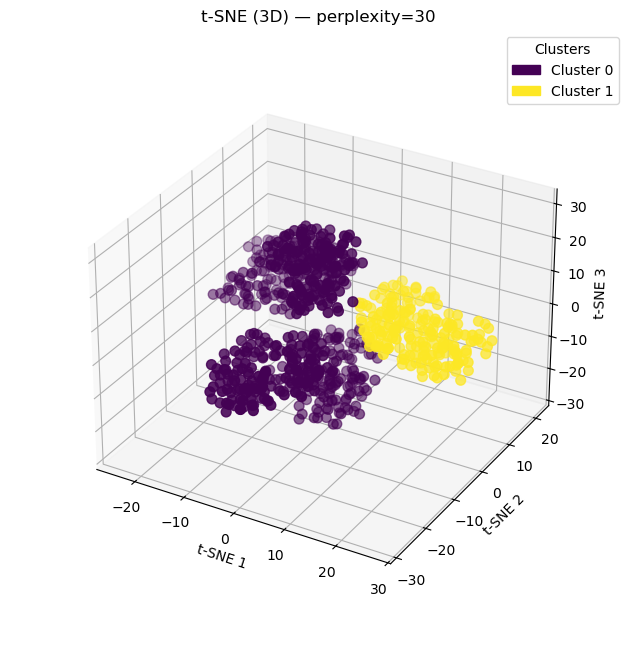

In [82]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# 1) Use all numeric features for t-SNE (drop any pre-existing cluster cols)
X = df_scaled.select_dtypes(include=[np.number]).copy()
for col in ["Cluster", "cluster", "label", "labels"]:
    if col in X.columns:
        X = X.drop(columns=[col])

y = dbscan_labels.to_numpy()

# 2) Safe perplexity (must be < n_samples/3)
n = len(X)
max_perp = max(5, min(50, (n - 1) // 3))
perp = min(30, max_perp)

tsne = TSNE(
    n_components=3,
    perplexity=perp,
    learning_rate="auto",
    init="pca",
    random_state=42
)
X_tsne3 = tsne.fit_transform(X)

# 3) 3D plot
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(projection="3d")

sc = ax.scatter(
    X_tsne3[:, 0], X_tsne3[:, 1], X_tsne3[:, 2],
    c=y, cmap="viridis", s=50
)

ax.set(
    title=f"t-SNE (3D) — perplexity={perp}",
    xlabel="t-SNE 1", ylabel="t-SNE 2", zlabel="t-SNE 3"
)

# 4) Cluster legend (mapped to actual colors)
clusters = np.unique(y)
colors = [sc.cmap(sc.norm(c)) for c in clusters]
handles = [mpatches.Patch(color=col, label=f"Cluster {cl}")
           for col, cl in zip(colors, clusters)]
ax.legend(handles=handles, title="Clusters", loc="best")
ax.set_box_aspect(None, zoom=0.85)
plt.show()

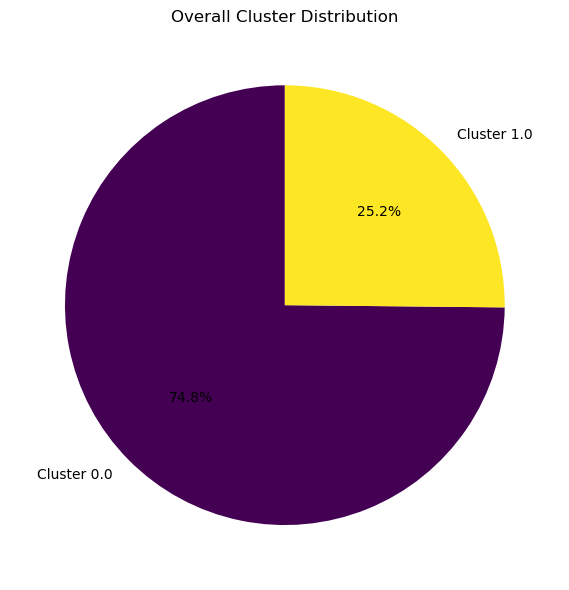

In [83]:
cluster_counts = data_dbscan["Cluster"].value_counts().sort_index()
plt.figure(figsize=(6, 6))
plt.pie(
    cluster_counts,
    labels=[f"Cluster {c}" for c in cluster_counts.index],
    autopct="%1.1f%%",
    startangle=90,
    colors=plt.cm.viridis(np.linspace(0, 1, len(cluster_counts)))
)
plt.title("Overall Cluster Distribution")
plt.tight_layout()
plt.show()


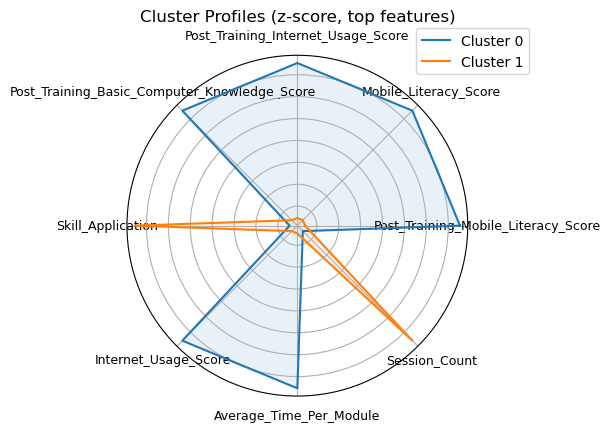

In [84]:
centers_dbscan=medoids
centers_scaled = pca.inverse_transform(centers_dbscan)
centers_original = minmax_scaler.inverse_transform(centers_scaled)
cluster_profiles = pd.DataFrame(
    centers_original,
    columns=df_encoded.columns  # original features
)
cluster_profiles.round(2)
key_features = cluster_profiles.var().sort_values(ascending=False).head(8).index.tolist()
radar_all_clusters(cluster_profiles, key_features,fig=(6,6))

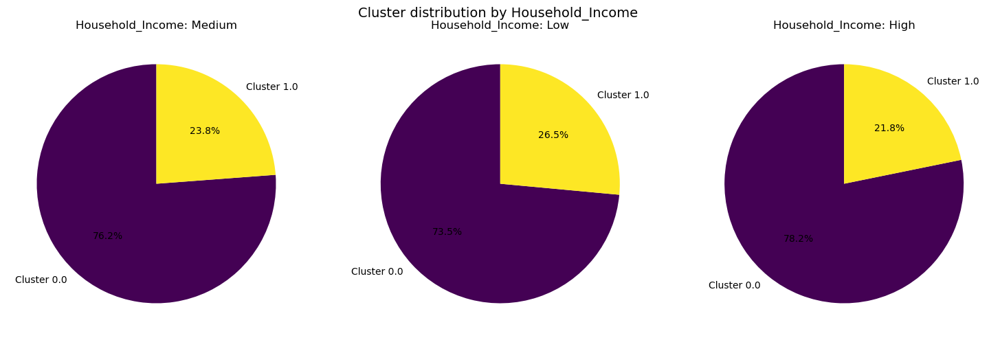

In [85]:
plot_cluster_distribution_by_feature(df=data_dbscan,feature='Household_Income')

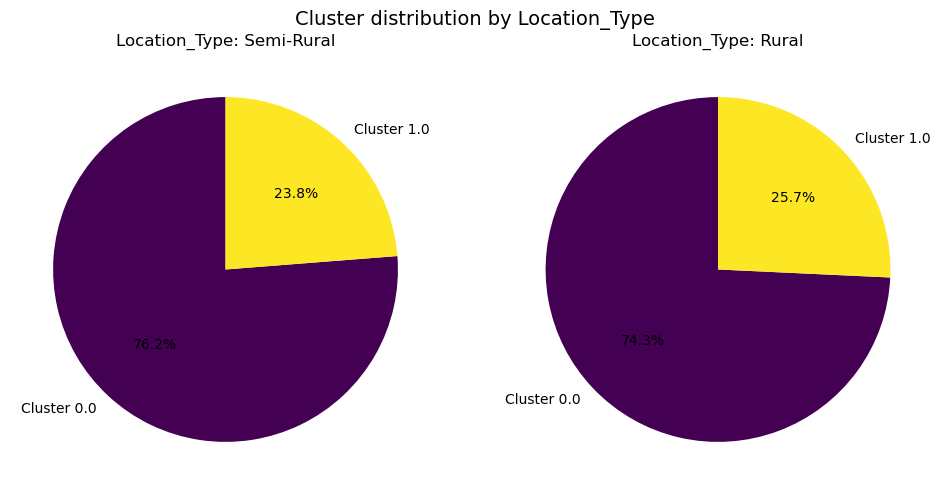

In [86]:
plot_cluster_distribution_by_feature(df=data_dbscan,feature='Location_Type')

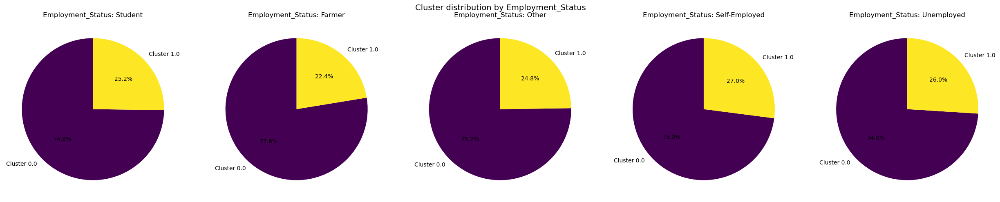

In [87]:
plot_cluster_distribution_by_feature(df=data_dbscan,feature='Employment_Status')

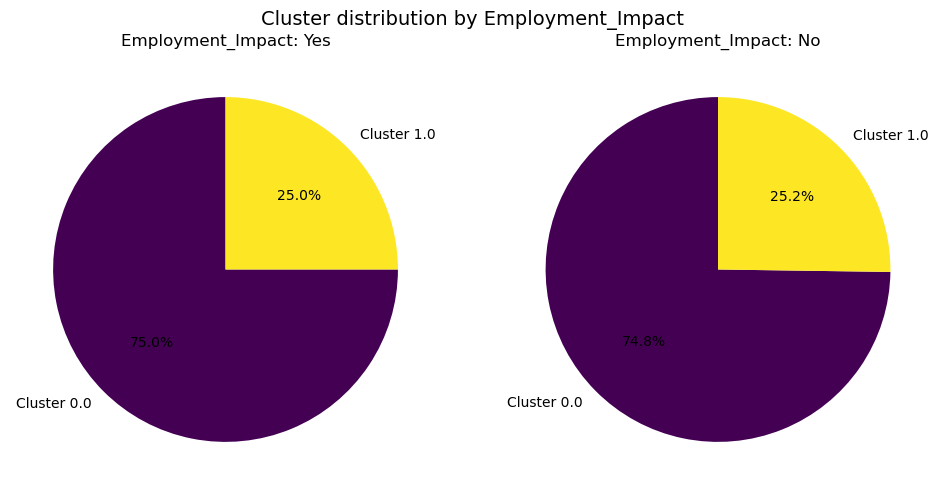

In [88]:
plot_cluster_distribution_by_feature(df=data_dbscan,feature='Employment_Impact')

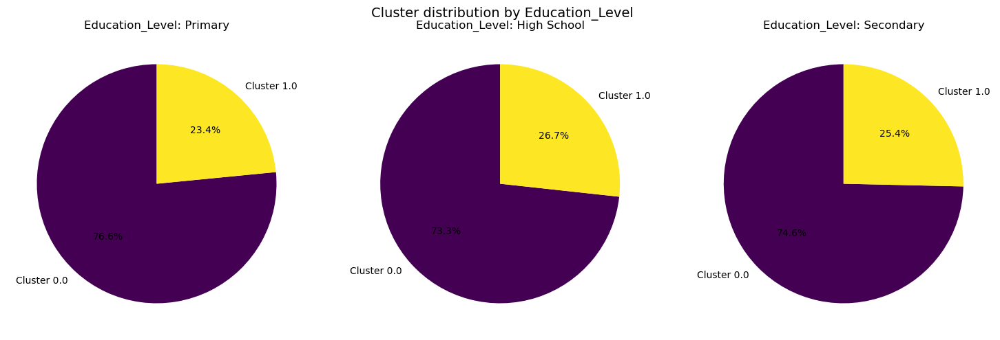

In [89]:
plot_cluster_distribution_by_feature(df=data_dbscan,feature='Education_Level')

| Cluster | Household Income | Location        | Employment Status | Employment Impact | Education Level                 |
|---------|------------------|-----------------|-------------------|-------------------|---------------------------------|
| 1       | Low              | More rural      | Self-employed     | Not important     | High School                     |
| 0       | High/Medium      | More semi-rural | Farmer            | Not important     | Primary and Secondary School    |

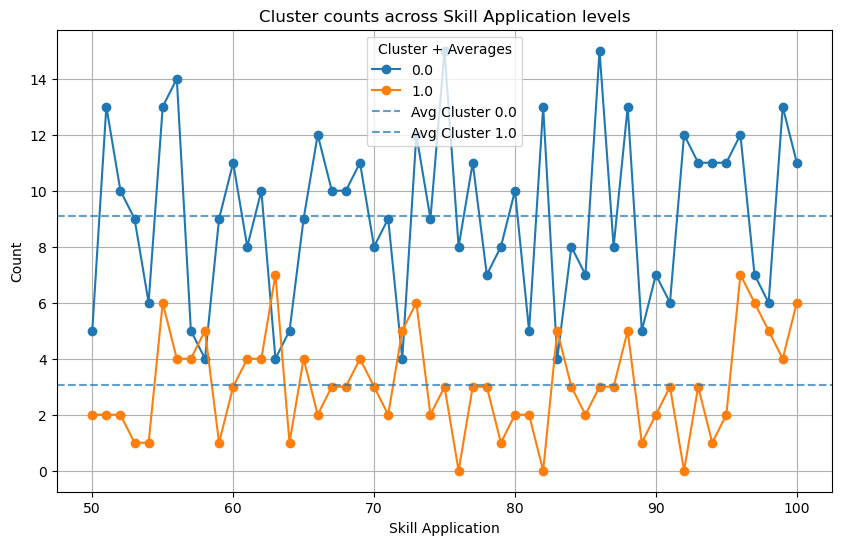

In [90]:
skill_cluster_counts = data_dbscan.groupby(["Skill_Application", "Cluster"]).size().unstack(fill_value=0)

ax = skill_cluster_counts.plot(
    kind="line", marker="o", figsize=(10, 6)
)

# Add average lines for each cluster
for cluster in skill_cluster_counts.columns:
    mean_val = skill_cluster_counts[cluster].mean()
    ax.axhline(mean_val, linestyle="--", alpha=0.7, 
               label=f"Avg Cluster {cluster}")

plt.title("Cluster counts across Skill Application levels")
plt.xlabel("Skill Application")
plt.ylabel("Count")
plt.legend(title="Cluster + Averages")
plt.grid(True)
plt.show()

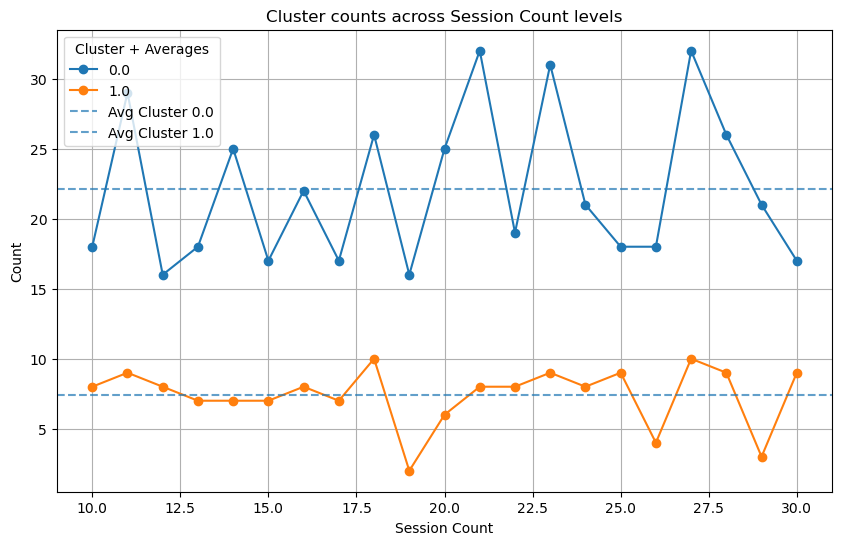

In [91]:
skill_cluster_counts = data_dbscan.groupby(["Session_Count", "Cluster"]).size().unstack(fill_value=0)

ax = skill_cluster_counts.plot(
    kind="line", marker="o", figsize=(10, 6)
)

# Add average lines for each cluster
for cluster in skill_cluster_counts.columns:
    mean_val = skill_cluster_counts[cluster].mean()
    ax.axhline(mean_val, linestyle="--", alpha=0.7, 
               label=f"Avg Cluster {cluster}")

plt.title("Cluster counts across Session Count levels")
plt.xlabel("Session Count")
plt.ylabel("Count")
plt.legend(title="Cluster + Averages")
plt.grid(True)
plt.show()

| Chart Title                              | Cluster | Count Trend                          | Average Count | Key Insight                                                                 |
|------------------------------------------|---------|--------------------------------------|---------------|------------------------------------------------------------------------------|
| Skill Application Levels                 | 0.0     | Stable, peaks around 70–85           | Higher        | Broadly engaged users across skill levels                                   |
|                                          | 1.0     | Fluctuates, dip at 75, spike at 100  | Lower         | Possibly niche or high-skill but underutilized profiles                     |
| Session Count Levels                     | 0.0     | Consistently high across all levels  | Higher        | High-engagement users with steady participation                             |
|                                          | 1.0     | Lower and steady across sessions     | Lower         | Sporadic or specialized behavior, may need targeted analysis                |

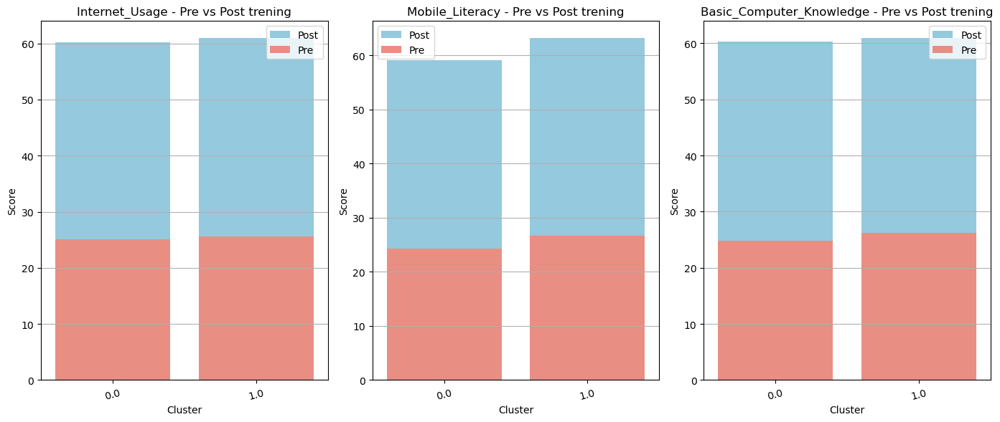

In [92]:
atributtes = ['Internet_Usage', 'Mobile_Literacy', 'Basic_Computer_Knowledge']
plt.figure(figsize=(14, 6))
for i, attr in enumerate(atributtes):
    plt.subplot(1, 3, i+1)
    seaborn.barplot(
        x=data_dbscan['Cluster'], 
        y=f'Post_Training_{attr}_Score', 
        data=data_dbscan, 
        color='skyblue', 
        label='Post',
        errorbar=None
    )
    seaborn.barplot(
        x=data_dbscan['Cluster'], 
        y=f'{attr}_Score', 
        data=data_dbscan, 
        color='salmon',
        label='Pre',
        errorbar=None
    )
    plt.title(f'{attr} - Pre vs Post trening')
    plt.ylabel('Score')
    plt.xticks(rotation=15)  
    plt.legend(loc='best')
    plt.grid(axis='y')
plt.tight_layout()
plt.show()

| Cluster  | Internet Usage (Pre → Post) | Mobile Literacy (Pre → Post) | Basic Computer Knowledge (Pre → Post) |
|----------|------------------------------|-------------------------------|---------------------------------------|
| 0        | ~25 → ~60                   | ~24 → ~59                     | ~25 → ~60                             |
| 1        | ~26 → ~61                   | ~27 → ~64                     | ~26 → ~61                             |